# PRNN Assignment 2 Group 12

# MLP

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
from itertools import combinations

## Q2 i


### Preprocessing


In [3]:
# Load the dataset
data_path = './datasets/regression_data_multilinear_group_12_train.txt'

# Adjusting the data loading process to skip the header row
data = np.loadtxt(data_path, skiprows=1)
np.random.seed(42)  # For reproducibility
np.random.shuffle(data)   # Randomly shuffle the data

# Separate features and targets again
X = data[:, :10]  # Features (sensor readings)
y = data[:, 10:]  # Targets (y1, y2, y3 positions)

split_idx1 = int(X.shape[0] * 0.6)
split_idx2 = split_idx1 + int((X.shape[0] - split_idx1) * 0.5)

X_train = X[:split_idx1].T
X_val = X[split_idx1:split_idx2].T
X_test = X[split_idx2:].T
y_train = y[:split_idx1].T
y_val = y[split_idx1:split_idx2].T
y_test = y[split_idx2:].T

In [2]:
class Model_Regression_lin:
    def __init__(self, layer_dims, lambd=0.0, reg_type=2, drop_prob=0.0) -> None:
        self.parameters = {}
        self.caches = []
        self.grads = {}
        self.lambd = lambd
        self.reg_type = reg_type
        self.drop_prob = drop_prob
        self.train = False
        self.layer_dims = layer_dims
        for l in range(1, len(layer_dims)):
            self.parameters['W' + str(l)] = np.random.randn(layer_dims[l],
                                                            layer_dims[l-1]) * 0.01
            self.parameters['b' +
                            str(l)] = np.random.randn(layer_dims[l], 1) * 0.01

    def linear_forward(self, A, W, b):
        Z = np.dot(W, A) + b
        cache = (A, W, b)
        return Z, cache

    def linear_activation_forward(self, A_prev, W, b, activation):
        if activation == "relu":
            Z, linear_cache = self.linear_forward(A_prev, W, b)
            A = np.maximum(0, Z)

        elif activation == "linear":
            Z, linear_cache = self.linear_forward(A_prev, W, b)
            A = Z

        cache = (linear_cache, Z)

        # Implementing dropout
        if self.train:
            keep_prob = 1.0 - self.drop_prob
            D = np.random.rand(A.shape[0], A.shape[1]) < keep_prob
            A = np.multiply(A, D)
            A /= keep_prob
            cache = (cache[0], cache[1], D)

        return A, cache

    def compute_cost(self, AL, Y):
        m = Y.shape[1]
        cost = (0.5/m) * np.sum(np.square(AL - Y))
        cost = np.squeeze(cost)

        if self.lambd != 0.0:
            # Number of layers in the neural network
            L = len(self.parameters) // 2
            regularization_cost = 0

            for l in range(1, L+1):
                regularization_cost += np.sum(np.square(self.parameters['W' + str(
                    l)])) if self.reg_type == 2 else np.sum(np.abs(self.parameters['W' + str(l)]))

            regularization_cost *= (self.lambd / (2 * m))
            cost += regularization_cost

        return cost

    def linear_backward(self, dZ, cache):
        A_prev, W, b = cache
        m = A_prev.shape[1]

        dW = (1./m) * np.dot(dZ, A_prev.T) + (self.lambd / m) * \
            (W if self.reg_type == 2 else np.sign(W))
        db = (1./m) * np.sum(dZ, axis=1, keepdims=True)
        dA_prev = np.dot(W.T, dZ)

        return dA_prev, dW, db

    def linear_activation_backward(self, dA, cache, activation):

        if self.train:
            linear_cache, activation_cache, D = cache
            keep_prob = 1.0 - self.drop_prob
            dA = np.multiply(dA, D)
            # Scale the gradients with respect to the neurons that haven't been dropped
            dA /= keep_prob

        else: 
            linear_cache, activation_cache = cache

        if activation == "relu":
            dZ = np.array(dA, copy=True)
            dZ[activation_cache <= 0] = 0
            dA_prev, dW, db = self.linear_backward(dZ, linear_cache)

        elif activation == "linear":
            dZ = dA
            dA_prev, dW, db = self.linear_backward(dZ, linear_cache)

        return dA_prev, dW, db

    def update_parameters(self, learning_rate):
        L = len(self.parameters) // 2

        for l in range(L):
            self.parameters["W" + str(l+1)] -= learning_rate * \
                self.grads["dW" + str(l+1)]
            self.parameters["b" + str(l+1)] -= learning_rate * \
                self.grads["db" + str(l+1)]

    def L_model_forward(self, X):
        self.caches = []
        A = X
        L = len(self.parameters) // 2

        for l in range(1, L):
            A_prev = A
            A, cache = self.linear_activation_forward(
                A_prev, self.parameters['W' + str(l)], self.parameters['b' + str(l)], 'relu')
            self.caches.append(cache)

        AL, cache = self.linear_activation_forward(
            A, self.parameters['W' + str(L)], self.parameters['b' + str(L)], 'linear')
        self.caches.append(cache)

        return AL

    def L_model_backward(self, AL, Y):
        self.grads = {}
        m = AL.shape[1]  # number of examples
        L = len(self.caches)
        Y = Y.reshape(AL.shape)  # after this line, Y is the same shape as AL

        # Initializing the backpropagation
        dAL = (AL - Y)  # derivative of cost with respect to AL

        # Lth layer (linear -> linear) gradients. Inputs: "dAL, current_cache". Outputs: "grads["dAL"], grads["dWl"], grads["dbl"]"
        current_cache = self.caches[L-1]
        self.grads["dA" + str(L)], self.grads["dW" + str(L)], self.grads["db" + str(
            L)] = self.linear_activation_backward(dAL, current_cache, "linear")

        # Adding L2/L1 regularization term to dW for the last layer caches[L-1][0][1] retrieves W^{[L]}
        self.grads["dW" + str(L)] += (self.lambd / m) * (self.caches[L-1][0][1]
                                                         if self.reg_type == 2 else np.sign(self.caches[L-1][0][1]))

    # Loop from l=L-2 to l=0
        for l in reversed(range(L-1)):
            # lth layer: (RELU -> LINEAR) gradients.
            current_cache = self.caches[l]
            dA_prev_temp, dW_temp, db_temp = self.linear_activation_backward(
                self.grads["dA" + str(l+2)], current_cache, "relu")

            # Adding L2/L1 regularization term to dW for each layer caches[l][0][1] retrieves W^{[l+1]}
            dW_temp += (self.lambd / m) * \
                (self.caches[l][0][1] if self.reg_type ==
                 2 else np.sign(self.caches[l][0][1]))

            self.grads["dA" + str(l+1)] = dA_prev_temp
            self.grads["dW" + str(l+1)] = dW_temp
            self.grads["db" + str(l+1)] = db_temp

In [3]:
class Trainer_reg():
    def __init__(self, num_iterations, learning_rate, batch_size=1) -> None:
        self.num_iterations = num_iterations
        self.learning_rate = learning_rate
        self.batch_size = batch_size

    def mini_batches_generator(self, X, y):
        m = X.shape[1]  # Number of training examples

        # Partition (shuffled_X, shuffled_Y) minus the end case
        num_complete_minibatches = m // self.batch_size
        for k in range(0, num_complete_minibatches):
            mini_batch_X = X[:, k * self.batch_size: (k + 1) * self.batch_size]
            mini_batch_Y = y[:, k * self.batch_size: (k + 1) * self.batch_size]
            yield (mini_batch_X, mini_batch_Y, self.batch_size)

        # Handling the end case (last mini-batch < batch_size)
        if m % self.batch_size != 0:
            mini_batch_X = X[:, num_complete_minibatches * self.batch_size:]
            mini_batch_Y = y[:, num_complete_minibatches * self.batch_size:]
            yield (mini_batch_X, mini_batch_Y, m - num_complete_minibatches * self.batch_size)

    def train(self, model: Model_Regression_lin, X_train, y_train, X_val, y_val, drop=False):
        train_risks = []  # keep track of cost
        val_risks = []  # keep track of validation cost

        # Training loop
        for i in range(self.num_iterations):
            if drop:
                model.train = True
            mini_batches = self.mini_batches_generator(X_train, y_train)

            costs = []

            for mini_batch in mini_batches:
                mini_batch_X_train, mini_batch_y_train, curr_batch_size = mini_batch
                # Forward propagation
                AL = model.L_model_forward(mini_batch_X_train)

                # Compute cost
                cost = model.compute_cost(
                    AL, mini_batch_y_train) * curr_batch_size
                costs.append(cost)

                # if np.absolute(costs_train[-1]-costs_train[-2]) < eps:
                #     break

                # Backward propagation
                model.L_model_backward(AL, mini_batch_y_train)

                # Update parameters
                model.update_parameters(self.learning_rate)

            cost = np.sum(costs) / X_train.shape[1]
            train_risks.append(cost)

            # Validation cost at the end of an epoch
            if X_val is not None and y_val is not None:
                if drop:
                    model.train = False
                AL_val = model.L_model_forward(X_val)
                cost_val = model.compute_cost(AL_val, y_val)
                val_risks.append(cost_val)

            if i % 500 == 0:
                print(
                    f"Train Cost after iteration {i}: {cost} | Val Cost after iteration {i}: {cost_val}")

        print(
            f"Train Cost after iteration {i+1}: {train_risks[-1]} | Val Cost after iteration{i+1}: {val_risks[-1]}")
        Trainer_reg.plot_train_val_risks(train_risks, val_risks)
    
    @staticmethod
    def plot_train_val_risks(tl, vl):
        # Plotting the Risk history to see the convergence
        plt.plot(tl, label='Emprical Risk(Training)')
        plt.plot(vl, label='Emprical Risk(Validation)')
        plt.xlabel('Iteration')
        plt.ylabel('Risk')
        plt.title('Risk Function History')
        plt.legend()
        plt.show()

In [16]:
class Evaluate_reg():
    def __init__(self) -> None:
        pass

    def test(self, model: Model_Regression_lin, X_test, y_test):
        model.train = False
        # Evaluate the model on the test set (simplified evaluation)
        AL_test = model.L_model_forward(X_test)
        test_cost = model.compute_cost(AL_test, y_test)
        print(f"Test cost: {test_cost}")
        return AL_test
    
    # Function to calculate Pearson Correlation Coefficient
    @staticmethod
    def pearson_correlation(actual, predicted):
        numerator = np.sum((actual - np.mean(actual)) *
                        (predicted - np.mean(predicted)))
        denominator = np.sqrt(np.sum((actual - np.mean(actual))**2)
                            * np.sum((predicted - np.mean(predicted))**2))
        return numerator / denominator

    # Function to calculate Mean Squared Error
    @staticmethod
    def root_mean_squared_error(actual, predicted):
        return np.sqrt(np.mean((actual - predicted) ** 2))

    # Function to calculate Mean Absolute Error
    @staticmethod
    def mean_absolute_error(actual, predicted):
        return np.mean(np.abs(actual - predicted))

    @staticmethod
    def get_metrics(y, y_pred):
        # Calculating Pearson Correlation for each target
        pearson_corr = np.array([Evaluate_reg.pearson_correlation(
            y[:, i], y_pred[:, i]) for i in range(y.shape[1])])

        # Calculating MSE and MAE for each target
        rmse = np.array([Evaluate_reg.root_mean_squared_error(y[:, i], y_pred[:, i])
                        for i in range(y.shape[1])])
        mae = np.array([Evaluate_reg.mean_absolute_error(y[:, i], y_pred[:, i])
                        for i in range(y.shape[1])])

        return pearson_corr, rmse, mae
    
    def plot_y(self, X, y, model):
    # Adjusting the correlation plots to include the best fit line and y=x line\
        y_pred = self.test(model, X, y)

        y_pred, y = y_pred.T, y.T
        pc, rmse, mae = Evaluate_reg.get_metrics(y, y_pred)

        plt.figure(figsize=(10, 15))

        for i in range(y.shape[1]):
            # Scatter plot for actual vs predicted
            plt.subplot(3, 1, i+1)
            plt.scatter(y[:, i], y_pred[:, i], alpha=0.5,
                        color='green', marker='x')

            # Best fit line (red line)
            m, b = np.polyfit(y[:, i], y_pred[:, i], 1)  # m = slope, b = intercept
            plt.plot(y[:, i], m * y[:, i] + b, 'r--', label='Best Fit Line')

            # y=x line (black dotted line)
            plt.plot(y[:, i], y[:, i], 'k--', label='y=x Line')

            # Creating custom legend handles
            pc_handle = mlines.Line2D([], [], color='none', marker='None',
                                    label=f'r={pc[i]:.4f}')
            rmse_handle = mlines.Line2D([], [], color='none', marker='None',
                                        label=f'rmse={rmse[i]:.4f}')
            mae_handle = mlines.Line2D([], [], color='none', marker='None',
                                    label=f'mae={mae[i]:.4f}')

            # Adding custom legend handles to the existing legend handles
            handles, labels = plt.gca().get_legend_handles_labels()
            handles.extend([pc_handle, rmse_handle, mae_handle])

            plt.xlabel('Actual')
            plt.ylabel('Predicted')
            plt.title(f'Correlation Plot for y{i+1}')

            # Creating the legend with the custom handles
            plt.legend(handles=handles)

        plt.tight_layout()
        plt.show()

In [13]:
# Define the MLP architecture
layer_dims = [10, 5, 5, 3]  # 3-layer model

# Training hyperparameters
learning_rate = 0.0075
num_iterations = 10000

lambd = 0.1  # Regularization parameter

drop_prob = 0.1  # Dropout Probability

lin_reg_trainer = Trainer_reg(num_iterations, learning_rate, 1000)
lin_reg_tester = Evaluate_reg()

### Testing non-regularised performance


Train Cost after iteration 0: 76.12163555346514 | Val Cost after iteration 0: 77.37791306987437


Train Cost after iteration 500: 12.742263696158929 | Val Cost after iteration 500: 13.012487843792114
Train Cost after iteration 1000: 12.641445633128615 | Val Cost after iteration 1000: 12.847219237142028
Train Cost after iteration 1500: 12.627854836977662 | Val Cost after iteration 1500: 12.82025146120435
Train Cost after iteration 2000: 12.653722509859493 | Val Cost after iteration 2000: 12.881589345268816
Train Cost after iteration 2500: 12.617884124017921 | Val Cost after iteration 2500: 12.822114416685443
Train Cost after iteration 3000: 12.615565192426187 | Val Cost after iteration 3000: 12.816168995146782
Train Cost after iteration 3500: 12.613669653384369 | Val Cost after iteration 3500: 12.804160491903142
Train Cost after iteration 4000: 12.612364790693752 | Val Cost after iteration 4000: 12.809982705972894
Train Cost after iteration 4500: 12.610597732262688 | Val Cost after iteration 4500: 12.795395500882428
Train Cost after iteration 5000: 12.609168313434113 | Val Cost afte

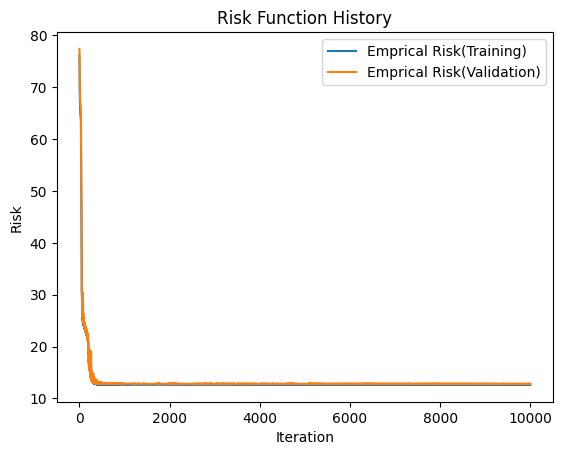

Test cost: 12.744479216894064


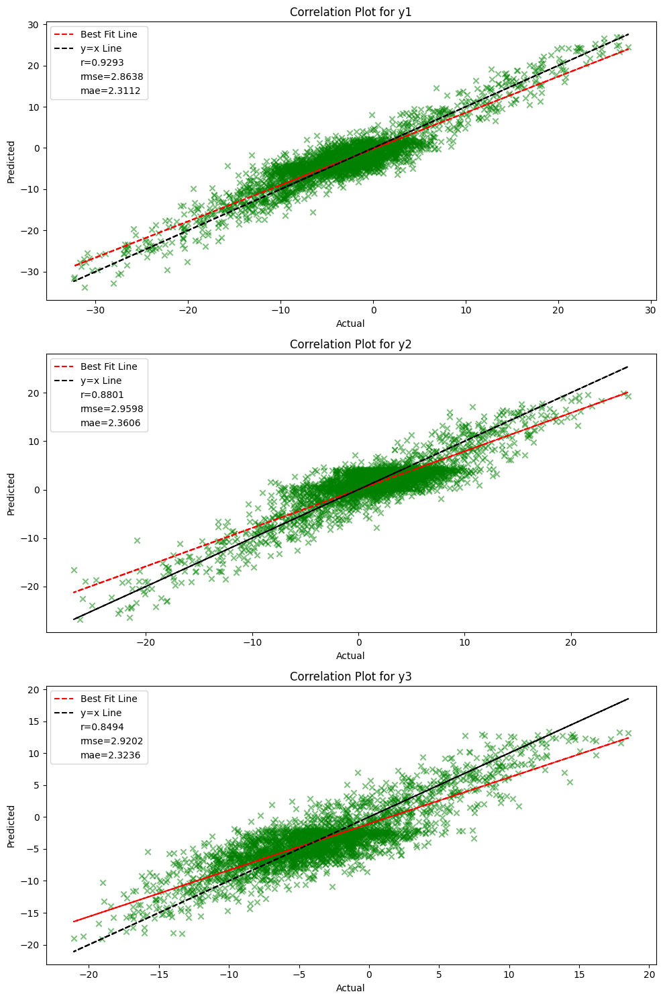

In [14]:
model_no_reg = Model_Regression_lin(layer_dims)
lin_reg_trainer.train(model_no_reg, X_train, y_train, X_val, y_val)
lin_reg_tester.plot_y(X_test, y_test, model_no_reg)

### Testing L2-regularised performance


Train Cost after iteration 0: 76.10309502985275 | Val Cost after iteration 0: 77.36006408369781
Train Cost after iteration 500: 12.686445335653548 | Val Cost after iteration 500: 12.983662229063329
Train Cost after iteration 1000: 12.638933689986539 | Val Cost after iteration 1000: 12.88902380354197
Train Cost after iteration 1500: 12.630250824940585 | Val Cost after iteration 1500: 12.876615261161895
Train Cost after iteration 2000: 12.621971906515467 | Val Cost after iteration 2000: 12.860595587988989
Train Cost after iteration 2500: 12.613589356792428 | Val Cost after iteration 2500: 12.84421784009441
Train Cost after iteration 3000: 12.613842797593337 | Val Cost after iteration 3000: 12.843574501004555
Train Cost after iteration 3500: 12.609035005473224 | Val Cost after iteration 3500: 12.833814265108451
Train Cost after iteration 4000: 12.606654620506884 | Val Cost after iteration 4000: 12.83091747913942
Train Cost after iteration 4500: 12.606849593698497 | Val Cost after iteratio

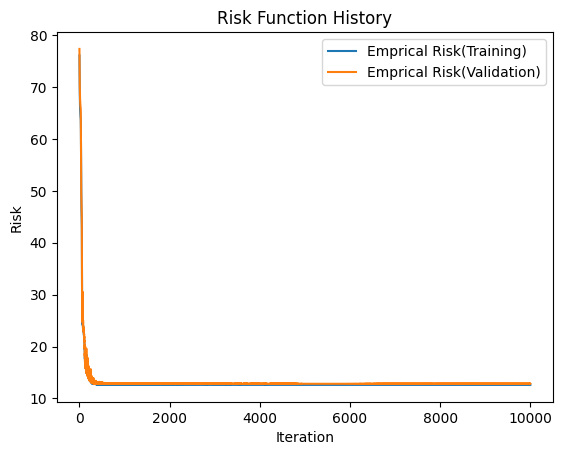

Test cost: 12.730825686708823


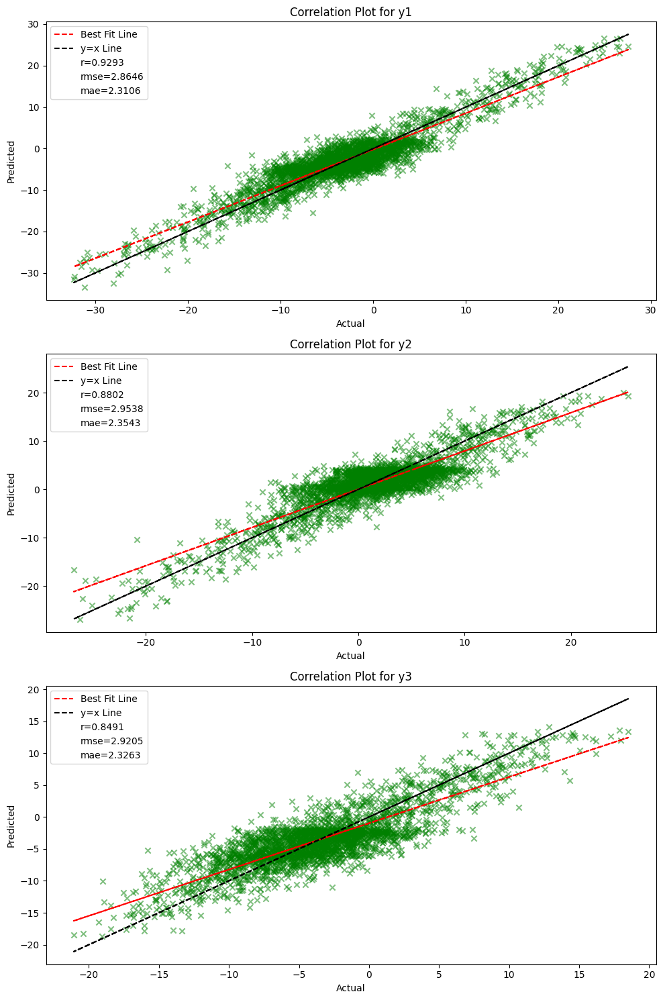

In [15]:
model_L2_reg = Model_Regression_lin(layer_dims, lambd)
lin_reg_trainer.train(model_L2_reg, X_train, y_train, X_val, y_val)
lin_reg_tester.plot_y(X_test, y_test, model_L2_reg)

### Testing L1-regularised performance


Train Cost after iteration 0: 76.0630577685396 | Val Cost after iteration 0: 77.32314522444139
Train Cost after iteration 500: 12.793099990991829 | Val Cost after iteration 500: 13.026977990086438
Train Cost after iteration 1000: 12.653978877156334 | Val Cost after iteration 1000: 12.920276637435592
Train Cost after iteration 1500: 12.668433080238998 | Val Cost after iteration 1500: 12.95816972812079
Train Cost after iteration 2000: 12.661080561151632 | Val Cost after iteration 2000: 12.957833475905765
Train Cost after iteration 2500: 12.647623640480907 | Val Cost after iteration 2500: 12.917437532376207
Train Cost after iteration 3000: 12.620762442001249 | Val Cost after iteration 3000: 12.860906990705455
Train Cost after iteration 3500: 12.64298575245618 | Val Cost after iteration 3500: 12.918023471189601
Train Cost after iteration 4000: 12.636836401427345 | Val Cost after iteration 4000: 12.913819731432932
Train Cost after iteration 4500: 12.624675683361945 | Val Cost after iteratio

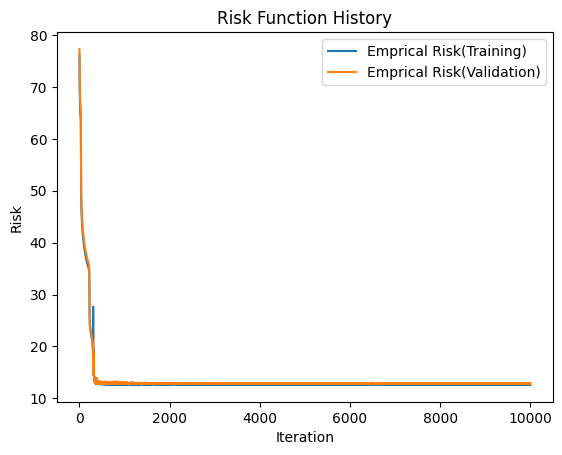

Test cost: 12.713084246132551


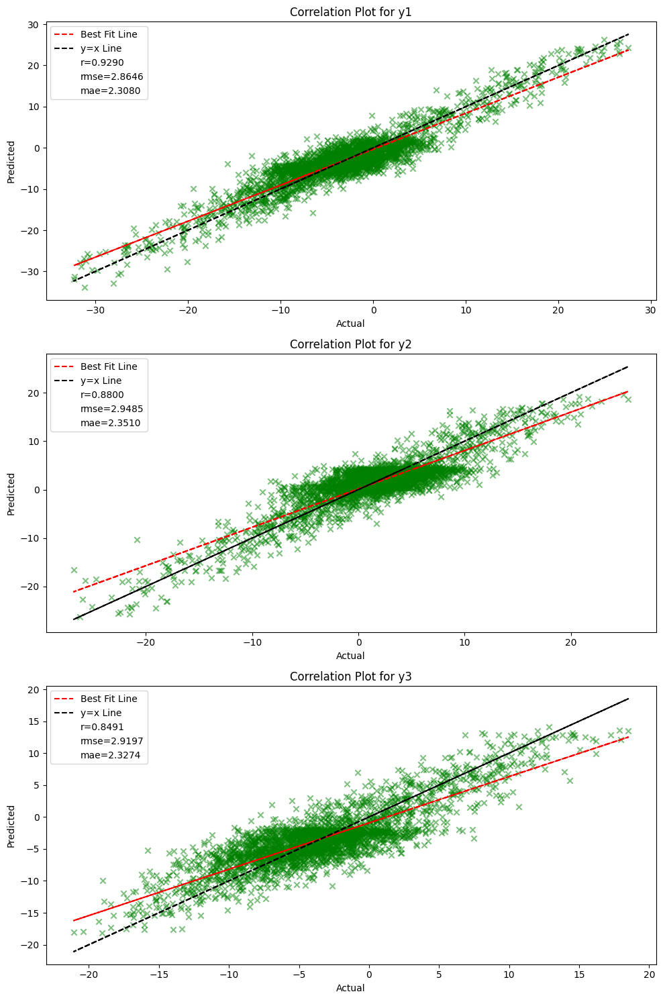

In [16]:
model_L1_reg = Model_Regression_lin(layer_dims, lambd, 1)
lin_reg_trainer.train(model_L1_reg, X_train, y_train, X_val, y_val)
lin_reg_tester.plot_y(X_test, y_test, model_L1_reg)

### Testing performance with dropout


Train Cost after iteration 0: 76.1272268903975 | Val Cost after iteration 0: 77.38188540876058
Train Cost after iteration 500: 65.22819915540542 | Val Cost after iteration 500: 66.26224822363251
Train Cost after iteration 1000: 65.48040223633787 | Val Cost after iteration 1000: 66.2680769479297
Train Cost after iteration 1500: 65.48395459810214 | Val Cost after iteration 1500: 66.26952243163578
Train Cost after iteration 2000: 65.48247352617528 | Val Cost after iteration 2000: 66.26904108109231
Train Cost after iteration 2500: 65.33438904730927 | Val Cost after iteration 2500: 66.26656913387151
Train Cost after iteration 3000: 65.56732324349376 | Val Cost after iteration 3000: 66.26980861941766
Train Cost after iteration 3500: 65.3550577390558 | Val Cost after iteration 3500: 66.27001799485481
Train Cost after iteration 4000: 65.34952667528847 | Val Cost after iteration 4000: 66.2633788129749
Train Cost after iteration 4500: 65.45039091483817 | Val Cost after iteration 4500: 66.2691916

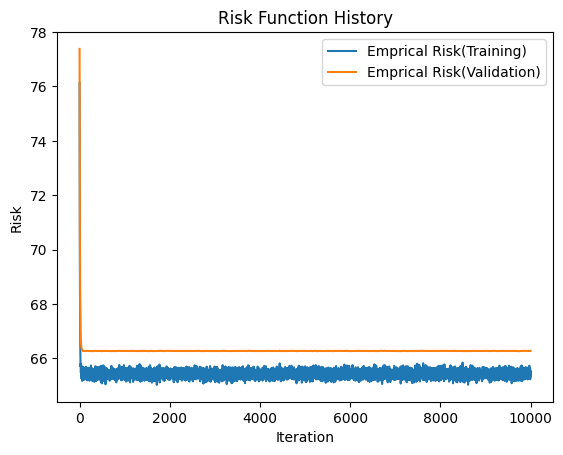

Test cost: 64.51835034902555


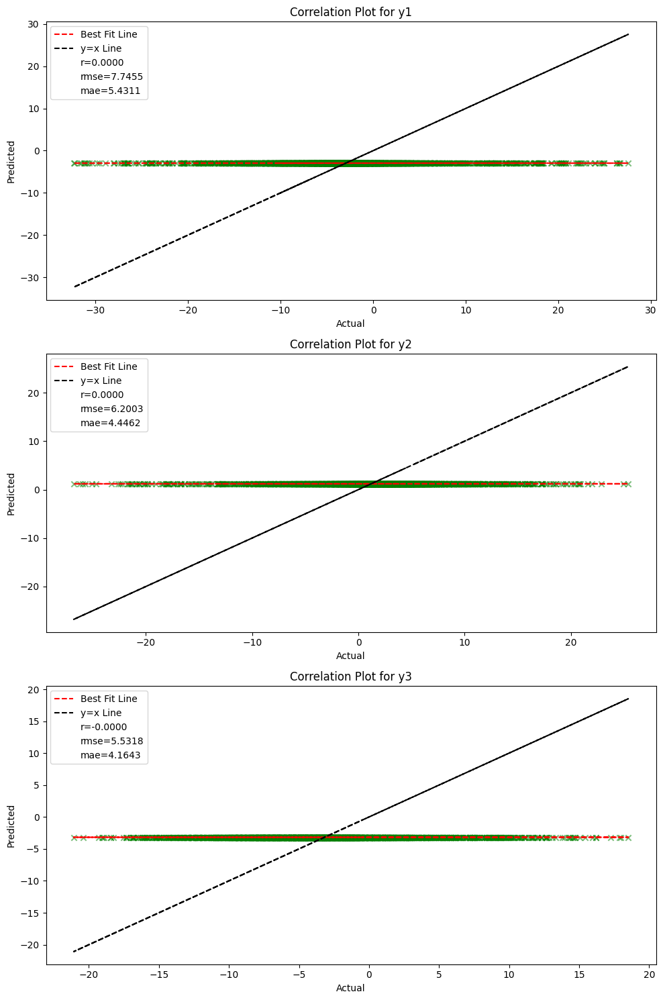

In [17]:
model_dropout = Model_Regression_lin(layer_dims, drop_prob=0.1)
lin_reg_trainer.train(model_dropout, X_train, y_train, X_val, y_val, True)
lin_reg_tester.plot_y(X_test, y_test, model_dropout)

## Q2 ii


### Preprocessing


In [18]:
# Load the dataset
data_path = './datasets/regression_data_multiGen_group_12_train.txt'

# Adjusting the data loading process to skip the header row
data = np.loadtxt(data_path, skiprows=1)
np.random.seed(42)  # For reproducibility
np.random.shuffle(data)   # Randomly shuffle the data

# Separate features and targets again
X = data[:, :2]  # Features (sensor readings)
y = data[:, 2:]  # Targets (y1, y2, y3 positions)

split_idx1 = int(X.shape[0] * 0.6)
split_idx2 = split_idx1 + int((X.shape[0] - split_idx1) * 0.5)

X_train = X[:split_idx1].T
X_val = X[split_idx1:split_idx2].T
X_test = X[split_idx2:].T
y_train = y[:split_idx1].T
y_val = y[split_idx1:split_idx2].T
y_test = y[split_idx2:].T

### $X,k$ -> $\phi(f(X,k))$; $f(X,k) = X^k + ... + X^1$, $\phi(X) = [X:1]$


In [19]:
def phi_X_k(X, k):

    # Generate all pairs for k
    X = X.T
    pairs = [(n1, n2) for n1 in range(k + 1)
             for n2 in range(k + 1) if n1 + n2 <= k]
    pairs.remove((0, 0))
    deg_index_map = []
    X_new = np.zeros((X.shape[0], len(pairs)))
    i = 0
    for n1, n2 in pairs:
        # # Skip the pair (0, 0) as it's just a constant term (1)
        # if n1 == 0 and n2 == 0:
        #     continue
        # Create new column for each polynomial term
        X_new[:, i] = X[:, 0]**n1 * X[:, 1]**n2
        p1 = f'X1^{n1} 'if n1 != 0 else ''
        p2 = f'X2^{n2}'if n2 != 0 else ''
        deg_index_map.append(p1+p2)
        i += 1

    return X_new.T, deg_index_map

In [20]:
class Trainer_reg_poly(Trainer_reg):
    def __init__(self, num_iterations, learning_rate, batch_size=1) -> None:
        super().__init__(num_iterations, learning_rate, batch_size)

    def train(self, model: Model_Regression_lin, X_train, y_train, X_val, y_val, k=1, drop=False):
        X_train, di_map = phi_X_k(X_train, k)
        X_val, _ = phi_X_k(X_val, k)
        print(di_map)
        super().train(model, X_train, y_train, X_val, y_val, drop)

In [21]:
class Evaluate_reg_poly(Evaluate_reg):
    def __init__(self) -> None:
        super().__init__()
    
    def plot_y(self, X, y, model, k=1):
        X, _ = phi_X_k(X, k)
        super().plot_y(X, y, model)

In [22]:
# Define the MLP architecture
layer_dims_lin = [2, 5, 5, 3]  # 3-layer model
layer_dims_quad = [5, 5, 5, 3]  # 3-layer model
layer_dims_cub = [9, 5, 5, 3]  # 3-layer model
layer_dims_biquad = [14, 5, 5, 3]  # 3-layer model

# Training hyperparameters
learning_rate = 0.0075
num_iterations = 10000

lambd = 0.1  # Regularization parameter
drop_prob = 0.2  # Dropout Probability

poly_reg_trainer = Trainer_reg_poly(num_iterations, learning_rate, 1000)
poly_reg_tester = Evaluate_reg_poly()

### Testing non-regularised performance


In [23]:
model_no_reg_lin = Model_Regression_lin(layer_dims_lin)
model_no_reg_quad = Model_Regression_lin(layer_dims_quad)
model_no_reg_cub = Model_Regression_lin(layer_dims_cub)
model_no_reg_biquad = Model_Regression_lin(layer_dims_biquad)

['X2^1', 'X1^1 ']
Train Cost after iteration 0: 76.07246948389742 | Val Cost after iteration 0: 77.33148756586685
Train Cost after iteration 500: 24.001881781585254 | Val Cost after iteration 500: 24.450749193944688
Train Cost after iteration 1000: 20.688808549916395 | Val Cost after iteration 1000: 20.995377956586317
Train Cost after iteration 1500: 20.564111331080813 | Val Cost after iteration 1500: 19.442892517730243
Train Cost after iteration 2000: 17.93429611030825 | Val Cost after iteration 2000: 17.79887341646906
Train Cost after iteration 2500: 17.371031423625233 | Val Cost after iteration 2500: 17.450518513905326
Train Cost after iteration 3000: 17.15661315614426 | Val Cost after iteration 3000: 17.35758647330772
Train Cost after iteration 3500: 16.96688873308694 | Val Cost after iteration 3500: 17.347524119702182
Train Cost after iteration 4000: 16.88453501757308 | Val Cost after iteration 4000: 17.113386062622894
Train Cost after iteration 4500: 16.743689204033302 | Val Cost

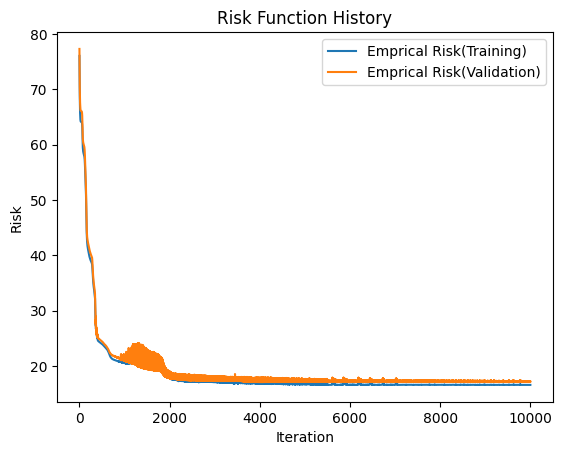

Test cost: 16.981886361630117


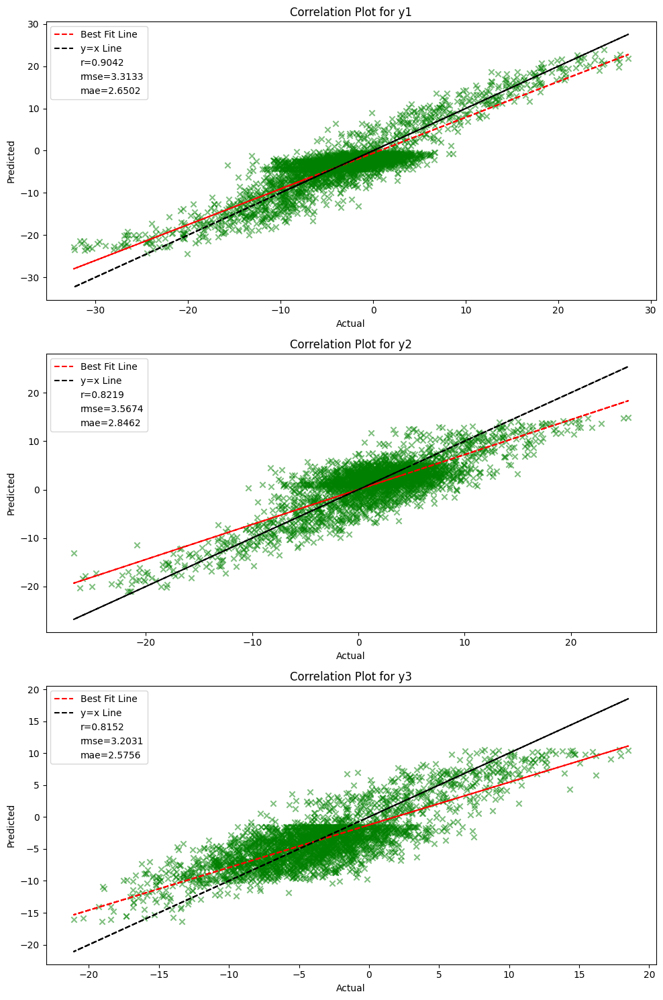

['X2^1', 'X2^2', 'X1^1 ', 'X1^1 X2^1', 'X1^2 ']
Train Cost after iteration 0: 76.05584855940992 | Val Cost after iteration 0: 77.31674330803317
Train Cost after iteration 500: 16.373040312831 | Val Cost after iteration 500: 16.972739611138067
Train Cost after iteration 1000: 14.964449105216477 | Val Cost after iteration 1000: 15.314212057321123
Train Cost after iteration 1500: 14.639688424640308 | Val Cost after iteration 1500: 15.089254866103994
Train Cost after iteration 2000: 14.54148402846204 | Val Cost after iteration 2000: 14.992744476358338
Train Cost after iteration 2500: 14.5296504515429 | Val Cost after iteration 2500: 14.840729002234257
Train Cost after iteration 3000: 14.535027892208312 | Val Cost after iteration 3000: 14.804712340754952
Train Cost after iteration 3500: 14.524610410404959 | Val Cost after iteration 3500: 14.773627788586431
Train Cost after iteration 4000: 14.511882350055979 | Val Cost after iteration 4000: 14.762741701422922
Train Cost after iteration 4500:

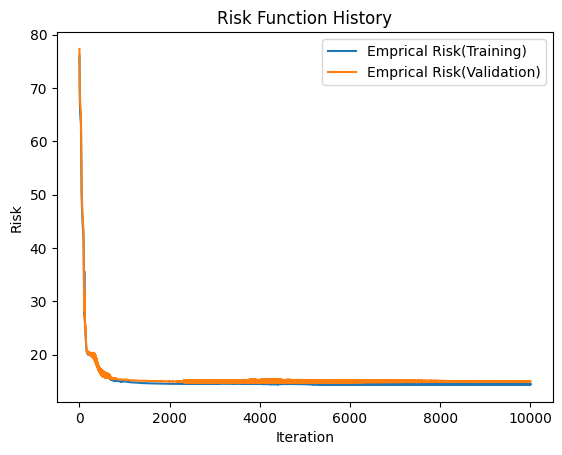

Test cost: 14.920714055464448


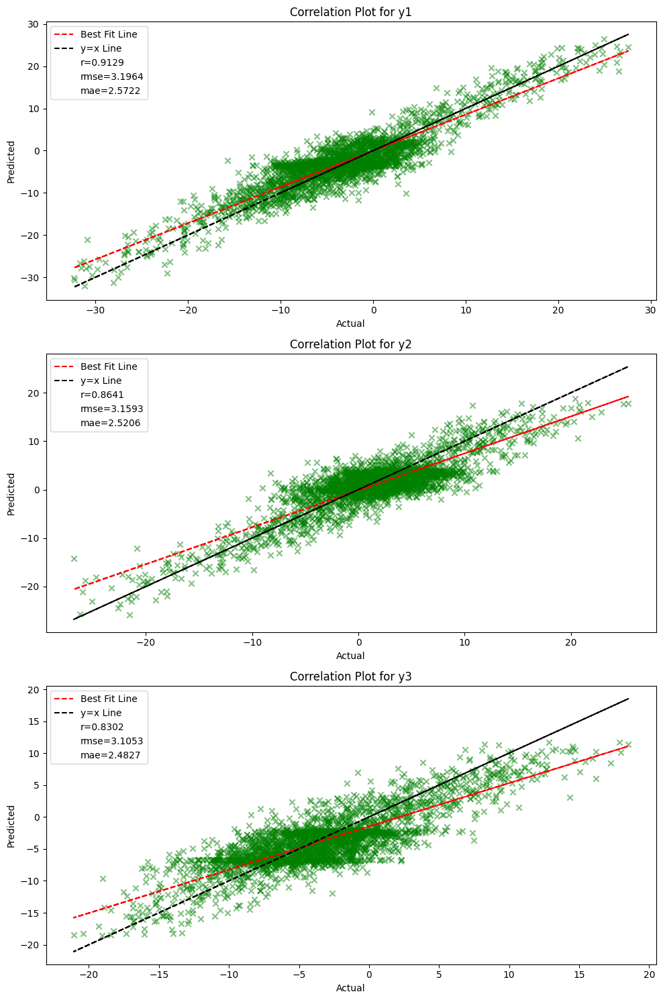

['X2^1', 'X2^2', 'X2^3', 'X1^1 ', 'X1^1 X2^1', 'X1^1 X2^2', 'X1^2 ', 'X1^2 X2^1', 'X1^3 ']
Train Cost after iteration 0: 76.05883634488364 | Val Cost after iteration 0: 77.31895223924398
Train Cost after iteration 500: 13.353560224937594 | Val Cost after iteration 500: 13.81472703074042
Train Cost after iteration 1000: 13.094194061161044 | Val Cost after iteration 1000: 13.520697474476025
Train Cost after iteration 1500: 13.072145666330426 | Val Cost after iteration 1500: 13.514505587207646
Train Cost after iteration 2000: 13.046071085010158 | Val Cost after iteration 2000: 13.481050765915425
Train Cost after iteration 2500: 13.007501073586003 | Val Cost after iteration 2500: 13.44222526423284
Train Cost after iteration 3000: 12.983887771688694 | Val Cost after iteration 3000: 13.398813804157035
Train Cost after iteration 3500: 12.986662919109024 | Val Cost after iteration 3500: 13.402749471411454
Train Cost after iteration 4000: 13.003980540049753 | Val Cost after iteration 4000: 13.4

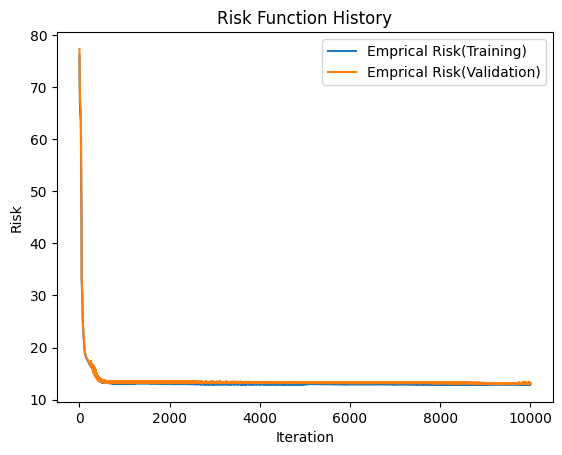

Test cost: 13.173163496054196


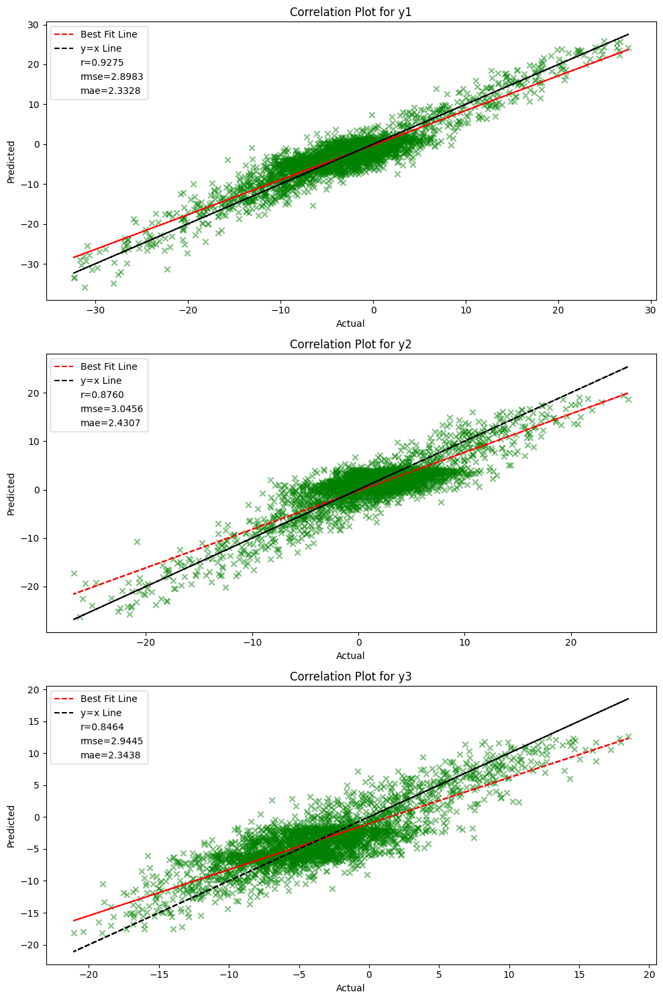

['X2^1', 'X2^2', 'X2^3', 'X2^4', 'X1^1 ', 'X1^1 X2^1', 'X1^1 X2^2', 'X1^1 X2^3', 'X1^2 ', 'X1^2 X2^1', 'X1^2 X2^2', 'X1^3 ', 'X1^3 X2^1', 'X1^4 ']
Train Cost after iteration 0: 76.04146216571272 | Val Cost after iteration 0: 77.30308673209655
Train Cost after iteration 500: 37.04487130742239 | Val Cost after iteration 500: 39.05670422200486
Train Cost after iteration 1000: 37.70955016942244 | Val Cost after iteration 1000: 39.923732751355324
Train Cost after iteration 1500: 37.72185442610452 | Val Cost after iteration 1500: 39.940607653639425
Train Cost after iteration 2000: 37.713022052894694 | Val Cost after iteration 2000: 39.93013447162375
Train Cost after iteration 2500: 37.719929516449604 | Val Cost after iteration 2500: 39.940378673270786
Train Cost after iteration 3000: 37.7210710501953 | Val Cost after iteration 3000: 39.94227894268259
Train Cost after iteration 3500: 37.71449392236327 | Val Cost after iteration 3500: 39.93093134663744
Train Cost after iteration 4000: 37.71538

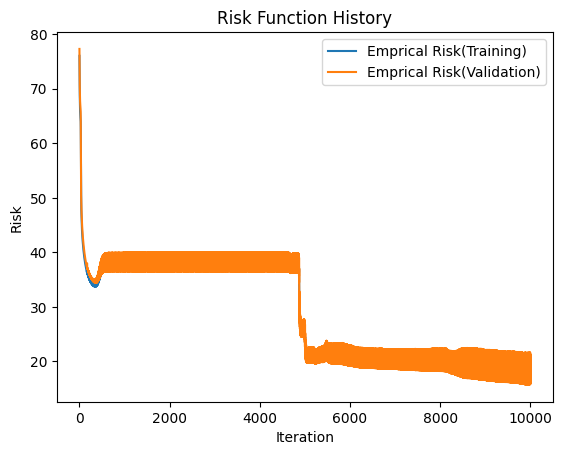

Test cost: 15.976003455961255


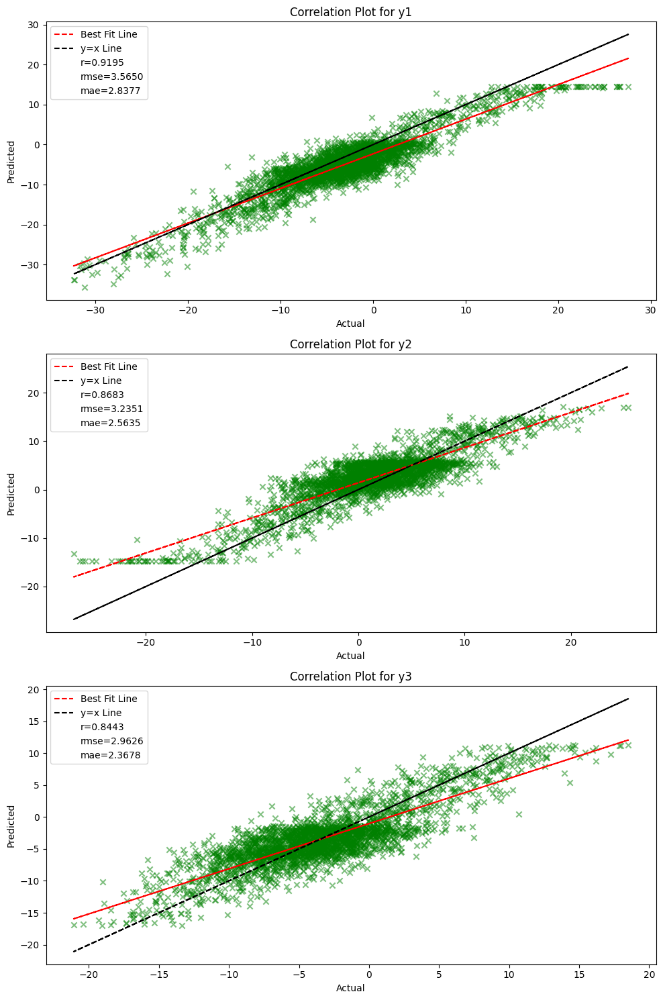

In [24]:
poly_reg_trainer.train(model_no_reg_lin, X_train,
                       y_train, X_val, y_val, 1, 1000)
poly_reg_tester.plot_y(X_test, y_test, model_no_reg_lin, 1)

poly_reg_trainer.train(model_no_reg_quad, X_train,
                       y_train, X_val, y_val, 2, 1000)
poly_reg_tester.plot_y(X_test, y_test, model_no_reg_quad, 2)

poly_reg_trainer.train(model_no_reg_cub, X_train,
                       y_train, X_val, y_val, 3, 1000)
poly_reg_tester.plot_y(X_test, y_test, model_no_reg_cub, 3)

poly_reg_trainer.train(model_no_reg_biquad, X_train,
                       y_train, X_val, y_val, 4, 1000)
poly_reg_tester.plot_y(X_test, y_test, model_no_reg_biquad, 4)

### Testing L2-regularised performance


In [25]:
model_L2_reg_lin = Model_Regression_lin(layer_dims_lin, lambd)
model_L2_reg_quad = Model_Regression_lin(layer_dims_quad, lambd)
model_L2_reg_cub = Model_Regression_lin(layer_dims_cub, lambd)
model_L2_reg_biquad = Model_Regression_lin(layer_dims_biquad, lambd)

['X2^1', 'X1^1 ']
Train Cost after iteration 0: 76.11023034964099 | Val Cost after iteration 0: 77.36687036166451
Train Cost after iteration 500: 26.80670987201773 | Val Cost after iteration 500: 26.92340221008403
Train Cost after iteration 1000: 25.097178528789485 | Val Cost after iteration 1000: 25.06371219736827
Train Cost after iteration 1500: 24.832564735740416 | Val Cost after iteration 1500: 24.807143405993862
Train Cost after iteration 2000: 24.751719604653687 | Val Cost after iteration 2000: 24.731044449941574
Train Cost after iteration 2500: 24.720554915024508 | Val Cost after iteration 2500: 24.69720438839806
Train Cost after iteration 3000: 24.70857355704525 | Val Cost after iteration 3000: 24.680751323127264
Train Cost after iteration 3500: 24.702466237878888 | Val Cost after iteration 3500: 24.671467832568815
Train Cost after iteration 4000: 24.697071182918513 | Val Cost after iteration 4000: 24.6650043209226
Train Cost after iteration 4500: 24.69283974301426 | Val Cost a

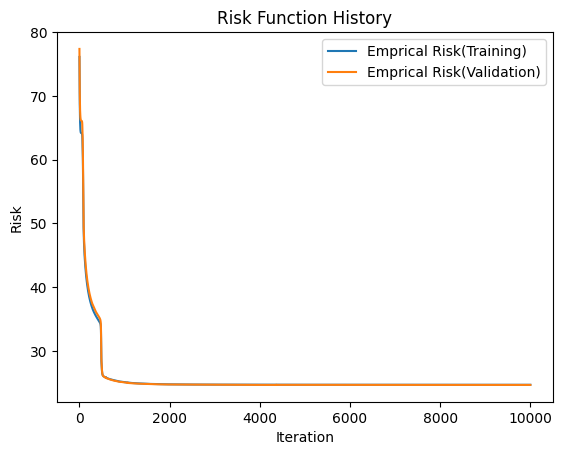

Test cost: 24.424938006477475


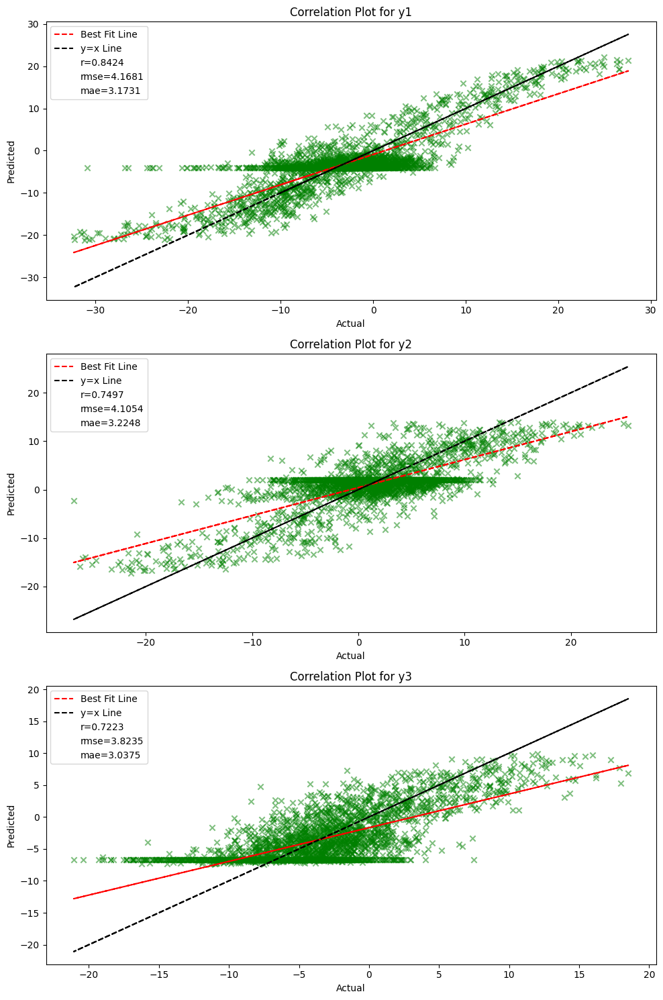

['X2^1', 'X2^2', 'X1^1 ', 'X1^1 X2^1', 'X1^2 ']
Train Cost after iteration 0: 76.07480726347987 | Val Cost after iteration 0: 77.33496972786988
Train Cost after iteration 500: 16.654160205060144 | Val Cost after iteration 500: 16.773711581137203
Train Cost after iteration 1000: 15.507084833288042 | Val Cost after iteration 1000: 15.463317669432955
Train Cost after iteration 1500: 15.253764294966437 | Val Cost after iteration 1500: 15.439608536025153
Train Cost after iteration 2000: 15.159268982155973 | Val Cost after iteration 2000: 15.38423969698018
Train Cost after iteration 2500: 15.05451928794522 | Val Cost after iteration 2500: 15.365310230661782
Train Cost after iteration 3000: 14.982467548315693 | Val Cost after iteration 3000: 15.280995680660531
Train Cost after iteration 3500: 14.921197864425524 | Val Cost after iteration 3500: 15.225121166029409
Train Cost after iteration 4000: 14.941262178946841 | Val Cost after iteration 4000: 15.252508026482756
Train Cost after iteration 4

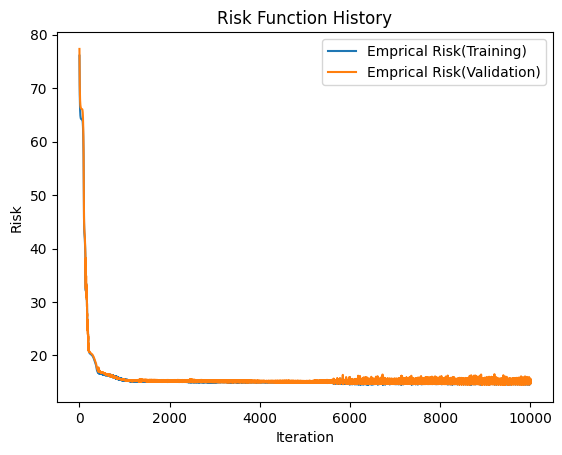

Test cost: 14.734791118524269


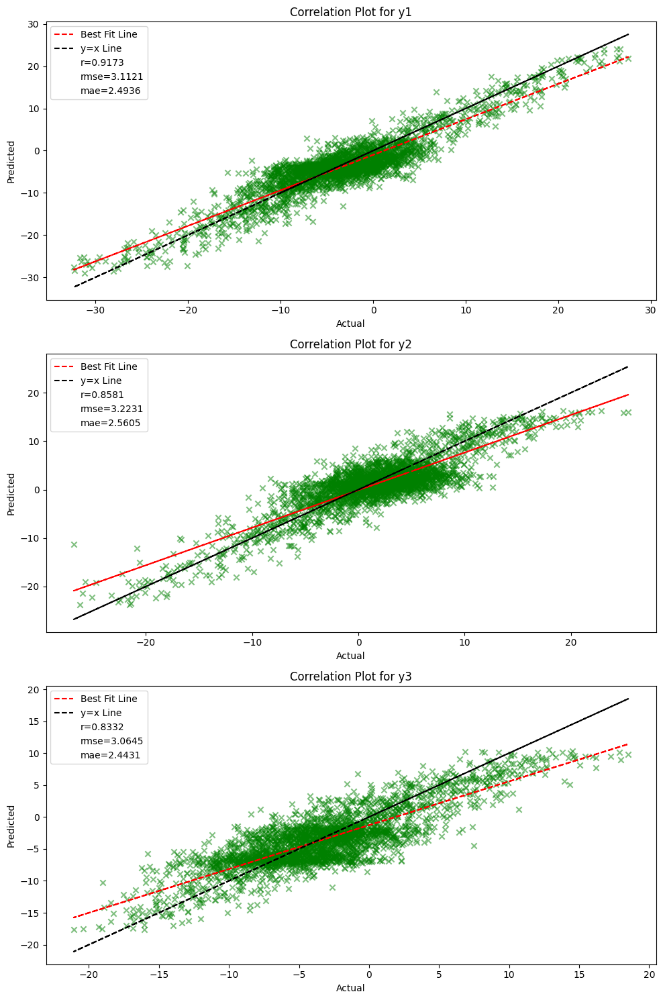

['X2^1', 'X2^2', 'X2^3', 'X1^1 ', 'X1^1 X2^1', 'X1^1 X2^2', 'X1^2 ', 'X1^2 X2^1', 'X1^3 ']
Train Cost after iteration 0: 76.0255159824332 | Val Cost after iteration 0: 77.28755926267685
Train Cost after iteration 500: 19.843852748109224 | Val Cost after iteration 500: 20.038142940092882
Train Cost after iteration 1000: 17.435690611975282 | Val Cost after iteration 1000: 16.18200577959799
Train Cost after iteration 1500: 17.21269103799482 | Val Cost after iteration 1500: 16.441827207474592
Train Cost after iteration 2000: 16.803635303432994 | Val Cost after iteration 2000: 15.978175559451778
Train Cost after iteration 2500: 16.722329301571353 | Val Cost after iteration 2500: 15.883991854887972
Train Cost after iteration 3000: 16.76876996392619 | Val Cost after iteration 3000: 16.215286592403213
Train Cost after iteration 3500: 16.75570379729723 | Val Cost after iteration 3500: 16.455722207185815
Train Cost after iteration 4000: 16.14027884441388 | Val Cost after iteration 4000: 15.63435

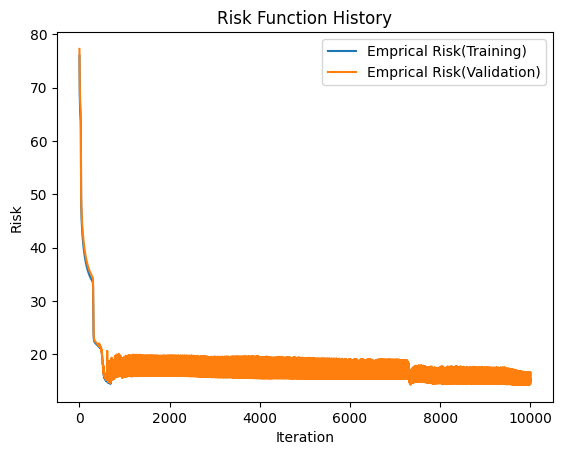

Test cost: 16.26381411995955


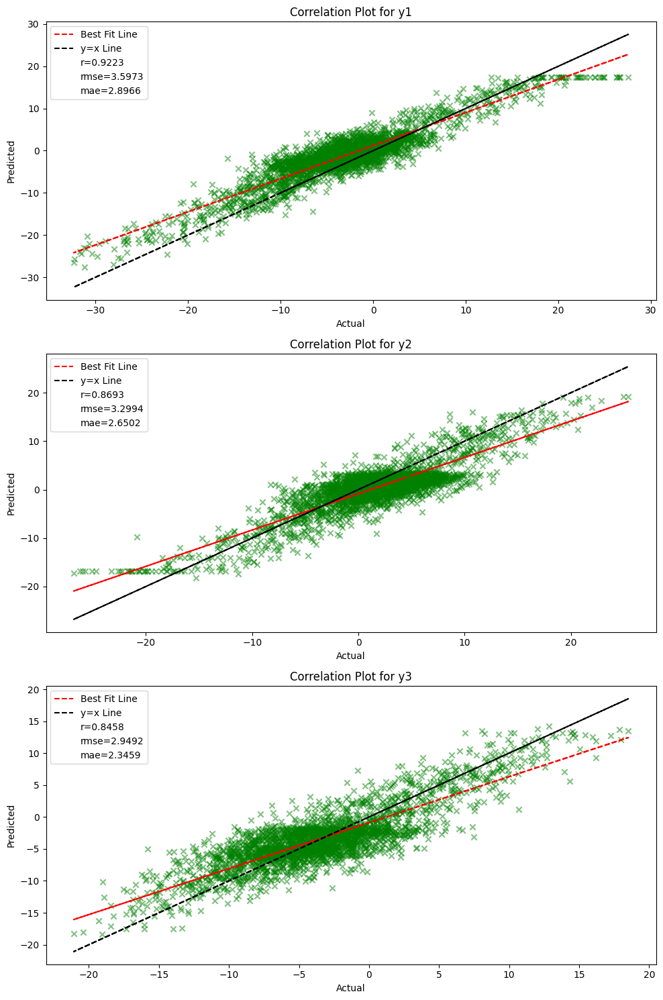

['X2^1', 'X2^2', 'X2^3', 'X2^4', 'X1^1 ', 'X1^1 X2^1', 'X1^1 X2^2', 'X1^1 X2^3', 'X1^2 ', 'X1^2 X2^1', 'X1^2 X2^2', 'X1^3 ', 'X1^3 X2^1', 'X1^4 ']
Train Cost after iteration 0: 76.06896513432075 | Val Cost after iteration 0: 77.32868748492146
Train Cost after iteration 500: 13.15265551031223 | Val Cost after iteration 500: 13.814444366142274
Train Cost after iteration 1000: 12.84324837120492 | Val Cost after iteration 1000: 12.917537573604847
Train Cost after iteration 1500: 12.77987837607016 | Val Cost after iteration 1500: 12.844123184213773
Train Cost after iteration 2000: 12.71626444950922 | Val Cost after iteration 2000: 12.827824649105871
Train Cost after iteration 2500: 12.700617687991464 | Val Cost after iteration 2500: 12.836486343779034
Train Cost after iteration 3000: 12.666442982699445 | Val Cost after iteration 3000: 12.80580217707057
Train Cost after iteration 3500: 12.680058818819704 | Val Cost after iteration 3500: 12.831000572633856
Train Cost after iteration 4000: 12.

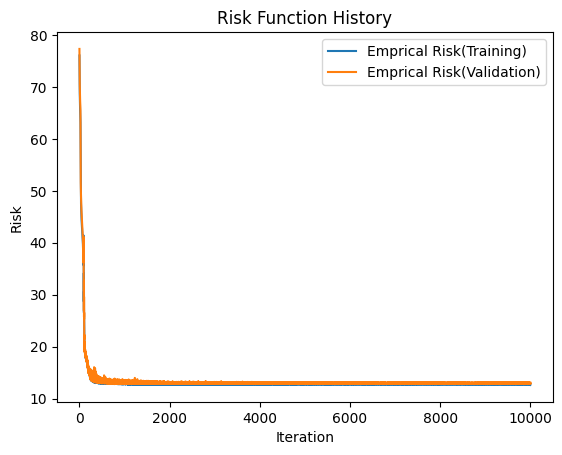

Test cost: 12.90899386432017


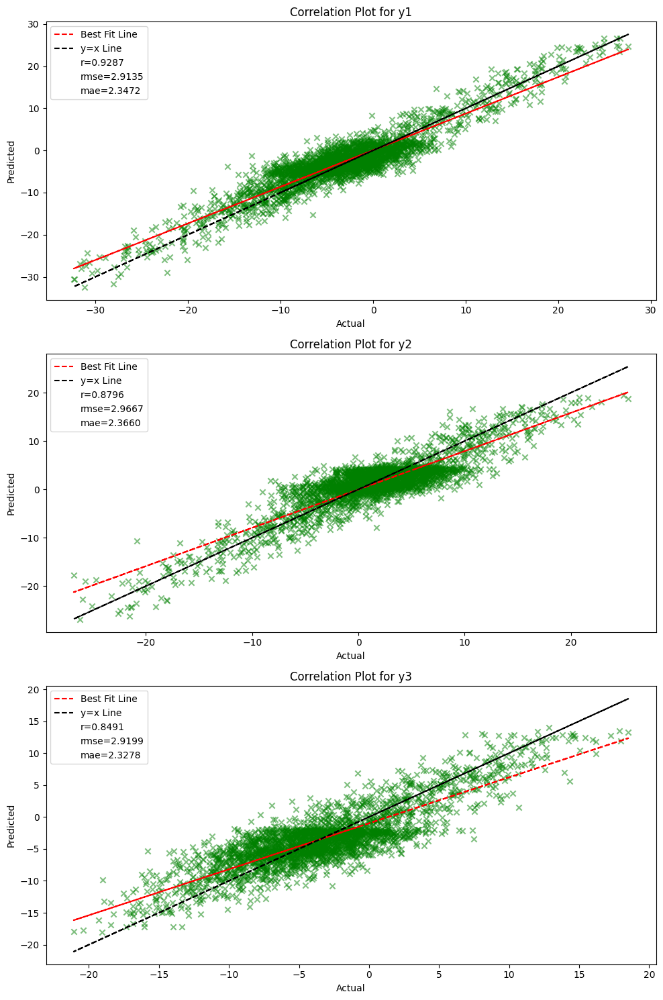

In [26]:
poly_reg_trainer.train(model_L2_reg_lin, X_train,
                       y_train, X_val, y_val, 1, 1000)
poly_reg_tester.plot_y(X_test, y_test, model_L2_reg_lin, 1)

poly_reg_trainer.train(model_L2_reg_quad, X_train,
                       y_train, X_val, y_val, 2, 1000)
poly_reg_tester.plot_y(X_test, y_test, model_L2_reg_quad, 2)

poly_reg_trainer.train(model_L2_reg_cub, X_train,
                       y_train, X_val, y_val, 3, 1000)
poly_reg_tester.plot_y(X_test, y_test, model_L2_reg_cub, 3)

poly_reg_trainer.train(model_L2_reg_biquad, X_train,
                       y_train, X_val, y_val, 4, 1000)
poly_reg_tester.plot_y(X_test, y_test, model_L2_reg_biquad, 4)

### Testing L1-regularised performance


In [27]:
model_L1_reg_lin = Model_Regression_lin(layer_dims_lin, lambd)
model_L1_reg_quad = Model_Regression_lin(layer_dims_quad, lambd)
model_L1_reg_cub = Model_Regression_lin(layer_dims_cub, lambd)
model_L1_reg_biquad = Model_Regression_lin(layer_dims_biquad, lambd)

['X2^1', 'X1^1 ']
Train Cost after iteration 0: 76.09871276974839 | Val Cost after iteration 0: 77.3566445079527
Train Cost after iteration 500: 24.479338195719926 | Val Cost after iteration 500: 24.435632255303492
Train Cost after iteration 1000: 16.8317592207954 | Val Cost after iteration 1000: 18.66270049040383
Train Cost after iteration 1500: 16.354570060558217 | Val Cost after iteration 1500: 17.05439237055177
Train Cost after iteration 2000: 16.21653383418392 | Val Cost after iteration 2000: 16.688347964099584
Train Cost after iteration 2500: 16.183733894979543 | Val Cost after iteration 2500: 16.579781175496954
Train Cost after iteration 3000: 16.141181387405084 | Val Cost after iteration 3000: 16.594592763065506
Train Cost after iteration 3500: 16.011968833141626 | Val Cost after iteration 3500: 16.477945958390382
Train Cost after iteration 4000: 16.02711526561807 | Val Cost after iteration 4000: 16.474998165876467
Train Cost after iteration 4500: 16.258362636547737 | Val Cost 

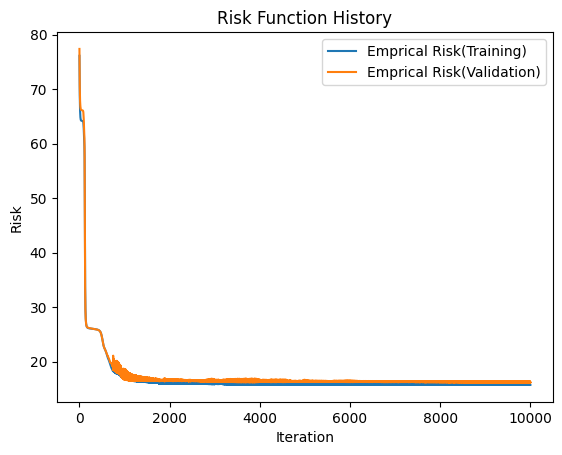

Test cost: 16.00227673407272


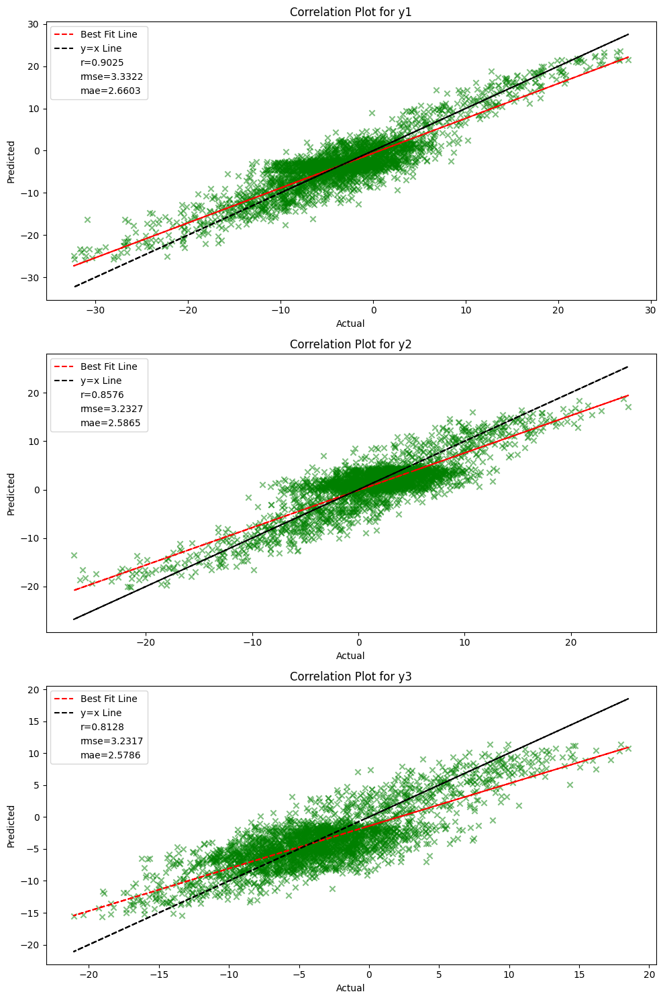

['X2^1', 'X2^2', 'X1^1 ', 'X1^1 X2^1', 'X1^2 ']
Train Cost after iteration 0: 76.1586514600635 | Val Cost after iteration 0: 77.4116760347014
Train Cost after iteration 500: 16.42837887467611 | Val Cost after iteration 500: 16.48196526808032
Train Cost after iteration 1000: 16.372597735975503 | Val Cost after iteration 1000: 15.894173061421451
Train Cost after iteration 1500: 16.241602493210994 | Val Cost after iteration 1500: 15.814920157484554
Train Cost after iteration 2000: 15.660428949157676 | Val Cost after iteration 2000: 15.609223722719042
Train Cost after iteration 2500: 14.274274036386716 | Val Cost after iteration 2500: 14.4601524577119
Train Cost after iteration 3000: 14.119044179104279 | Val Cost after iteration 3000: 14.319972167734457
Train Cost after iteration 3500: 14.07601886598039 | Val Cost after iteration 3500: 14.294285891410432
Train Cost after iteration 4000: 14.055005809168495 | Val Cost after iteration 4000: 14.274420883233946
Train Cost after iteration 4500: 

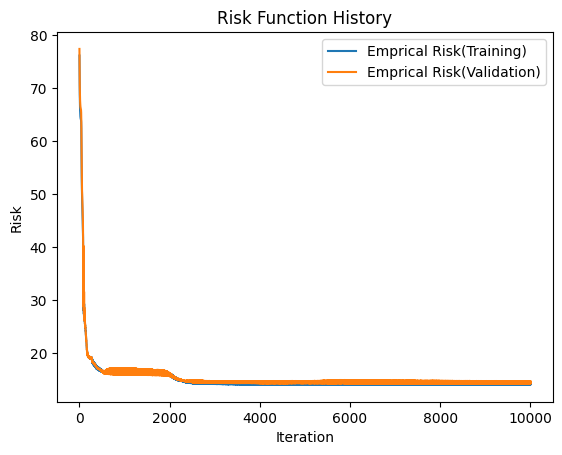

Test cost: 14.522787074799316


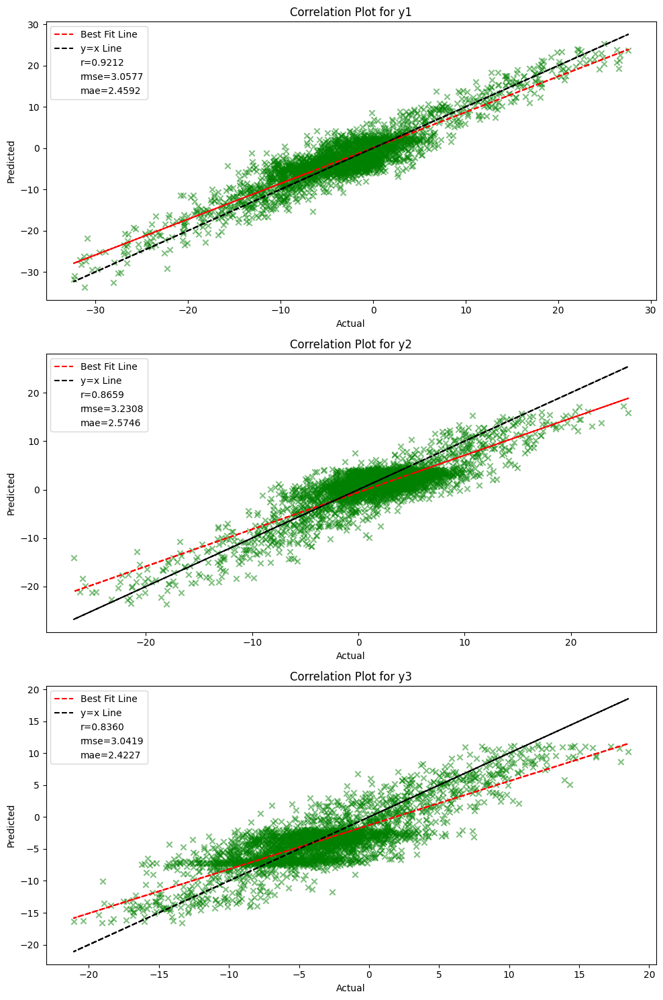

['X2^1', 'X2^2', 'X2^3', 'X1^1 ', 'X1^1 X2^1', 'X1^1 X2^2', 'X1^2 ', 'X1^2 X2^1', 'X1^3 ']
Train Cost after iteration 0: 76.0381383780068 | Val Cost after iteration 0: 77.29947476161712
Train Cost after iteration 500: 14.796523345322056 | Val Cost after iteration 500: 14.28625918661518
Train Cost after iteration 1000: 14.35889519609341 | Val Cost after iteration 1000: 13.7371157249382
Train Cost after iteration 1500: 13.716374653107513 | Val Cost after iteration 1500: 13.587758129647442
Train Cost after iteration 2000: 13.508806169809846 | Val Cost after iteration 2000: 14.478327615857788
Train Cost after iteration 2500: 13.650798581968289 | Val Cost after iteration 2500: 13.375840038051445
Train Cost after iteration 3000: 13.486468137161443 | Val Cost after iteration 3000: 13.336306056299923
Train Cost after iteration 3500: 13.28741545407431 | Val Cost after iteration 3500: 13.18997416149889
Train Cost after iteration 4000: 12.908456838029004 | Val Cost after iteration 4000: 13.070270

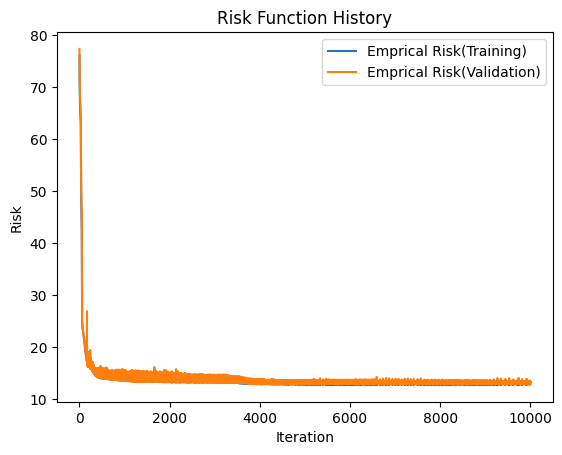

Test cost: 12.937461550967583


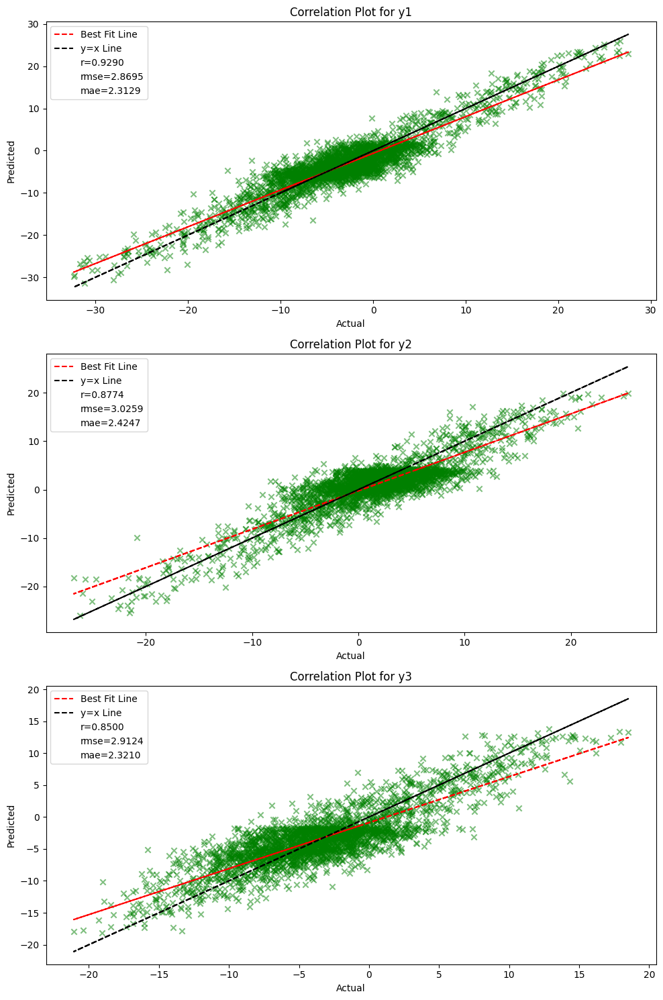

['X2^1', 'X2^2', 'X2^3', 'X2^4', 'X1^1 ', 'X1^1 X2^1', 'X1^1 X2^2', 'X1^1 X2^3', 'X1^2 ', 'X1^2 X2^1', 'X1^2 X2^2', 'X1^3 ', 'X1^3 X2^1', 'X1^4 ']
Train Cost after iteration 0: 76.06477316095625 | Val Cost after iteration 0: 77.32485105661904
Train Cost after iteration 500: 13.729441706337544 | Val Cost after iteration 500: 14.058515185962797
Train Cost after iteration 1000: 13.139357047319011 | Val Cost after iteration 1000: 13.512091926147574
Train Cost after iteration 1500: 13.05434291773535 | Val Cost after iteration 1500: 13.46421677066545
Train Cost after iteration 2000: 12.95940134367422 | Val Cost after iteration 2000: 13.08635665745236
Train Cost after iteration 2500: 13.077918753978084 | Val Cost after iteration 2500: 13.584343208322027
Train Cost after iteration 3000: 13.101692168292281 | Val Cost after iteration 3000: 13.148593407248617
Train Cost after iteration 3500: 12.936211884665779 | Val Cost after iteration 3500: 13.090589973803956
Train Cost after iteration 4000: 13

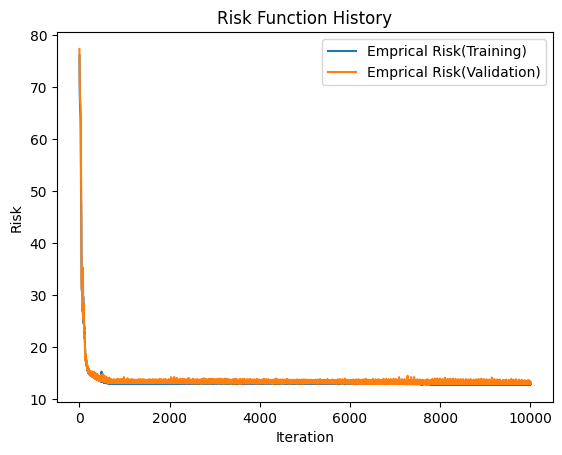

Test cost: 13.229006239903587


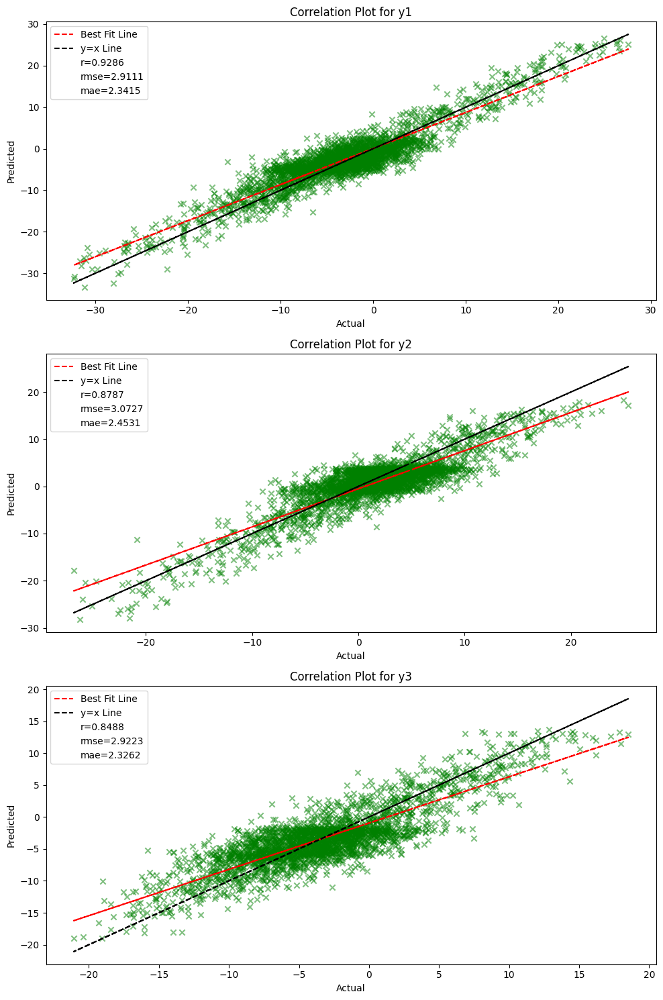

In [28]:
poly_reg_trainer.train(model_L1_reg_lin, X_train,
                       y_train, X_val, y_val, 1, 1000)
poly_reg_tester.plot_y(X_test, y_test, model_L1_reg_lin, 1)

poly_reg_trainer.train(model_L1_reg_quad, X_train,
                       y_train, X_val, y_val, 2, 1000)
poly_reg_tester.plot_y(X_test, y_test, model_L1_reg_quad, 2)

poly_reg_trainer.train(model_L1_reg_cub, X_train,
                       y_train, X_val, y_val, 3, 1000)
poly_reg_tester.plot_y(X_test, y_test, model_L1_reg_cub, 3)

poly_reg_trainer.train(model_L1_reg_biquad, X_train,
                       y_train, X_val, y_val, 4, 1000)
poly_reg_tester.plot_y(X_test, y_test, model_L1_reg_biquad, 4)

### Testing performance with dropout


In [29]:
model_dropout_lin = Model_Regression_lin(layer_dims_lin, drop_prob = drop_prob)
model_dropout_quad = Model_Regression_lin(layer_dims_quad, drop_prob = drop_prob)
model_dropout_cub = Model_Regression_lin(layer_dims_cub, drop_prob = drop_prob)
model_dropout_biquad = Model_Regression_lin(layer_dims_biquad, drop_prob = drop_prob)

['X2^1', 'X1^1 ']
Train Cost after iteration 0: 76.06122470073025 | Val Cost after iteration 0: 77.32288726749479
Train Cost after iteration 500: 66.55876550703798 | Val Cost after iteration 500: 66.6728675378718
Train Cost after iteration 1000: 66.52486222802577 | Val Cost after iteration 1000: 66.67551628789847
Train Cost after iteration 1500: 66.6213540698126 | Val Cost after iteration 1500: 66.66651925263697
Train Cost after iteration 2000: 66.60072084089659 | Val Cost after iteration 2000: 66.66997655399757
Train Cost after iteration 2500: 66.76844997684697 | Val Cost after iteration 2500: 66.67853519085264
Train Cost after iteration 3000: 66.72020510856944 | Val Cost after iteration 3000: 66.67064100607246
Train Cost after iteration 3500: 66.54540535534741 | Val Cost after iteration 3500: 66.66824945949368
Train Cost after iteration 4000: 66.88123700508139 | Val Cost after iteration 4000: 66.68929749463416
Train Cost after iteration 4500: 66.58217237792398 | Val Cost after iterat

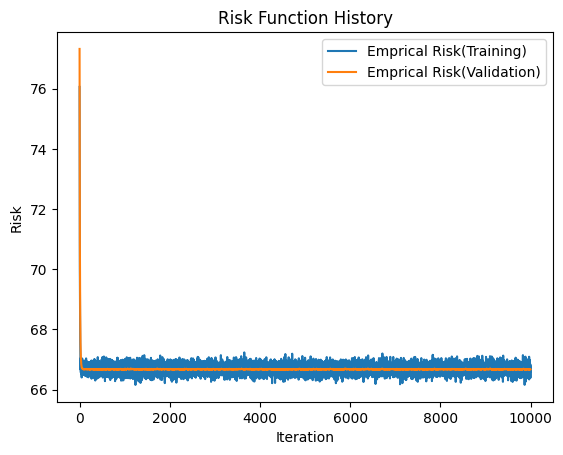

Test cost: 64.9022488687039


C:\Users\ASUS\AppData\Local\Temp\ipykernel_4440\646417503.py:20: RuntimeWarning: invalid value encountered in scalar divide
  return numerator / denominator


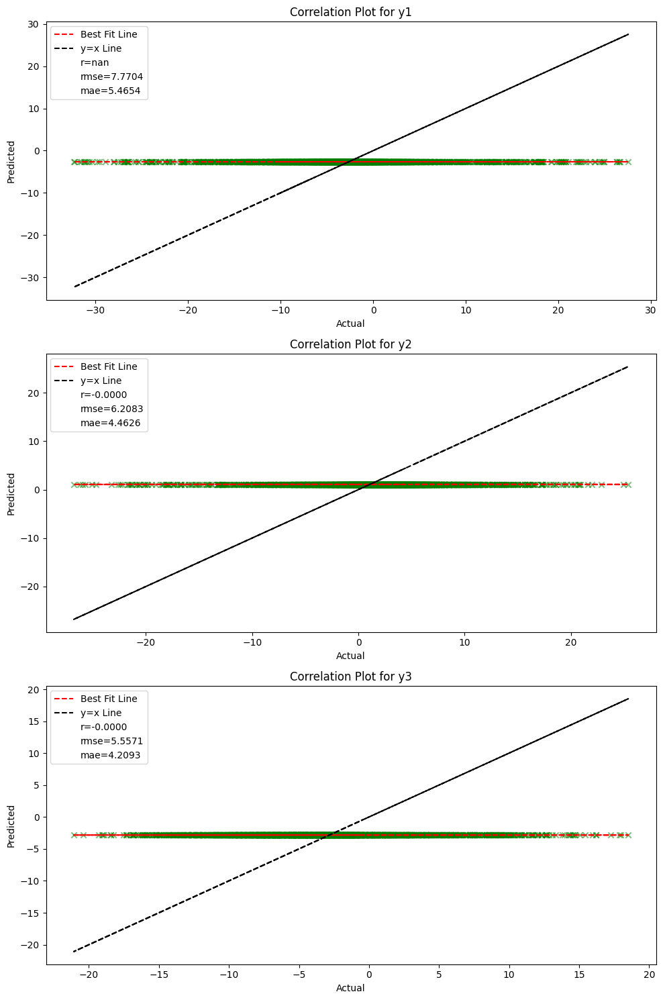

['X2^1', 'X2^2', 'X1^1 ', 'X1^1 X2^1', 'X1^2 ']
Train Cost after iteration 0: 76.08399988019839 | Val Cost after iteration 0: 77.34893379903077
Train Cost after iteration 500: 45.321332336128954 | Val Cost after iteration 500: 34.220942806195566
Train Cost after iteration 1000: 44.00984259465503 | Val Cost after iteration 1000: 31.52805629192592
Train Cost after iteration 1500: 44.14287783785153 | Val Cost after iteration 1500: 32.086471525263214
Train Cost after iteration 2000: 43.628627786770906 | Val Cost after iteration 2000: 31.806177535332623
Train Cost after iteration 2500: 44.06351189938181 | Val Cost after iteration 2500: 31.657033590334937
Train Cost after iteration 3000: 43.83357588053227 | Val Cost after iteration 3000: 31.584941602589062
Train Cost after iteration 3500: 44.068099489676385 | Val Cost after iteration 3500: 31.883563204372898
Train Cost after iteration 4000: 43.99516820281472 | Val Cost after iteration 4000: 31.950420724640036
Train Cost after iteration 4500:

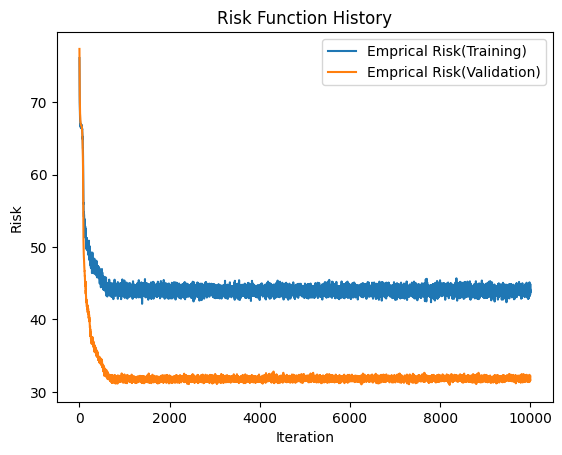

Test cost: 31.42769660730959


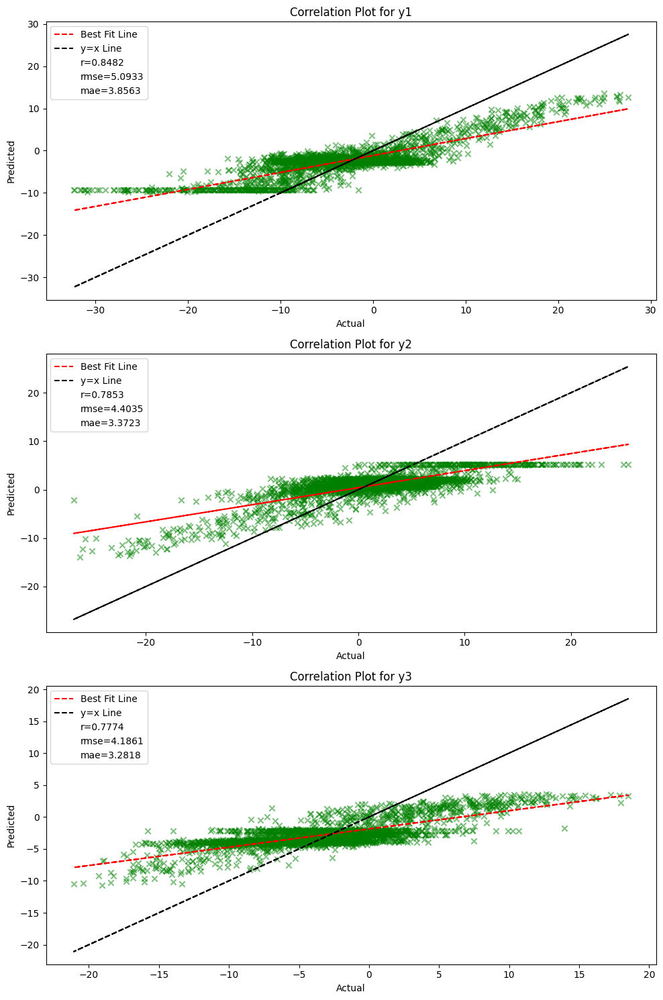

['X2^1', 'X2^2', 'X2^3', 'X1^1 ', 'X1^1 X2^1', 'X1^1 X2^2', 'X1^2 ', 'X1^2 X2^1', 'X1^3 ']
Train Cost after iteration 0: 76.10622701534906 | Val Cost after iteration 0: 77.37045725325738
Train Cost after iteration 500: 41.81911284010697 | Val Cost after iteration 500: 29.953186079637163
Train Cost after iteration 1000: 39.484545188923896 | Val Cost after iteration 1000: 27.628301402530315
Train Cost after iteration 1500: 40.72001811069748 | Val Cost after iteration 1500: 27.706824980575906
Train Cost after iteration 2000: 40.61192344414639 | Val Cost after iteration 2000: 27.971066491544775
Train Cost after iteration 2500: 39.713685791896424 | Val Cost after iteration 2500: 27.321605743402163
Train Cost after iteration 3000: 39.824759059455474 | Val Cost after iteration 3000: 26.671875876138568
Train Cost after iteration 3500: 39.29173915463036 | Val Cost after iteration 3500: 26.784477548391223
Train Cost after iteration 4000: 39.180009688414586 | Val Cost after iteration 4000: 26.813

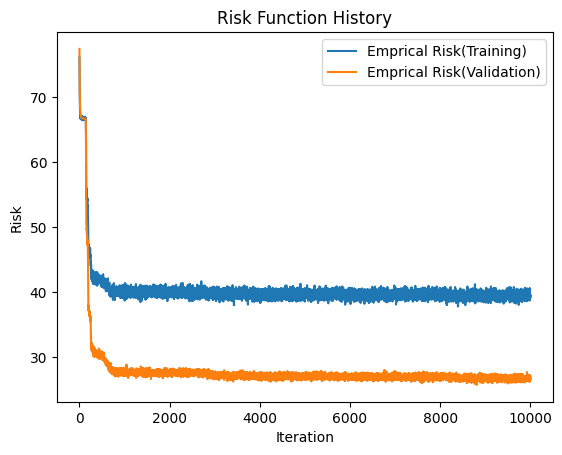

Test cost: 25.619560181481745


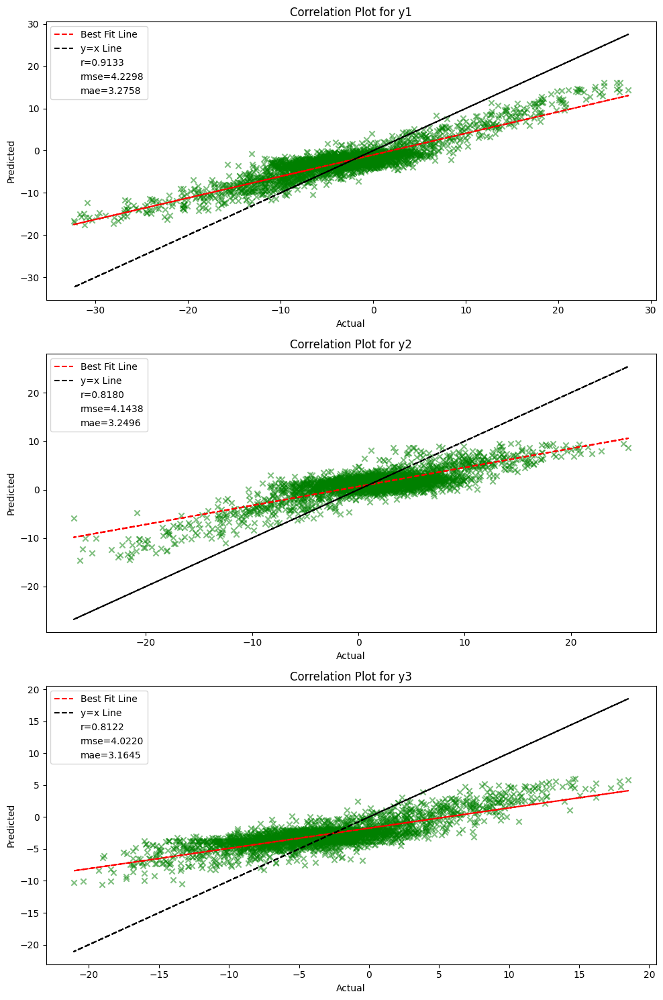

['X2^1', 'X2^2', 'X2^3', 'X2^4', 'X1^1 ', 'X1^1 X2^1', 'X1^1 X2^2', 'X1^1 X2^3', 'X1^2 ', 'X1^2 X2^1', 'X1^2 X2^2', 'X1^3 ', 'X1^3 X2^1', 'X1^4 ']
Train Cost after iteration 0: 76.13083958551312 | Val Cost after iteration 0: 77.39032593122363
Train Cost after iteration 500: 43.75720367061342 | Val Cost after iteration 500: 31.16453858443448
Train Cost after iteration 1000: 42.68882323737514 | Val Cost after iteration 1000: 29.608920315640322
Train Cost after iteration 1500: 41.67086725947345 | Val Cost after iteration 1500: 29.860987149780183
Train Cost after iteration 2000: 41.19033655508637 | Val Cost after iteration 2000: 30.041757396436427
Train Cost after iteration 2500: 40.99412300707342 | Val Cost after iteration 2500: 30.063328202838232
Train Cost after iteration 3000: 40.31223275721449 | Val Cost after iteration 3000: 29.812963684473207
Train Cost after iteration 3500: 40.33637275837911 | Val Cost after iteration 3500: 29.736916127746944
Train Cost after iteration 4000: 40.239

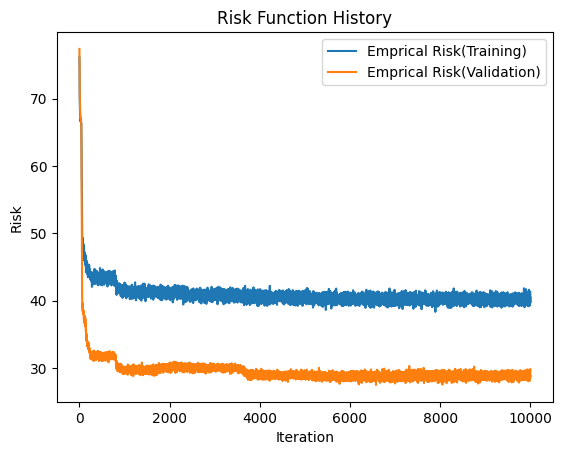

Test cost: 27.812626332284594


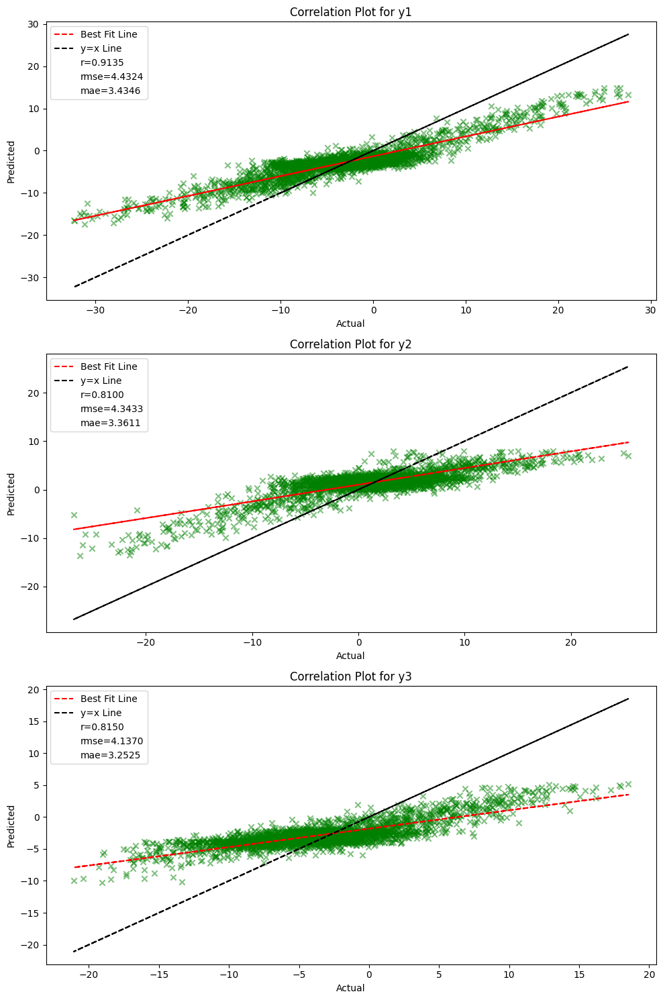

In [30]:
poly_reg_trainer.train(model_dropout_lin, X_train,
                       y_train, X_val, y_val, 1, 1000)
poly_reg_tester.plot_y(X_test, y_test, model_dropout_lin, 1)

poly_reg_trainer.train(model_dropout_quad, X_train,
                       y_train, X_val, y_val, 2, 1000)
poly_reg_tester.plot_y(X_test, y_test, model_dropout_quad, 2)

poly_reg_trainer.train(model_dropout_cub, X_train,
                       y_train, X_val, y_val, 3, 1000)
poly_reg_tester.plot_y(X_test, y_test, model_dropout_cub, 3)

poly_reg_trainer.train(model_dropout_biquad, X_train,
                       y_train, X_val, y_val, 4, 1000)
poly_reg_tester.plot_y(X_test, y_test, model_dropout_biquad, 4)

## Q2 iii

### Pre-processing


In [31]:
# Load the dataset
data_path = './datasets/regression_data_uni_group_12_train.txt'

# Adjusting the data loading process to skip the header row
data = np.loadtxt(data_path, skiprows=1)
np.random.seed(42)  # For reproducibility
np.random.shuffle(data)   # Randomly shuffle the data

# Separate features and targets again
X = data[:, :5]  # Features (sensor readings)
y = data[:, 5:]  # Targets (y position)

split_idx1 = int(X.shape[0] * 0.8)
split_idx2 = split_idx1 + int((X.shape[0] - split_idx1) * 0.5)

X_train = X[:split_idx1].T
X_val = X[split_idx1:split_idx2].T
X_test = X[split_idx2:].T
y_train = y[:split_idx1].T
y_val = y[split_idx1:split_idx2].T
y_test = y[split_idx2:].T

### $X$ -> $f(X)$; $f(X) = \sigma(x) | (1+\tanh(x))/2 | I(x)$
<!--  G(x) | L(x) | -->

In [4]:
def identity(X):
    return X

def sigmoid(X):
    return 1 / (1 + np.exp(-X))


def Dsigmoid(X):
    return sigmoid(X) * (1 - sigmoid(X))


# def gaussian(X, meu=0, sigma=1):
#     return 1 / (sigma * np.sqrt(2 * np.pi)) * np.exp(-0.5 * ((X-meu)/sigma)**2)


# def laplacian(X, meu=0, sigma=1):
#     return 1 / (2 * sigma) * np.exp(-(np.absolute(X-meu)/sigma))


def tanh_0_1(X):
    return (1 + np.tanh(X)) / 2.0


def Dtanh_0_1(X):
    return 0.5 * (1.0 - np.square(np.tanh(X)))

In [6]:
class Trainer_reg_non_poly(Trainer_reg):
    def __init__(self, num_iterations, learning_rate, batch_size=1) -> None:
        super().__init__(num_iterations, learning_rate, batch_size)

    def train(self, model: Model_Regression_lin, X_train, y_train, X_val, y_val, f=identity, drop=False):
        X_train = f(X_train)
        X_val = f(X_val)
        
        super().train(model, X_train, y_train, X_val, y_val, drop)

In [7]:
class Evaluate_reg_non_poly(Evaluate_reg):
    def __init__(self) -> None:
        super().__init__()
    
    def plot_y(self, X, y, model, f=identity):
        X = f(X)
        super().plot_y(X, y, model)

In [35]:
# Define the MLP architecture
layer_dims = [5, 3, 1]  # 3-layer model

# Training hyperparameters
learning_rate = 0.0075
num_iterations = 10000

lambd = 0.1  # Regularization parameter
drop_prob = 0.1  # Dropout Probability

non_poly_reg_trainer = Trainer_reg_non_poly(num_iterations, learning_rate, 1000)
non_poly_reg_tester = Evaluate_reg_non_poly()

### Testing non-regularised performance


Train Cost after iteration 0: 0.14050591427798334 | Val Cost after iteration 0: 0.14605711044574682
Train Cost after iteration 500: 0.07018222637798885 | Val Cost after iteration 500: 0.07280515790994117
Train Cost after iteration 1000: 0.030080108083626458 | Val Cost after iteration 1000: 0.030122482892009788
Train Cost after iteration 1500: 0.025234337065795084 | Val Cost after iteration 1500: 0.024798315302842273
Train Cost after iteration 2000: 0.024016616056762474 | Val Cost after iteration 2000: 0.023559117094262103
Train Cost after iteration 2500: 0.023744655381293635 | Val Cost after iteration 2500: 0.023307978705764155
Train Cost after iteration 3000: 0.023659791441083756 | Val Cost after iteration 3000: 0.02323271801282356
Train Cost after iteration 3500: 0.023623301041462385 | Val Cost after iteration 3500: 0.0232267015308826
Train Cost after iteration 4000: 0.023612969016778968 | Val Cost after iteration 4000: 0.023241931792831058
Train Cost after iteration 4500: 0.02360879

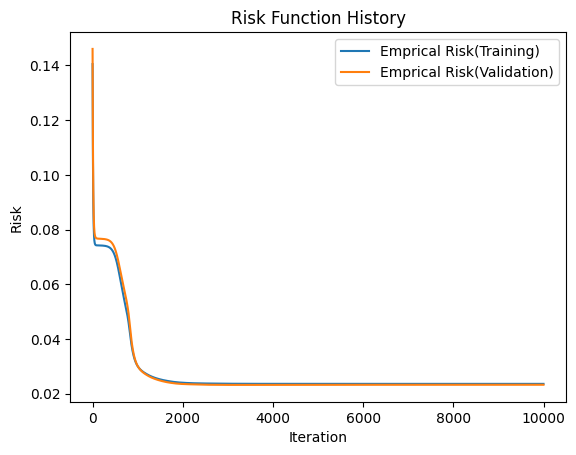

Test cost: 0.02127326288884982


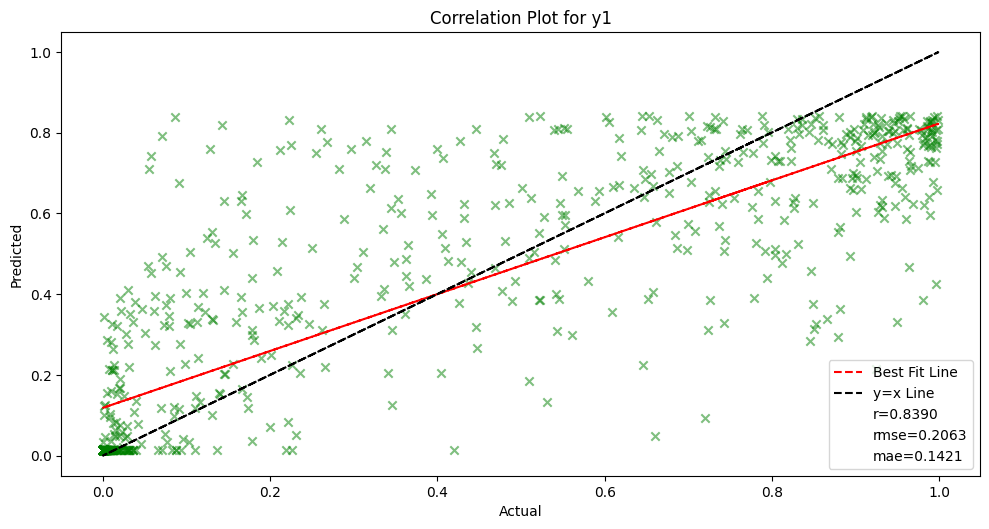

Train Cost after iteration 0: 0.14555822852656816 | Val Cost after iteration 0: 0.15108071328270412
Train Cost after iteration 500: 0.0741685716998649 | Val Cost after iteration 500: 0.07660408294391621
Train Cost after iteration 1000: 0.07343242410504904 | Val Cost after iteration 1000: 0.07584194313556678
Train Cost after iteration 1500: 0.06673776181186253 | Val Cost after iteration 1500: 0.0689703118342207
Train Cost after iteration 2000: 0.04302015142497382 | Val Cost after iteration 2000: 0.04438828791168352
Train Cost after iteration 2500: 0.02981341514574994 | Val Cost after iteration 2500: 0.02998342476919471
Train Cost after iteration 3000: 0.027003667542566896 | Val Cost after iteration 3000: 0.026612879600000854
Train Cost after iteration 3500: 0.026126281180548785 | Val Cost after iteration 3500: 0.025595758893147864
Train Cost after iteration 4000: 0.025650909147400775 | Val Cost after iteration 4000: 0.02509599272407762
Train Cost after iteration 4500: 0.0252908486977213

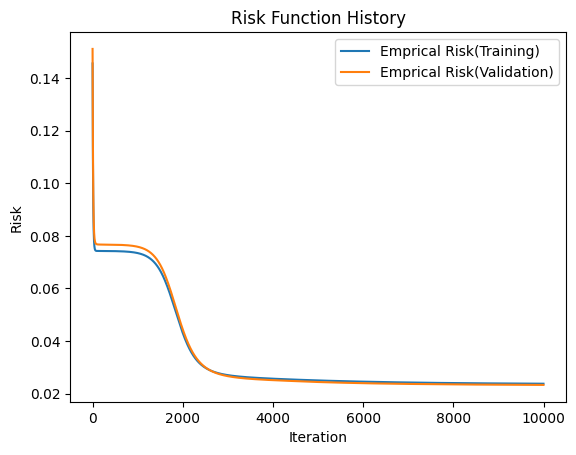

Test cost: 0.021081720902448007


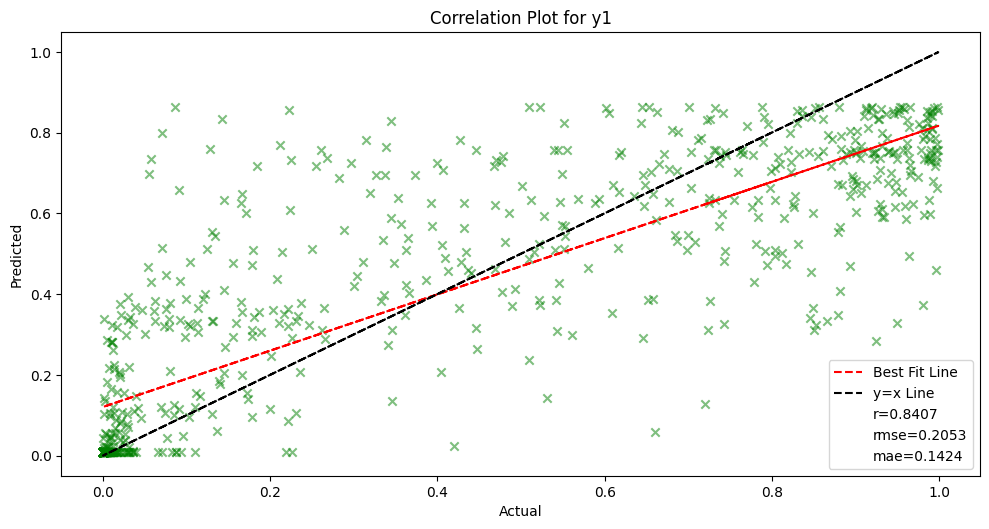

Train Cost after iteration 0: 0.14617963846675205 | Val Cost after iteration 0: 0.151705409219219
Train Cost after iteration 500: 0.05742537100805208 | Val Cost after iteration 500: 0.05950489321400241
Train Cost after iteration 1000: 0.02756574806176342 | Val Cost after iteration 1000: 0.02719774363765487
Train Cost after iteration 1500: 0.02564536088372085 | Val Cost after iteration 1500: 0.025147679917082354
Train Cost after iteration 2000: 0.024667439754470586 | Val Cost after iteration 2000: 0.02424227243575879
Train Cost after iteration 2500: 0.024172853322696874 | Val Cost after iteration 2500: 0.023866345716010855
Train Cost after iteration 3000: 0.023949808934419562 | Val Cost after iteration 3000: 0.023750749746486294
Train Cost after iteration 3500: 0.023854977216322414 | Val Cost after iteration 3500: 0.023734516016499063
Train Cost after iteration 4000: 0.023818482300358133 | Val Cost after iteration 4000: 0.02375461641562087
Train Cost after iteration 4500: 0.023803284959

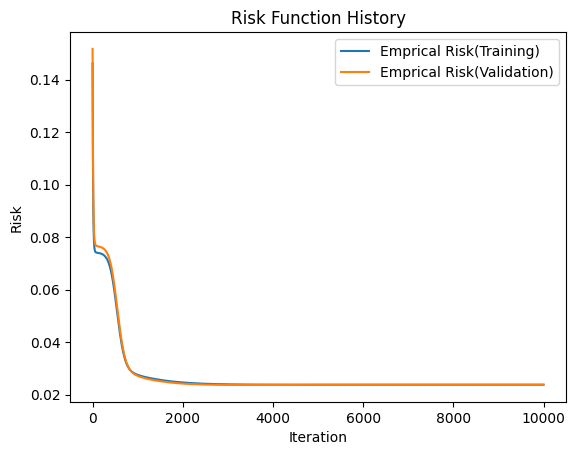

Test cost: 0.02151236327010423


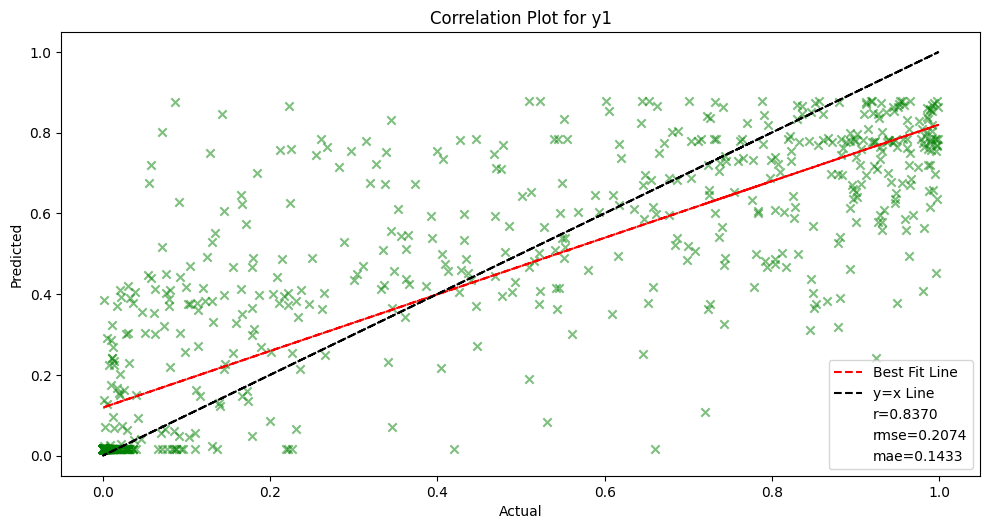

In [36]:
model_no_reg = Model_Regression_lin(layer_dims)
non_poly_reg_trainer.train(model_no_reg, X_train,
                       y_train, X_val, y_val, identity, 1000)
non_poly_reg_tester.plot_y(X_test, y_test, model_no_reg, identity)

model_no_reg = Model_Regression_lin(layer_dims)
non_poly_reg_trainer.train(model_no_reg, X_train,
                           y_train, X_val, y_val, sigmoid, 1000)
non_poly_reg_tester.plot_y(X_test, y_test, model_no_reg, sigmoid)

model_no_reg = Model_Regression_lin(layer_dims)
non_poly_reg_trainer.train(model_no_reg, X_train,
                           y_train, X_val, y_val, np.tanh, 1000)
non_poly_reg_tester.plot_y(X_test, y_test, model_no_reg, np.tanh)

### Testing L2-regularised performance


Train Cost after iteration 0: 0.14082120612336801 | Val Cost after iteration 0: 0.1463725681835258
Train Cost after iteration 500: 0.0727916324370421 | Val Cost after iteration 500: 0.0751894081611408
Train Cost after iteration 1000: 0.028657595684268344 | Val Cost after iteration 1000: 0.028060107537014916
Train Cost after iteration 1500: 0.027968484838557347 | Val Cost after iteration 1500: 0.027289550126721573
Train Cost after iteration 2000: 0.027928295166536027 | Val Cost after iteration 2000: 0.02723699738009325
Train Cost after iteration 2500: 0.027884613355605155 | Val Cost after iteration 2500: 0.027185336429308714
Train Cost after iteration 3000: 0.027831510809077125 | Val Cost after iteration 3000: 0.02712471306913508
Train Cost after iteration 3500: 0.027760402101371724 | Val Cost after iteration 3500: 0.02704741718149569
Train Cost after iteration 4000: 0.027657187602956945 | Val Cost after iteration 4000: 0.02694003076056433
Train Cost after iteration 4500: 0.027499895774

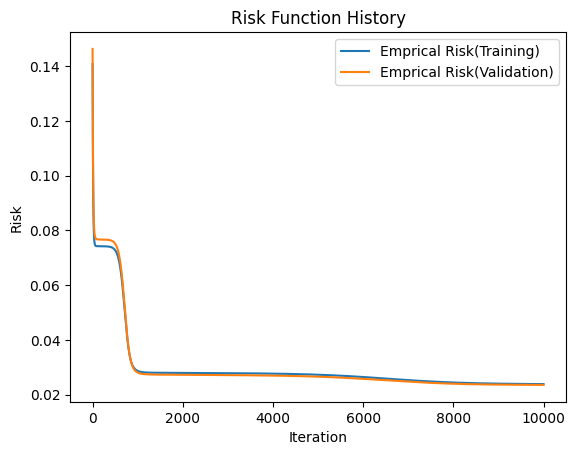

Test cost: 0.021169146002001902


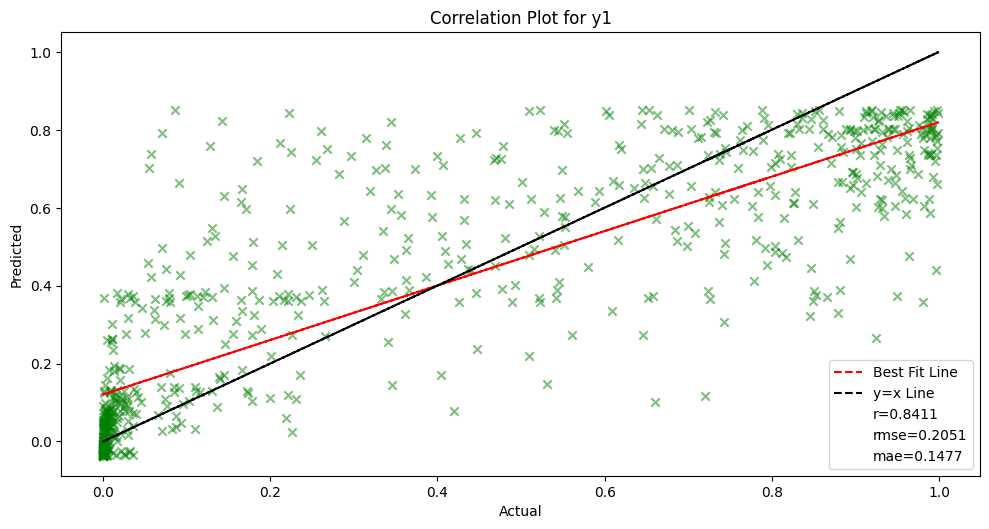

Train Cost after iteration 0: 0.14293191969907204 | Val Cost after iteration 0: 0.1484733865292619
Train Cost after iteration 500: 0.07420370925788791 | Val Cost after iteration 500: 0.0766403108227864
Train Cost after iteration 1000: 0.07381550371218831 | Val Cost after iteration 1000: 0.07623489819740942
Train Cost after iteration 1500: 0.06997810557492996 | Val Cost after iteration 1500: 0.07228607672834048
Train Cost after iteration 2000: 0.050201531053771516 | Val Cost after iteration 2000: 0.0518998146013476
Train Cost after iteration 2500: 0.03201263748216188 | Val Cost after iteration 2500: 0.032532786863145015
Train Cost after iteration 3000: 0.027773488746430052 | Val Cost after iteration 3000: 0.027561121854675685
Train Cost after iteration 3500: 0.026645911304579124 | Val Cost after iteration 3500: 0.026224504112225332
Train Cost after iteration 4000: 0.026112549879224126 | Val Cost after iteration 4000: 0.0256482642633061
Train Cost after iteration 4500: 0.0257405623211033

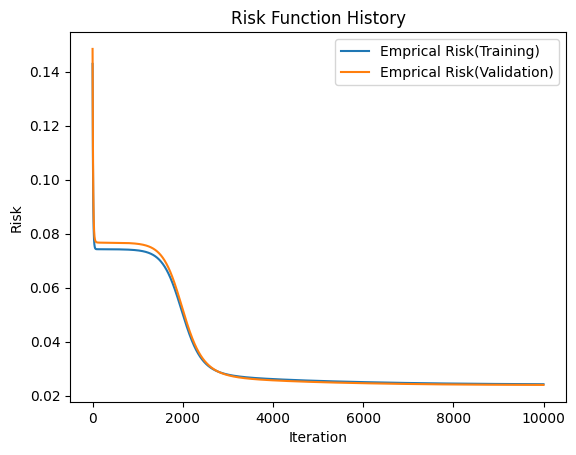

Test cost: 0.021623381781119794


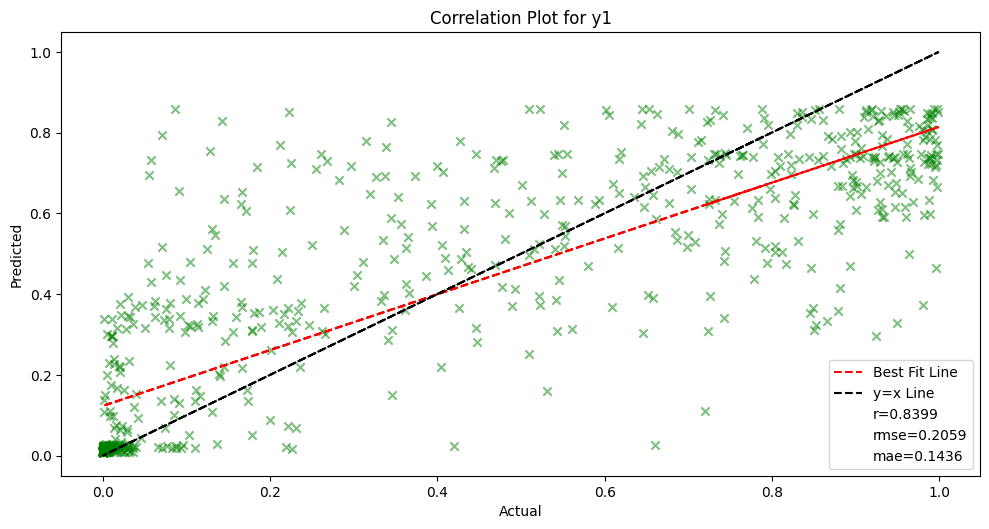

Train Cost after iteration 0: 0.14449946042682796 | Val Cost after iteration 0: 0.15003326298736278
Train Cost after iteration 500: 0.05641598103382204 | Val Cost after iteration 500: 0.058316341943584246
Train Cost after iteration 1000: 0.026433498120872503 | Val Cost after iteration 1000: 0.025960274669598143
Train Cost after iteration 1500: 0.02531215676570735 | Val Cost after iteration 1500: 0.024787313189676186
Train Cost after iteration 2000: 0.024795846395938712 | Val Cost after iteration 2000: 0.02429664716357088
Train Cost after iteration 2500: 0.024503449884942574 | Val Cost after iteration 2500: 0.024027123021352622
Train Cost after iteration 3000: 0.02430902319128064 | Val Cost after iteration 3000: 0.0238777358460312
Train Cost after iteration 3500: 0.02417610018824921 | Val Cost after iteration 3500: 0.023794442502719858
Train Cost after iteration 4000: 0.024081526743065015 | Val Cost after iteration 4000: 0.02375066284757552
Train Cost after iteration 4500: 0.02401449158

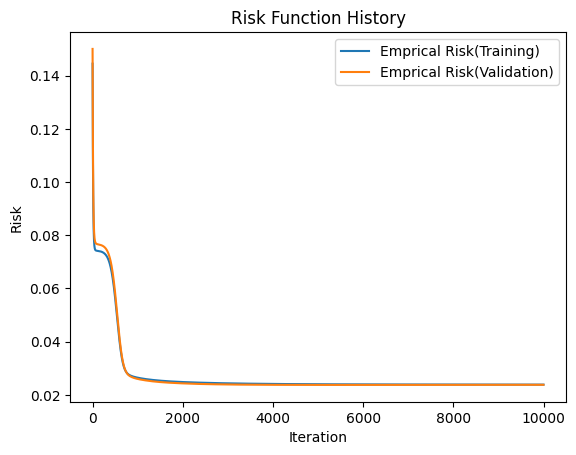

Test cost: 0.021643019641801216


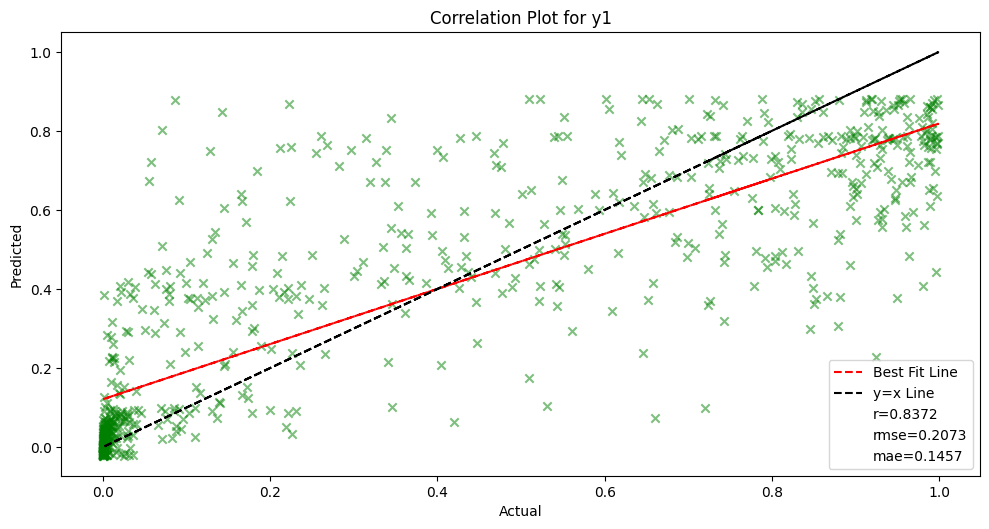

In [37]:
model_L2_reg = Model_Regression_lin(layer_dims, lambd)
non_poly_reg_trainer.train(model_L2_reg, X_train,
                           y_train, X_val, y_val, identity, 1000)
non_poly_reg_tester.plot_y(X_test, y_test, model_L2_reg, identity)

model_L2_reg = Model_Regression_lin(layer_dims, lambd)
non_poly_reg_trainer.train(model_L2_reg, X_train,
                           y_train, X_val, y_val, sigmoid, 1000)
non_poly_reg_tester.plot_y(X_test, y_test, model_L2_reg, sigmoid)

model_L2_reg = Model_Regression_lin(layer_dims, lambd)
non_poly_reg_trainer.train(model_L2_reg, X_train,
                           y_train, X_val, y_val, np.tanh, 1000)
non_poly_reg_tester.plot_y(X_test, y_test, model_L2_reg, np.tanh)

### Testing L1-regularised performance


Train Cost after iteration 0: 0.14389178949528125 | Val Cost after iteration 0: 0.14943322216096486
Train Cost after iteration 500: 0.06182826480692222 | Val Cost after iteration 500: 0.06443916614276064
Train Cost after iteration 1000: 0.026116279932683954 | Val Cost after iteration 1000: 0.026267913982415295
Train Cost after iteration 1500: 0.0246485250547921 | Val Cost after iteration 1500: 0.02470427945326688
Train Cost after iteration 2000: 0.02430872380332819 | Val Cost after iteration 2000: 0.024345129707552437
Train Cost after iteration 2500: 0.024146233536876883 | Val Cost after iteration 2500: 0.02416271986676241
Train Cost after iteration 3000: 0.024054978512077642 | Val Cost after iteration 3000: 0.0240194615389192
Train Cost after iteration 3500: 0.0239740741030652 | Val Cost after iteration 3500: 0.02388534183659844
Train Cost after iteration 4000: 0.02391723806358648 | Val Cost after iteration 4000: 0.023808290810379322
Train Cost after iteration 4500: 0.0238755254881332

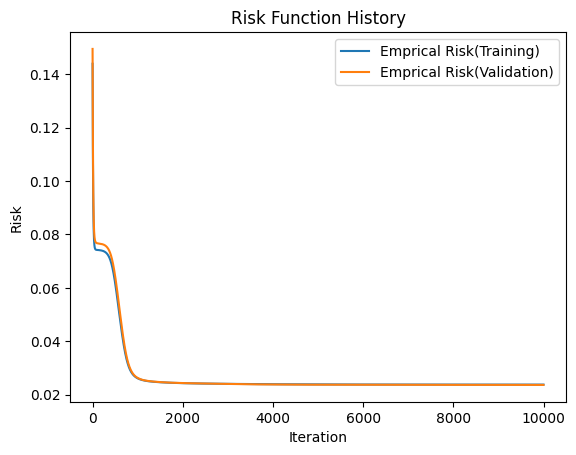

Test cost: 0.021543496075189156


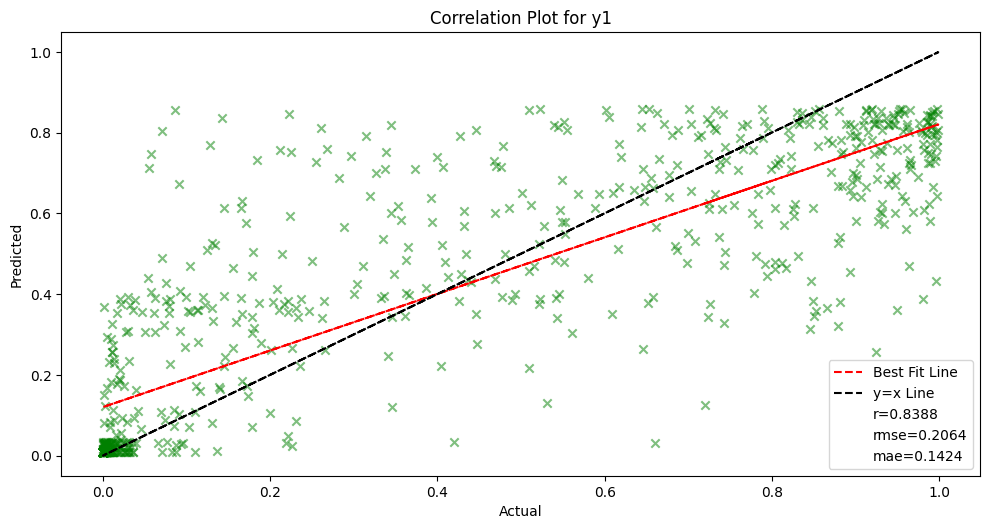

Train Cost after iteration 0: 0.14678252650864423 | Val Cost after iteration 0: 0.15229962446298975
Train Cost after iteration 500: 0.07423911680514222 | Val Cost after iteration 500: 0.0766803473197201
Train Cost after iteration 1000: 0.07422355506307021 | Val Cost after iteration 1000: 0.07666406538159211
Train Cost after iteration 1500: 0.07411829855438588 | Val Cost after iteration 1500: 0.07655542931491013
Train Cost after iteration 2000: 0.07325665241193392 | Val Cost after iteration 2000: 0.07566857311719609
Train Cost after iteration 2500: 0.0666988383807087 | Val Cost after iteration 2500: 0.06891729280064188
Train Cost after iteration 3000: 0.04359077777031439 | Val Cost after iteration 3000: 0.04480032477706307
Train Cost after iteration 3500: 0.030212343406076748 | Val Cost after iteration 3500: 0.030028263120732188
Train Cost after iteration 4000: 0.028728444994474082 | Val Cost after iteration 4000: 0.02808811428914779
Train Cost after iteration 4500: 0.028502981109021122

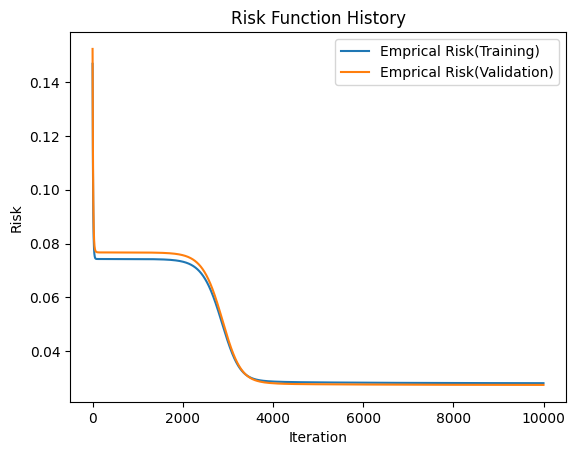

Test cost: 0.025606176426179843


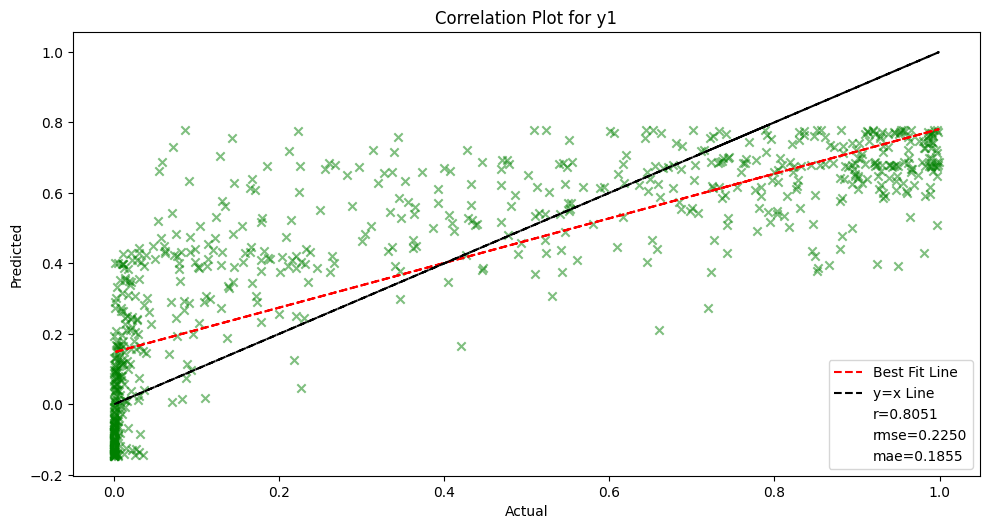

Train Cost after iteration 0: 0.14986245461700107 | Val Cost after iteration 0: 0.1553725274674304
Train Cost after iteration 500: 0.07424637638105008 | Val Cost after iteration 500: 0.0766884873003775
Train Cost after iteration 1000: 0.0742444497406443 | Val Cost after iteration 1000: 0.07668592236133692
Train Cost after iteration 1500: 0.07424380088449033 | Val Cost after iteration 1500: 0.07668505827976171
Train Cost after iteration 2000: 0.07424348281132656 | Val Cost after iteration 2000: 0.07668463470139239
Train Cost after iteration 2500: 0.07424324180941841 | Val Cost after iteration 2500: 0.07668431384424954
Train Cost after iteration 3000: 0.07424324180941841 | Val Cost after iteration 3000: 0.07668431384424954
Train Cost after iteration 3500: 0.07424324180941841 | Val Cost after iteration 3500: 0.07668431384424954
Train Cost after iteration 4000: 0.07424324180941841 | Val Cost after iteration 4000: 0.07668431384424954
Train Cost after iteration 4500: 0.07424324180941841 | Va

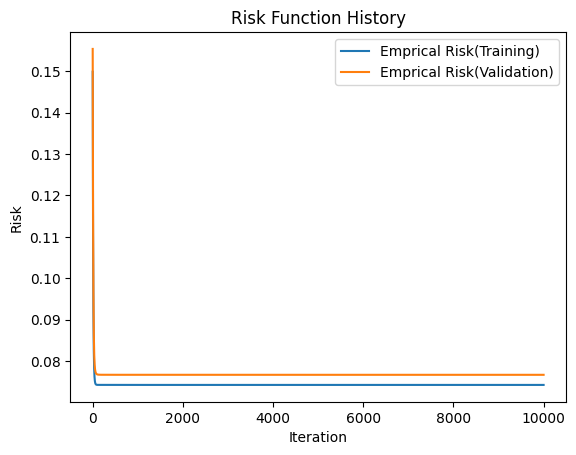

Test cost: 0.07184114649759107


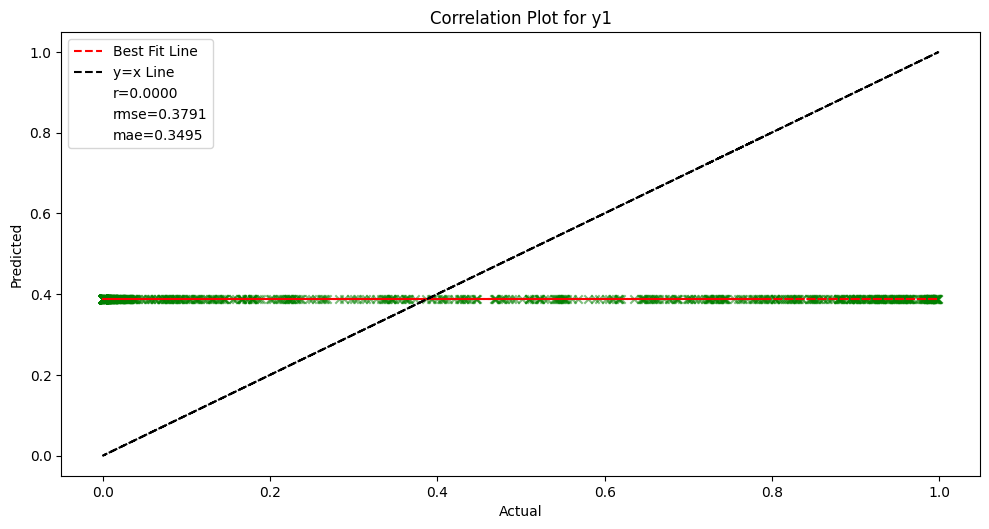

In [38]:
model_L1_reg = Model_Regression_lin(layer_dims, lambd, 1)
non_poly_reg_trainer.train(model_L1_reg, X_train,
                           y_train, X_val, y_val, identity, 1000)
non_poly_reg_tester.plot_y(X_test, y_test, model_L1_reg, identity)

model_L1_reg = Model_Regression_lin(layer_dims, lambd, 1)
non_poly_reg_trainer.train(model_L1_reg, X_train,
                           y_train, X_val, y_val, sigmoid, 1000)
non_poly_reg_tester.plot_y(X_test, y_test, model_L1_reg, sigmoid)

model_L1_reg = Model_Regression_lin(layer_dims, lambd, 1)
non_poly_reg_trainer.train(model_L1_reg, X_train,
                           y_train, X_val, y_val, np.tanh, 1000)
non_poly_reg_tester.plot_y(X_test, y_test, model_L1_reg, np.tanh)

### Testing performance with dropout


Train Cost after iteration 0: 0.1425872548453365 | Val Cost after iteration 0: 0.14814224270427653
Train Cost after iteration 500: 0.07569448166182903 | Val Cost after iteration 500: 0.07245486668921654
Train Cost after iteration 1000: 0.04881782154937393 | Val Cost after iteration 1000: 0.034432292414160286
Train Cost after iteration 1500: 0.04440967508355511 | Val Cost after iteration 1500: 0.030460370538163275
Train Cost after iteration 2000: 0.04117483552811802 | Val Cost after iteration 2000: 0.028527970768633473
Train Cost after iteration 2500: 0.04103844525032551 | Val Cost after iteration 2500: 0.027676414842285915
Train Cost after iteration 3000: 0.04159340763670627 | Val Cost after iteration 3000: 0.027316050229988318
Train Cost after iteration 3500: 0.041217805796966364 | Val Cost after iteration 3500: 0.027227797069574677
Train Cost after iteration 4000: 0.041225511567234883 | Val Cost after iteration 4000: 0.027174941213656604
Train Cost after iteration 4500: 0.04116681117

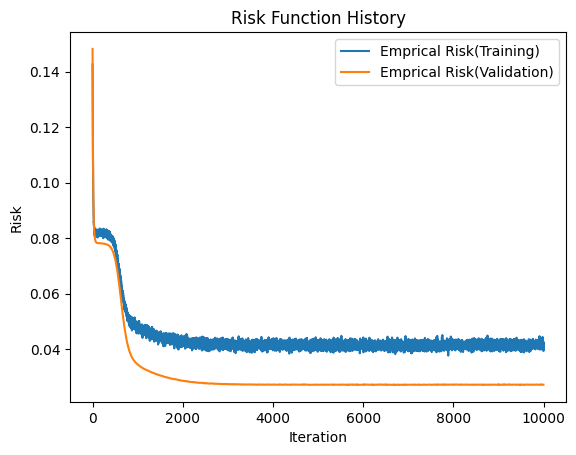

Test cost: 0.023908452946493068


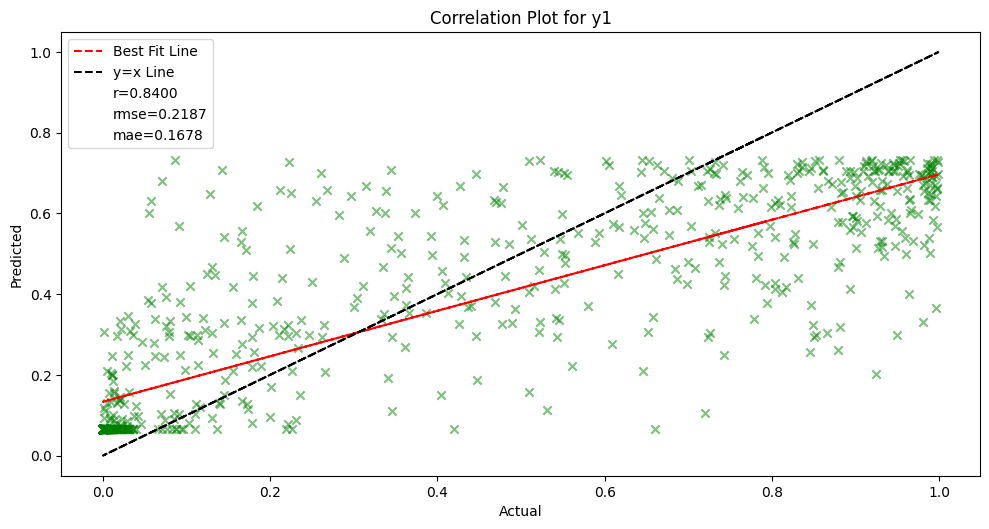

Train Cost after iteration 0: 0.1481706038306303 | Val Cost after iteration 0: 0.1537050010917196
Train Cost after iteration 500: 0.08102196079514991 | Val Cost after iteration 500: 0.07804416551349228
Train Cost after iteration 1000: 0.08072182631228003 | Val Cost after iteration 1000: 0.07722563255697094
Train Cost after iteration 1500: 0.07366274382120669 | Val Cost after iteration 1500: 0.07035304958374103
Train Cost after iteration 2000: 0.05600404072377778 | Val Cost after iteration 2000: 0.04809396590343752
Train Cost after iteration 2500: 0.04689911023099005 | Val Cost after iteration 2500: 0.035204801996220544
Train Cost after iteration 3000: 0.04372966450108794 | Val Cost after iteration 3000: 0.031523102819163436
Train Cost after iteration 3500: 0.04230490066589074 | Val Cost after iteration 3500: 0.03000238400117695
Train Cost after iteration 4000: 0.04341823078314178 | Val Cost after iteration 4000: 0.029334301848456115
Train Cost after iteration 4500: 0.04182899186395336 

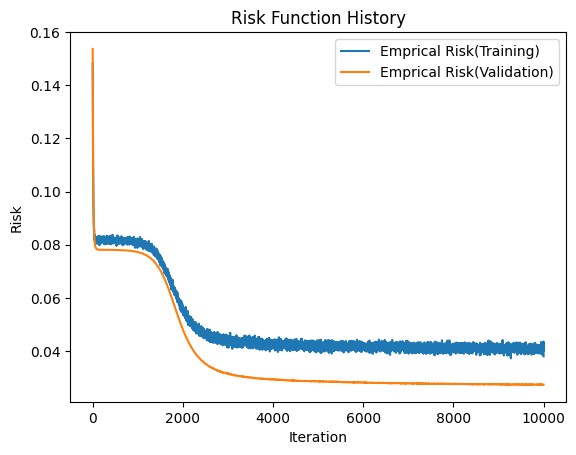

Test cost: 0.0240031690255363


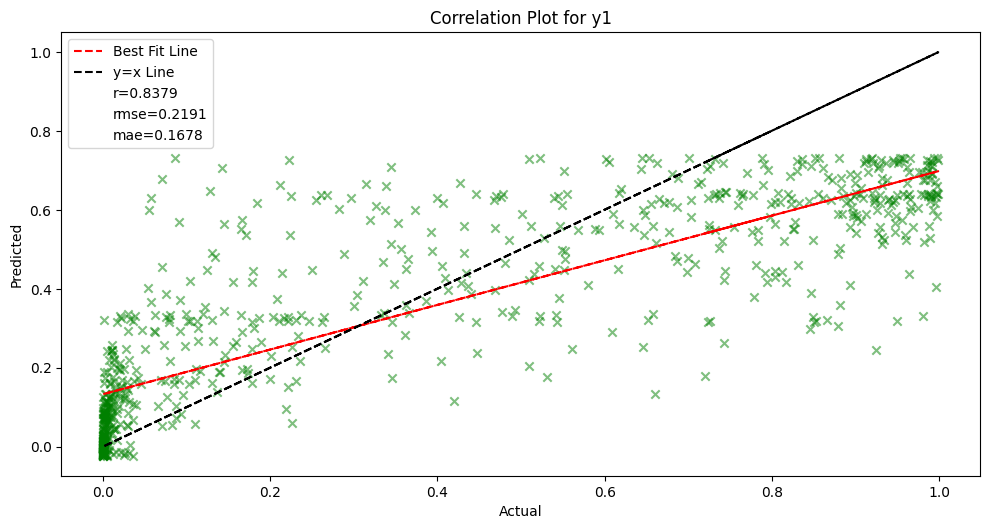

Train Cost after iteration 0: 0.1508970081570213 | Val Cost after iteration 0: 0.15645384641181523
Train Cost after iteration 500: 0.07181781845018376 | Val Cost after iteration 500: 0.06829627150278308
Train Cost after iteration 1000: 0.04322991361380735 | Val Cost after iteration 1000: 0.030890708591132483
Train Cost after iteration 1500: 0.04055285175260497 | Val Cost after iteration 1500: 0.028949806259561884
Train Cost after iteration 2000: 0.04253695379025056 | Val Cost after iteration 2000: 0.028121624870013445
Train Cost after iteration 2500: 0.04114893051327838 | Val Cost after iteration 2500: 0.02765929680677652
Train Cost after iteration 3000: 0.04113947765199872 | Val Cost after iteration 3000: 0.02731352622512699
Train Cost after iteration 3500: 0.038951948967249586 | Val Cost after iteration 3500: 0.027114204595867147
Train Cost after iteration 4000: 0.03868014700009485 | Val Cost after iteration 4000: 0.026934364088542734
Train Cost after iteration 4500: 0.04015989039640

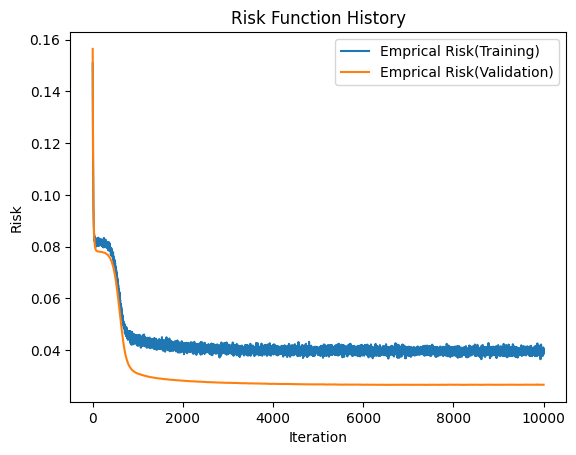

Test cost: 0.023522588681094265


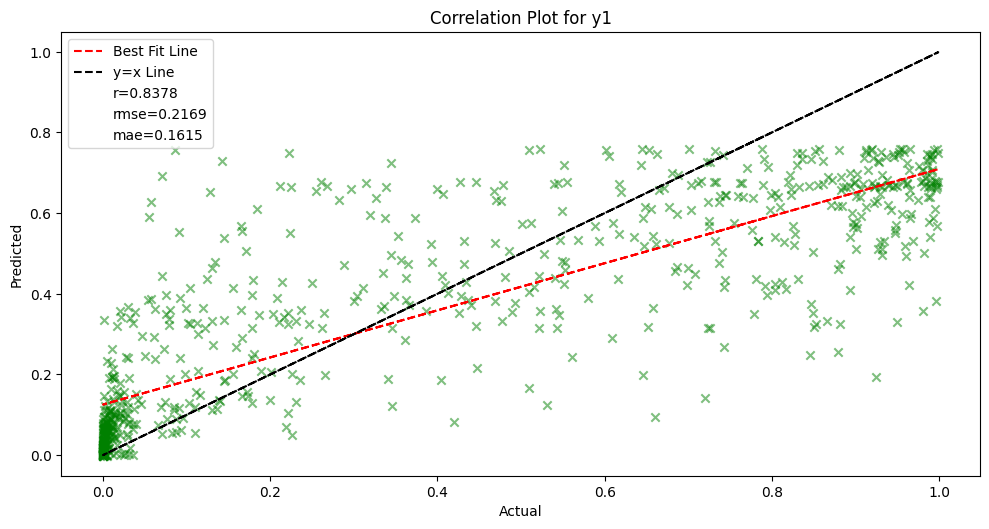

In [39]:
model_dropout = Model_Regression_lin(layer_dims, drop_prob=drop_prob)
non_poly_reg_trainer.train(model_dropout, X_train,
                           y_train, X_val, y_val, identity, 1000)
non_poly_reg_tester.plot_y(X_test, y_test, model_dropout, identity)

model_dropout = Model_Regression_lin(layer_dims, drop_prob=drop_prob)
non_poly_reg_trainer.train(model_dropout, X_train,
                           y_train, X_val, y_val, sigmoid, 1000)
non_poly_reg_tester.plot_y(X_test, y_test, model_dropout, sigmoid)

model_dropout = Model_Regression_lin(layer_dims, drop_prob=drop_prob)
non_poly_reg_trainer.train(model_dropout, X_train,
                           y_train, X_val, y_val, np.tanh, 1000)
non_poly_reg_tester.plot_y(X_test, y_test, model_dropout, np.tanh)

In [5]:
class Model_Regression_lin_f(Model_Regression_lin):
    def __init__(self, layer_dims, act="linear", lambd=0.0, reg_type=2, drop_prob=0.0) -> None:
        self.act = act
        super().__init__(layer_dims, lambd, reg_type, drop_prob)

    def linear_activation_forward(self, A_prev, W, b, activation):
        if activation == "relu":
            Z, linear_cache = self.linear_forward(A_prev, W, b)
            A = np.maximum(0, Z)

        elif activation == "linear":
            Z, linear_cache = self.linear_forward(A_prev, W, b)
            A = Z

        elif activation == "sigmoid":
            Z, linear_cache = self.linear_forward(A_prev, W, b)
            A = sigmoid(Z)

        # elif activation == "tanh_0_1":
        else:
            Z, linear_cache = self.linear_forward(A_prev, W, b)
            A = tanh_0_1(Z)

        cache = (linear_cache, Z)

        # Implementing dropout
        if self.train:
            keep_prob = 1.0 - self.drop_prob
            D = np.random.rand(A.shape[0], A.shape[1]) < keep_prob
            A = np.multiply(A, D)
            A /= keep_prob
            cache = (cache[0], cache[1], D)

        return A, cache

    def linear_activation_backward(self, dA, cache, activation):
        
        if self.train:
            linear_cache, activation_cache, D = cache
            keep_prob = 1.0 - self.drop_prob
            dA = np.multiply(dA, D)
            # Scale the gradients with respect to the neurons that haven't been dropped
            dA /= keep_prob

        else:
            linear_cache, activation_cache = cache

        if activation == "relu":
            dZ = np.array(dA, copy=True)
            dZ[activation_cache <= 0] = 0
            dA_prev, dW, db = self.linear_backward(dZ, linear_cache)

        elif activation == "linear":
            dZ = dA
            dA_prev, dW, db = self.linear_backward(dZ, linear_cache)

        elif activation == "sigmoid":
            A = sigmoid(activation_cache)  # Z = activation_cache
            dZ = dA * A * (1-A)
            dA_prev, dW, db = self.linear_backward(dZ, linear_cache)

        # elif activation == "tanh_0_1":
        else:
            A = tanh_0_1(activation_cache)  # Z = activation_cache
            dZ = dA * 0.5 * (1 - np.square(A))
            dA_prev, dW, db = self.linear_backward(dZ, linear_cache)

        return dA_prev, dW, db

    def L_model_forward(self, X):
        self.caches = []
        A = X
        L = len(self.parameters) // 2

        for l in range(1, L):
            A_prev = A
            A, cache = self.linear_activation_forward(
                A_prev, self.parameters['W' + str(l)], self.parameters['b' + str(l)], 'relu')
            self.caches.append(cache)

        AL, cache = self.linear_activation_forward(
            A, self.parameters['W' + str(L)], self.parameters['b' + str(L)], self.act)
        self.caches.append(cache)

        return AL

    def L_model_backward(self, AL, Y):
        self.grads = {}
        m = AL.shape[1]  # number of examples
        L = len(self.caches)
        Y = Y.reshape(AL.shape)  # after this line, Y is the same shape as AL

        # Initializing the backpropagation
        dAL = (AL - Y)  # derivative of cost with respect to AL

        # Lth layer (linear -> linear) gradients. Inputs: "dAL, current_cache". Outputs: "grads["dAL"], grads["dWl"], grads["dbl"]"
        current_cache = self.caches[L-1]
        self.grads["dA" + str(L)], self.grads["dW" + str(L)], self.grads["db" + str(
            L)] = self.linear_activation_backward(dAL, current_cache, self.act)

        # Adding L2/L1 regularization term to dW for the last layer caches[L-1][0][1] retrieves W^{[L]}
        self.grads["dW" + str(L)] += (self.lambd / m) * (self.caches[L-1][0][1]
                                                         if self.reg_type == 2 else np.sign(self.caches[L-1][0][1]))

    # Loop from l=L-2 to l=0
        for l in reversed(range(L-1)):
            # lth layer: (RELU -> LINEAR) gradients.
            current_cache = self.caches[l]
            dA_prev_temp, dW_temp, db_temp = self.linear_activation_backward(
                self.grads["dA" + str(l+2)], current_cache, "relu")

            # Adding L2/L1 regularization term to dW for each layer caches[l][0][1] retrieves W^{[l+1]}
            dW_temp += (self.lambd / m) * \
                (self.caches[l][0][1] if self.reg_type ==
                 2 else np.sign(self.caches[l][0][1]))

            self.grads["dA" + str(l+1)] = dA_prev_temp
            self.grads["dW" + str(l+1)] = dW_temp
            self.grads["db" + str(l+1)] = db_temp

In [41]:
# Define the MLP architecture
layer_dims = [5, 3, 3, 1]  # 3-layer model

# Training hyperparameters
learning_rate = 0.0075
num_iterations = 10000

lambd = 0.1  # Regularization parameter

drop_prob = 0.1  # Dropout Probability

reg_trainer = Trainer_reg(num_iterations, learning_rate, 1000)
reg_tester = Evaluate_reg()

In [42]:
model_no_reg = Model_Regression_lin_f(layer_dims)
model_L2_reg = Model_Regression_lin_f(layer_dims, "linear", lambd)
model_L1_reg = Model_Regression_lin_f(layer_dims, "linear", lambd, 1)
model_dropout = Model_Regression_lin_f(layer_dims, "linear", drop_prob=drop_prob)

In [43]:
model_no_reg_sigmoid = Model_Regression_lin_f(layer_dims, "sigmoid")
model_L2_reg_sigmoid = Model_Regression_lin_f(layer_dims, "sigmoid", lambd)
model_L1_reg_sigmoid = Model_Regression_lin_f(layer_dims, "sigmoid", lambd, 1)
model_dropout_sigmoid = Model_Regression_lin_f(layer_dims, "sigmoid", drop_prob=drop_prob)

In [44]:
model_no_reg_tanh01 = Model_Regression_lin_f(layer_dims, "tanh_0_1")
model_L2_reg_tanh01 = Model_Regression_lin_f(layer_dims, "tanh_0_1", lambd)
model_L1_reg_tanh01 = Model_Regression_lin_f(layer_dims, "tanh_0_1", lambd, 1)
model_dropout_tanh01 = Model_Regression_lin_f(layer_dims, "tanh_0_1", drop_prob=drop_prob)

### Testing non-regularised performance


Train Cost after iteration 0: 0.14748520208427185 | Val Cost after iteration 0: 0.15300083064302172
Train Cost after iteration 500: 0.07424324090834548 | Val Cost after iteration 500: 0.07668431134211963
Train Cost after iteration 1000: 0.07424324090842088 | Val Cost after iteration 1000: 0.07668431134109677
Train Cost after iteration 1500: 0.07424324090842088 | Val Cost after iteration 1500: 0.07668431134109677
Train Cost after iteration 2000: 0.07424324090842088 | Val Cost after iteration 2000: 0.07668431134109677
Train Cost after iteration 2500: 0.07424324090842088 | Val Cost after iteration 2500: 0.07668431134109677
Train Cost after iteration 3000: 0.07424324090842088 | Val Cost after iteration 3000: 0.07668431134109677
Train Cost after iteration 3500: 0.07424324090842088 | Val Cost after iteration 3500: 0.07668431134109677
Train Cost after iteration 4000: 0.07424324090842088 | Val Cost after iteration 4000: 0.07668431134109677
Train Cost after iteration 4500: 0.07424324090842088 |

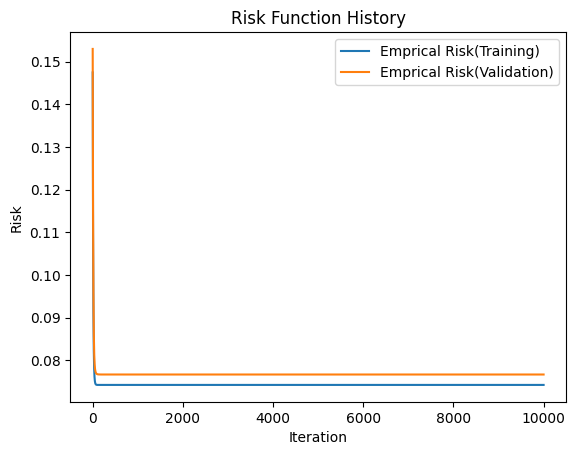

Test cost: 0.07184114385788674


C:\Users\ASUS\AppData\Local\Temp\ipykernel_4440\646417503.py:20: RuntimeWarning: invalid value encountered in scalar divide
  return numerator / denominator


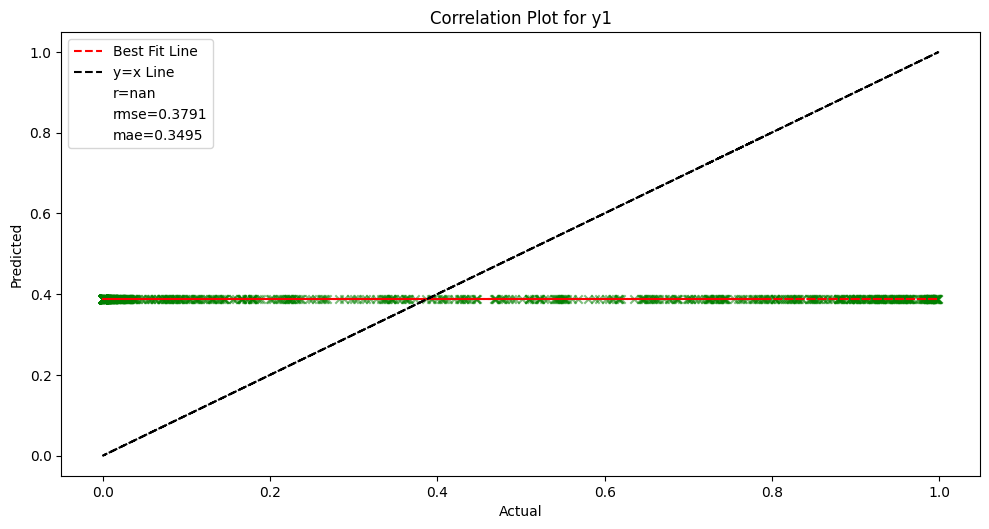

Train Cost after iteration 0: 0.08072836127040683 | Val Cost after iteration 0: 0.08102205248726098
Train Cost after iteration 500: 0.07468488431882421 | Val Cost after iteration 500: 0.07658732609763766
Train Cost after iteration 1000: 0.07428169636415838 | Val Cost after iteration 1000: 0.07657886277540318
Train Cost after iteration 1500: 0.07424741749899569 | Val Cost after iteration 1500: 0.07665033284139952
Train Cost after iteration 2000: 0.0742434604507053 | Val Cost after iteration 2000: 0.07667566219487149
Train Cost after iteration 2500: 0.07424278400570485 | Val Cost after iteration 2500: 0.0766831759213273
Train Cost after iteration 3000: 0.07424262803202995 | Val Cost after iteration 3000: 0.07668531675145154
Train Cost after iteration 3500: 0.07424258686894798 | Val Cost after iteration 3500: 0.07668592020052409
Train Cost after iteration 4000: 0.07424257547669452 | Val Cost after iteration 4000: 0.07668608976977105
Train Cost after iteration 4500: 0.07424257224912577 | V

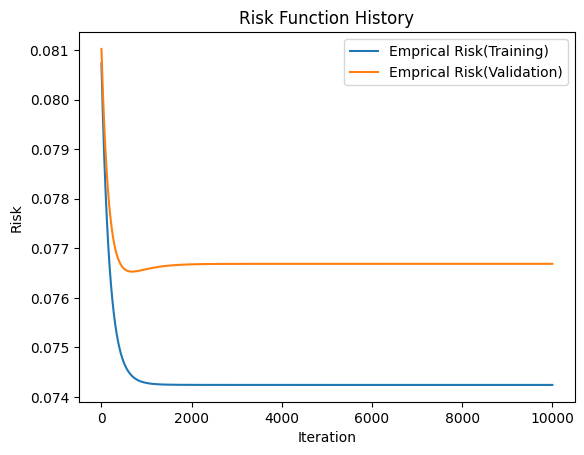

Test cost: 0.07184135257587193


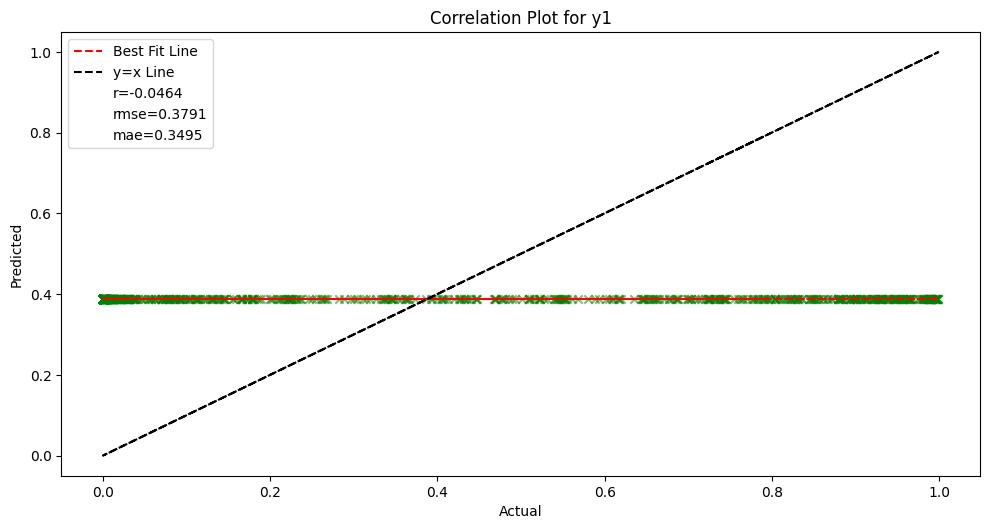

Train Cost after iteration 0: 0.07997853151238733 | Val Cost after iteration 0: 0.08037057269841053
Train Cost after iteration 500: 0.07424473545654811 | Val Cost after iteration 500: 0.07666599742265681
Train Cost after iteration 1000: 0.07424268651441474 | Val Cost after iteration 1000: 0.07668564855964807
Train Cost after iteration 1500: 0.07424267184905142 | Val Cost after iteration 1500: 0.07668586497422121
Train Cost after iteration 2000: 0.07424267169363855 | Val Cost after iteration 2000: 0.07668586728042115
Train Cost after iteration 2500: 0.07424267169198306 | Val Cost after iteration 2500: 0.07668586730498848
Train Cost after iteration 3000: 0.07424267169196544 | Val Cost after iteration 3000: 0.07668586730525019
Train Cost after iteration 3500: 0.07424267169196525 | Val Cost after iteration 3500: 0.07668586730525298
Train Cost after iteration 4000: 0.07424267169196525 | Val Cost after iteration 4000: 0.07668586730525298
Train Cost after iteration 4500: 0.07424267169196525 |

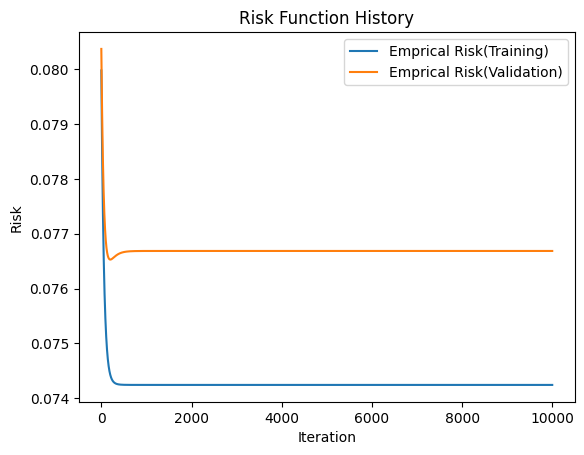

Test cost: 0.07184131881833623


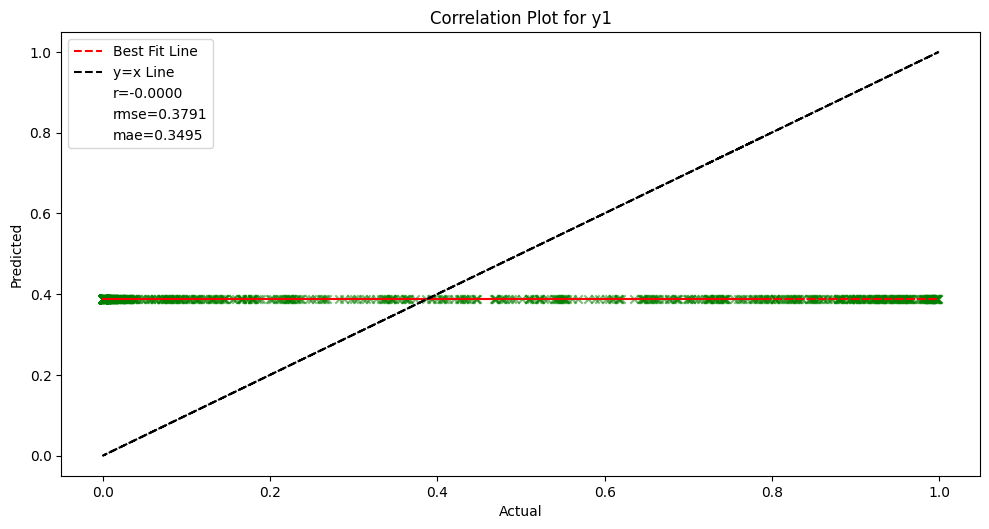

In [45]:
reg_trainer.train(model_no_reg, X_train,
                  y_train, X_val, y_val, 1000)
reg_tester.plot_y(X_test, y_test, model_no_reg)

reg_trainer.train(model_no_reg_sigmoid, X_train,
                  y_train, X_val, y_val, 1000)
reg_tester.plot_y(X_test, y_test, model_no_reg_sigmoid)

reg_trainer.train(model_no_reg_tanh01, X_train,
                  y_train, X_val, y_val, 1000)
reg_tester.plot_y(X_test, y_test, model_no_reg_tanh01)

### Testing L2-regularised performance


Train Cost after iteration 0: 0.14742370894193418 | Val Cost after iteration 0: 0.1529405069976157
Train Cost after iteration 500: 0.07424336998519329 | Val Cost after iteration 500: 0.07668448447597614
Train Cost after iteration 1000: 0.07424336841919472 | Val Cost after iteration 1000: 0.07668448245471883
Train Cost after iteration 1500: 0.07424336685747537 | Val Cost after iteration 1500: 0.0766844804428102
Train Cost after iteration 2000: 0.07424336529958747 | Val Cost after iteration 2000: 0.07668447843874018
Train Cost after iteration 2500: 0.07424336374486504 | Val Cost after iteration 2500: 0.07668447644229638
Train Cost after iteration 3000: 0.07424336219310874 | Val Cost after iteration 3000: 0.0766844744532397
Train Cost after iteration 3500: 0.07424336064390236 | Val Cost after iteration 3500: 0.07668447247081396
Train Cost after iteration 4000: 0.07424335909678063 | Val Cost after iteration 4000: 0.07668447049506125
Train Cost after iteration 4500: 0.07424335755143888 | Va

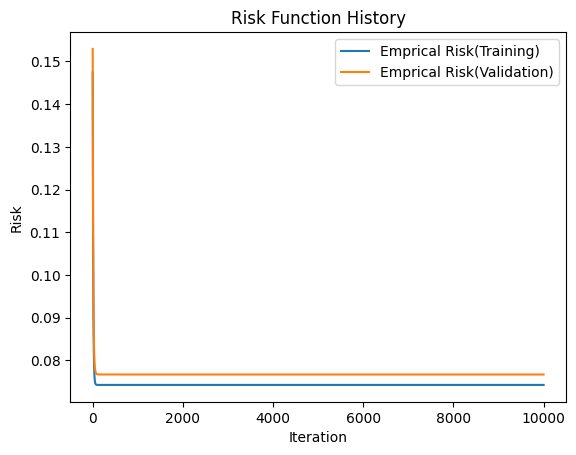

Test cost: 0.07184127726722254


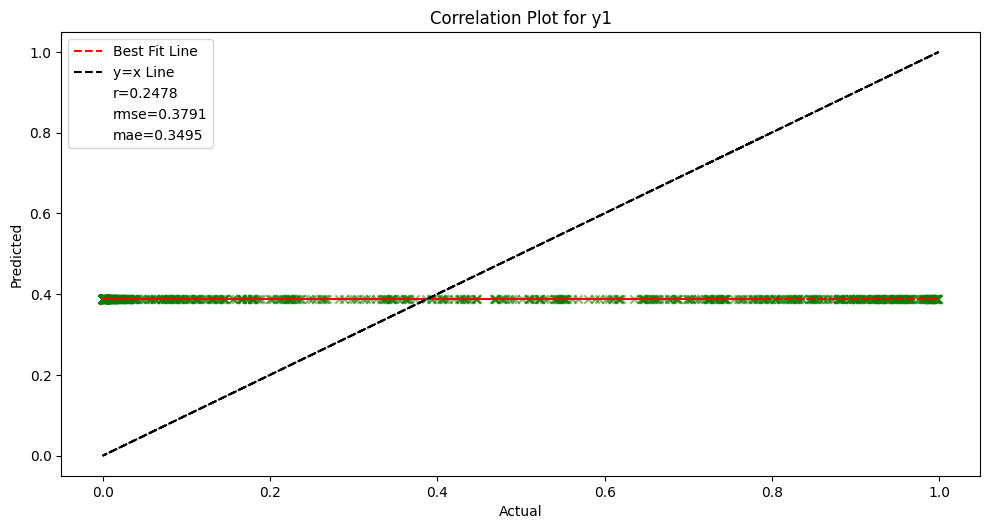

Train Cost after iteration 0: 0.08048063385924181 | Val Cost after iteration 0: 0.0808166731126408
Train Cost after iteration 500: 0.07466873500762812 | Val Cost after iteration 500: 0.07658167432864163
Train Cost after iteration 1000: 0.07428046214964887 | Val Cost after iteration 1000: 0.07658053967122448
Train Cost after iteration 1500: 0.07424738128313434 | Val Cost after iteration 1500: 0.07665116060237734
Train Cost after iteration 2000: 0.074243543652888 | Val Cost after iteration 2000: 0.07667602056346096
Train Cost after iteration 2500: 0.07424288178254557 | Val Cost after iteration 2500: 0.07668337648962165
Train Cost after iteration 3000: 0.07424272644484241 | Val Cost after iteration 3000: 0.07668546733859427
Train Cost after iteration 3500: 0.0742426832442707 | Val Cost after iteration 3500: 0.07668605391079146
Train Cost after iteration 4000: 0.07424266918687629 | Val Cost after iteration 4000: 0.07668621648635879
Train Cost after iteration 4500: 0.07424266316196891 | Val

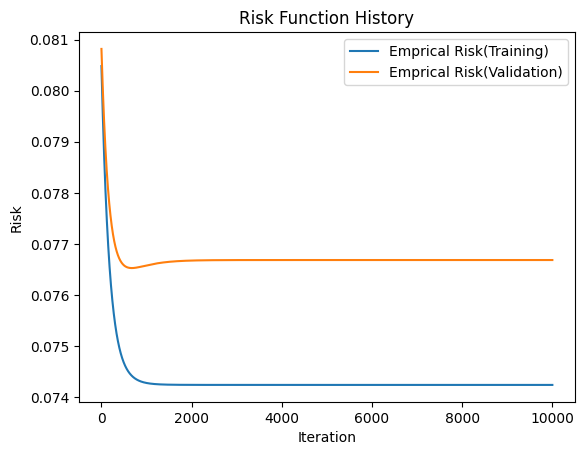

Test cost: 0.0718414492203625


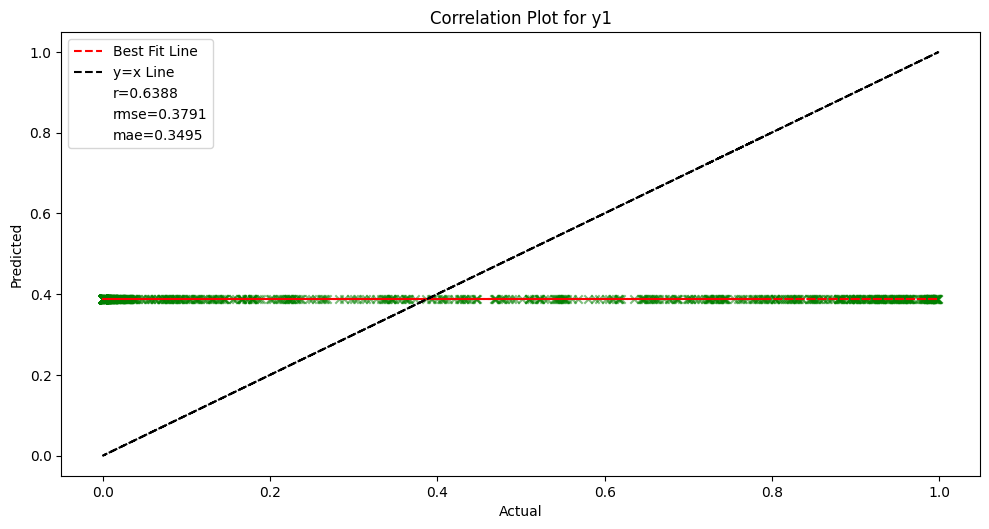

Train Cost after iteration 0: 0.081050777868275 | Val Cost after iteration 0: 0.08125229545199482
Train Cost after iteration 500: 0.07424501571476044 | Val Cost after iteration 500: 0.07666421548945555
Train Cost after iteration 1000: 0.07424268849495043 | Val Cost after iteration 1000: 0.07668568032583646
Train Cost after iteration 1500: 0.07424266247444247 | Val Cost after iteration 1500: 0.07668590745307774
Train Cost after iteration 2000: 0.07424265178141153 | Val Cost after iteration 2000: 0.07668589954958442
Train Cost after iteration 2500: 0.07424264062961666 | Val Cost after iteration 2500: 0.07668588859210307
Train Cost after iteration 3000: 0.07424262877445907 | Val Cost after iteration 3000: 0.0766858769682584
Train Cost after iteration 3500: 0.07424261616459878 | Val Cost after iteration 3500: 0.07668586460797507
Train Cost after iteration 4000: 0.0742426027131662 | Val Cost after iteration 4000: 0.07668585143444208
Train Cost after iteration 4500: 0.0742425883037513 | Val 

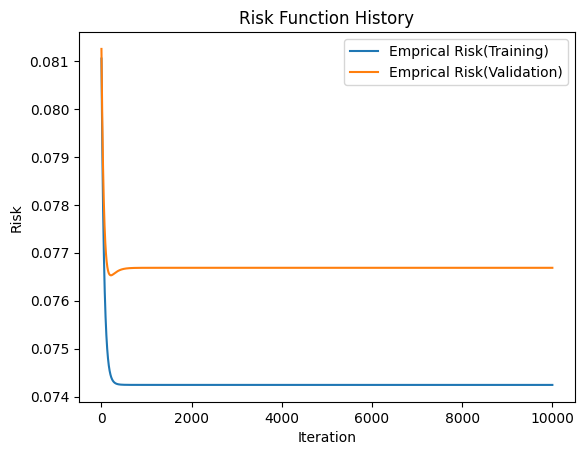

Test cost: 0.0718410687637073


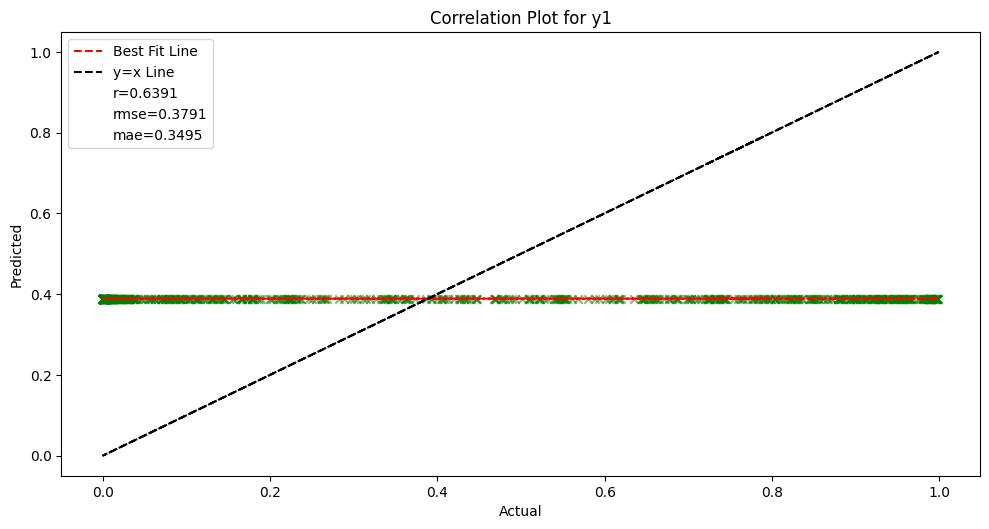

In [46]:
reg_trainer.train(model_L2_reg, X_train,
                  y_train, X_val, y_val, 1000)
reg_tester.plot_y(X_test, y_test, model_L2_reg)

reg_trainer.train(model_L2_reg_sigmoid, X_train,
                  y_train, X_val, y_val, 1000)
reg_tester.plot_y(X_test, y_test, model_L2_reg_sigmoid)

reg_trainer.train(model_L2_reg_tanh01, X_train,
                  y_train, X_val, y_val, 1000)
reg_tester.plot_y(X_test, y_test, model_L2_reg_tanh01)

### Testing L1-regularised performance


Train Cost after iteration 0: 0.14947804661816616 | Val Cost after iteration 0: 0.1549846705344853
Train Cost after iteration 500: 0.07424678345094224 | Val Cost after iteration 500: 0.07668911140410972
Train Cost after iteration 1000: 0.07424455009543937 | Val Cost after iteration 1000: 0.07668605530290169
Train Cost after iteration 1500: 0.07424377980051917 | Val Cost after iteration 1500: 0.07668503055055112
Train Cost after iteration 2000: 0.0742432609050834 | Val Cost after iteration 2000: 0.07668433925454321
Train Cost after iteration 2500: 0.07424324256837966 | Val Cost after iteration 2500: 0.07668431532559082
Train Cost after iteration 3000: 0.07424324256846646 | Val Cost after iteration 3000: 0.07668431532520871
Train Cost after iteration 3500: 0.07424324256855323 | Val Cost after iteration 3500: 0.07668431532482661
Train Cost after iteration 4000: 0.07424324256864001 | Val Cost after iteration 4000: 0.07668431532444452
Train Cost after iteration 4500: 0.0742432425687268 | Va

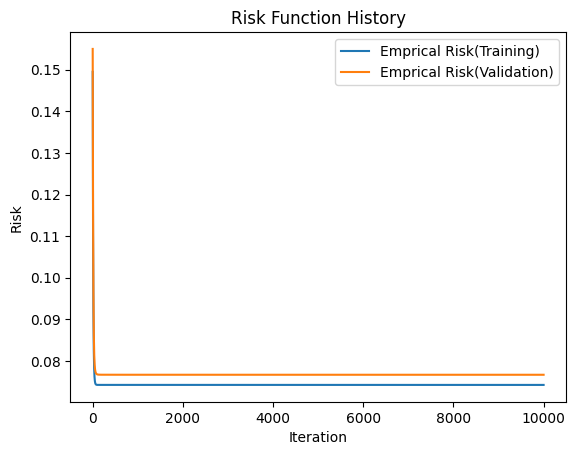

Test cost: 0.07184114788760043


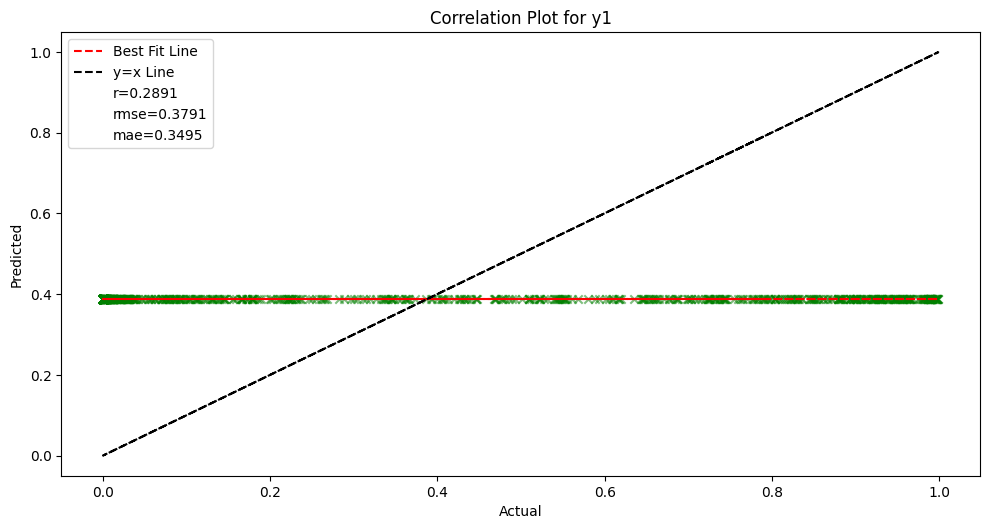

Train Cost after iteration 0: 0.08102350193366031 | Val Cost after iteration 0: 0.08127316812701968
Train Cost after iteration 500: 0.07470736626533199 | Val Cost after iteration 500: 0.07660108704479603
Train Cost after iteration 1000: 0.0742862706376684 | Val Cost after iteration 1000: 0.07658142890413215
Train Cost after iteration 1500: 0.07424917897905574 | Val Cost after iteration 1500: 0.07665129034802706
Train Cost after iteration 2000: 0.07424401415253298 | Val Cost after iteration 2000: 0.07667548280038276
Train Cost after iteration 2500: 0.07424281828836699 | Val Cost after iteration 2500: 0.07668285444614849
Train Cost after iteration 3000: 0.07424263307076617 | Val Cost after iteration 3000: 0.07668522337502713
Train Cost after iteration 3500: 0.07424258725118459 | Val Cost after iteration 3500: 0.07668589538829086
Train Cost after iteration 4000: 0.07424257452945311 | Val Cost after iteration 4000: 0.07668608352916693
Train Cost after iteration 4500: 0.07424257101582506 | 

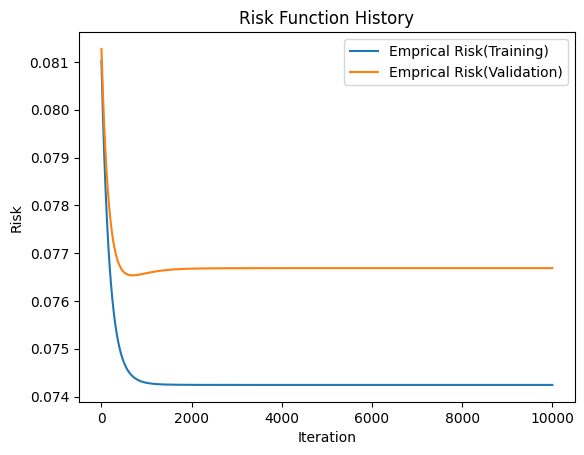

Test cost: 0.07184135563387496


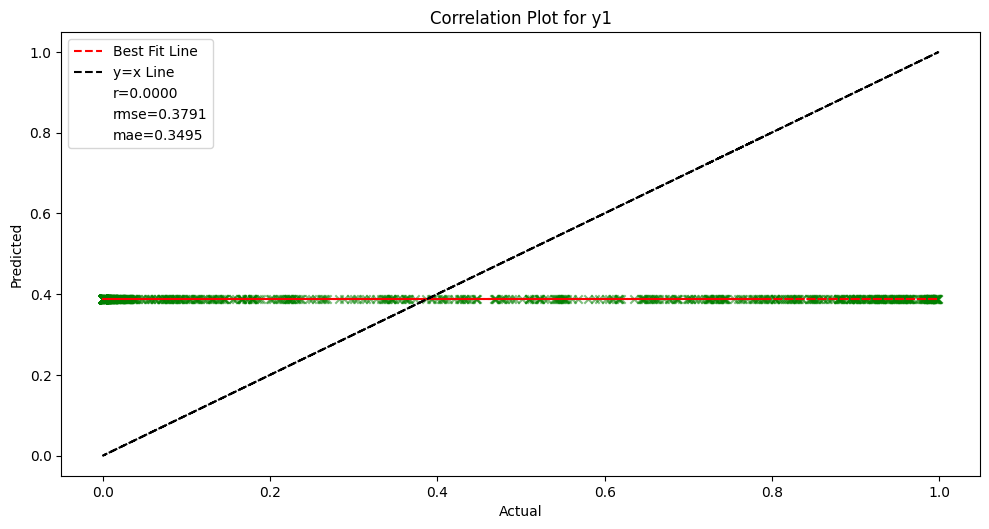

Train Cost after iteration 0: 0.08141396818289658 | Val Cost after iteration 0: 0.08156037392150454
Train Cost after iteration 500: 0.0742514209967559 | Val Cost after iteration 500: 0.07667192157176356
Train Cost after iteration 1000: 0.07424512334451801 | Val Cost after iteration 1000: 0.07668883068406099
Train Cost after iteration 1500: 0.07424341474347566 | Val Cost after iteration 1500: 0.07668685499014144
Train Cost after iteration 2000: 0.07424285562671318 | Val Cost after iteration 2000: 0.07668611386816185
Train Cost after iteration 2500: 0.07424267304374538 | Val Cost after iteration 2500: 0.07668587100602413
Train Cost after iteration 3000: 0.07424267304372002 | Val Cost after iteration 3000: 0.07668587100637791
Train Cost after iteration 3500: 0.07424267304371768 | Val Cost after iteration 3500: 0.07668587100639014
Train Cost after iteration 4000: 0.07424267304371557 | Val Cost after iteration 4000: 0.07668587100639873
Train Cost after iteration 4500: 0.07424267304371347 | 

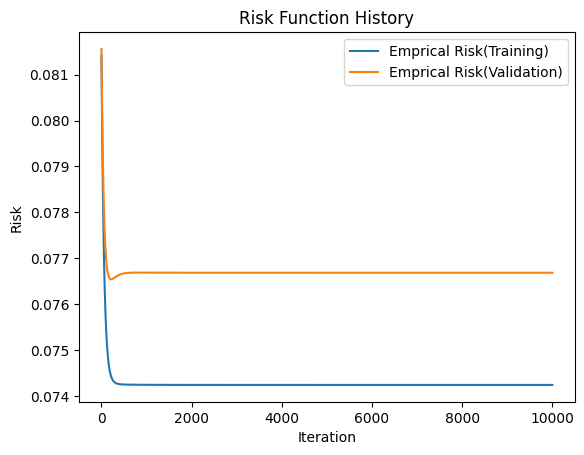

Test cost: 0.07184132278192709


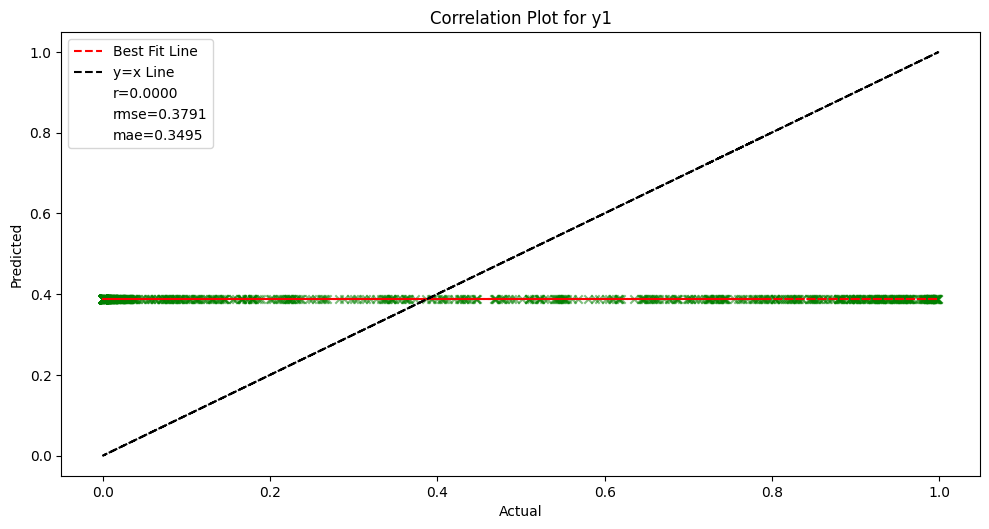

In [47]:
reg_trainer.train(model_L1_reg, X_train,
                  y_train, X_val, y_val, 1000)
reg_tester.plot_y(X_test, y_test, model_L1_reg)

reg_trainer.train(model_L1_reg_sigmoid, X_train,
                  y_train, X_val, y_val, 1000)
reg_tester.plot_y(X_test, y_test, model_L1_reg_sigmoid)

reg_trainer.train(model_L1_reg_tanh01, X_train,
                  y_train, X_val, y_val, 1000)
reg_tester.plot_y(X_test, y_test, model_L1_reg_tanh01)

### Testing performance with dropout


Train Cost after iteration 0: 0.1515153006519161 | Val Cost after iteration 0: 0.15701689561107526
Train Cost after iteration 500: 0.08220883700234366 | Val Cost after iteration 500: 0.07812016734969136
Train Cost after iteration 1000: 0.08149486319809449 | Val Cost after iteration 1000: 0.0781241895154184
Train Cost after iteration 1500: 0.08159355342148931 | Val Cost after iteration 1500: 0.0781093932638554
Train Cost after iteration 2000: 0.08199769835182795 | Val Cost after iteration 2000: 0.07812807295820001
Train Cost after iteration 2500: 0.08203194650437093 | Val Cost after iteration 2500: 0.07814536388549892
Train Cost after iteration 3000: 0.08222972277289603 | Val Cost after iteration 3000: 0.07813091441067879
Train Cost after iteration 3500: 0.0820030442652314 | Val Cost after iteration 3500: 0.07812659618541308
Train Cost after iteration 4000: 0.08041986238183696 | Val Cost after iteration 4000: 0.07811823248672996
Train Cost after iteration 4500: 0.08118175563094664 | Val

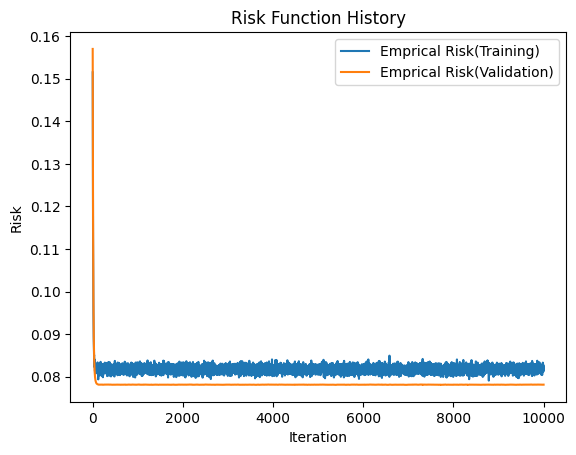

Test cost: 0.07267483754700836


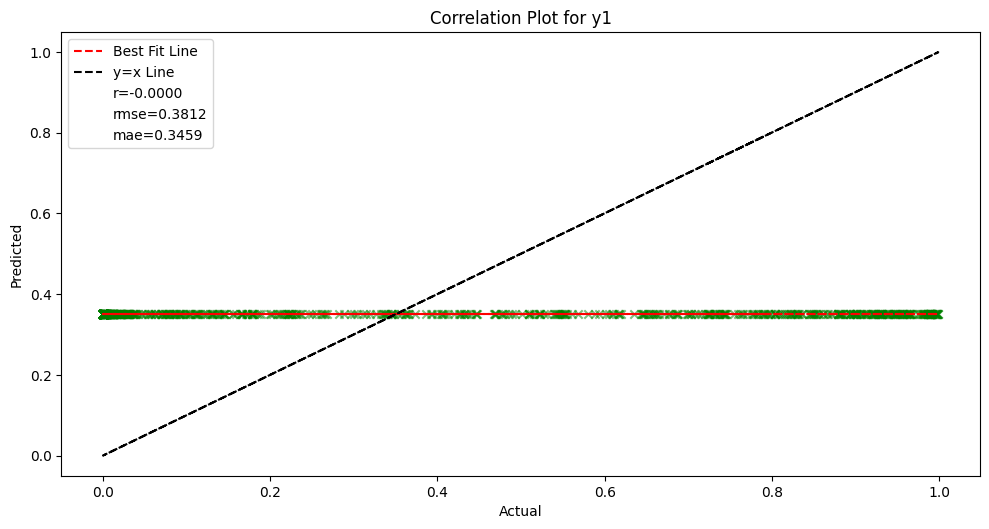

Train Cost after iteration 0: 0.09420716863780924 | Val Cost after iteration 0: 0.08070698797032076
Train Cost after iteration 500: 0.08273181092068788 | Val Cost after iteration 500: 0.07679255010999567
Train Cost after iteration 1000: 0.08094563995712392 | Val Cost after iteration 1000: 0.07767700013600343
Train Cost after iteration 1500: 0.08174952950669057 | Val Cost after iteration 1500: 0.078000802900662
Train Cost after iteration 2000: 0.08130134422772238 | Val Cost after iteration 2000: 0.07809814945707118
Train Cost after iteration 2500: 0.08274339756264831 | Val Cost after iteration 2500: 0.07811639659139256
Train Cost after iteration 3000: 0.08168745832696747 | Val Cost after iteration 3000: 0.07812874147427624
Train Cost after iteration 3500: 0.08149676143690396 | Val Cost after iteration 3500: 0.07813486542859129
Train Cost after iteration 4000: 0.08090829759399014 | Val Cost after iteration 4000: 0.07813073559735077
Train Cost after iteration 4500: 0.08202149645498434 | V

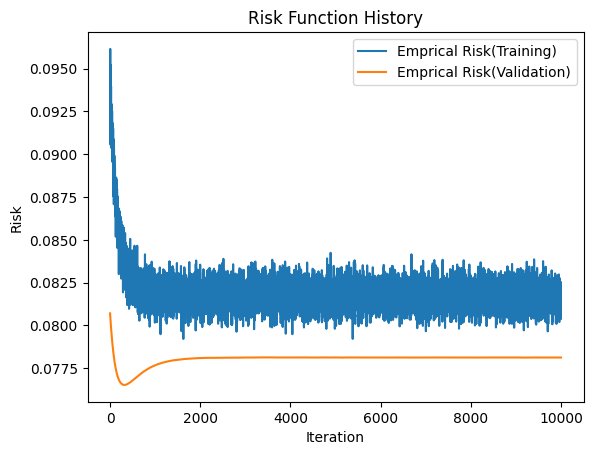

Test cost: 0.0726755668425252


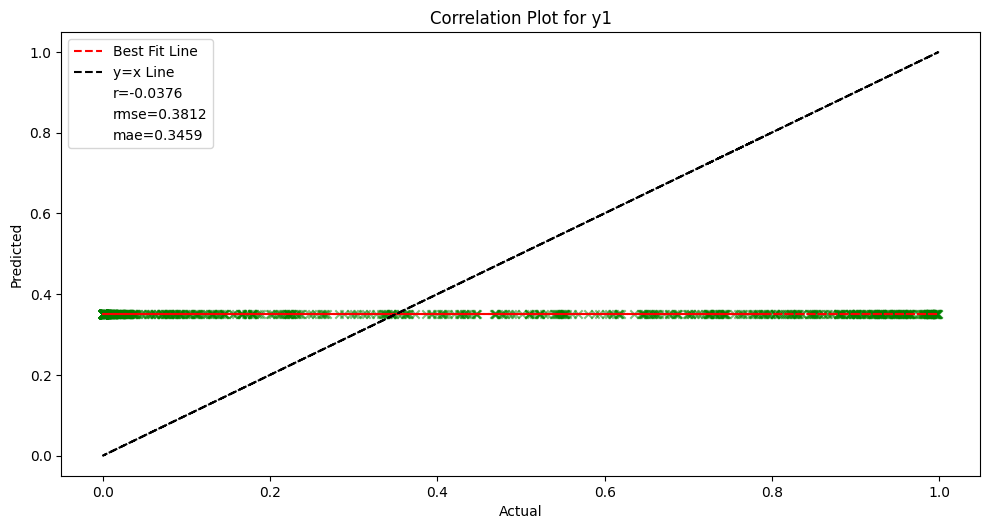

Train Cost after iteration 0: 0.09314954027485807 | Val Cost after iteration 0: 0.08065924324058782
Train Cost after iteration 500: 0.0823127242254206 | Val Cost after iteration 500: 0.07807117605454536
Train Cost after iteration 1000: 0.08155516758190075 | Val Cost after iteration 1000: 0.0781276128215638
Train Cost after iteration 1500: 0.08348433349261929 | Val Cost after iteration 1500: 0.07813274739047718
Train Cost after iteration 2000: 0.0816538943700782 | Val Cost after iteration 2000: 0.07813434936896407
Train Cost after iteration 2500: 0.08052637058101025 | Val Cost after iteration 2500: 0.07813408874406251
Train Cost after iteration 3000: 0.08161972076589612 | Val Cost after iteration 3000: 0.0781308150680009
Train Cost after iteration 3500: 0.08097141401932893 | Val Cost after iteration 3500: 0.0781247418059428
Train Cost after iteration 4000: 0.08297163713856105 | Val Cost after iteration 4000: 0.07812696918060108
Train Cost after iteration 4500: 0.08164827458254692 | Val 

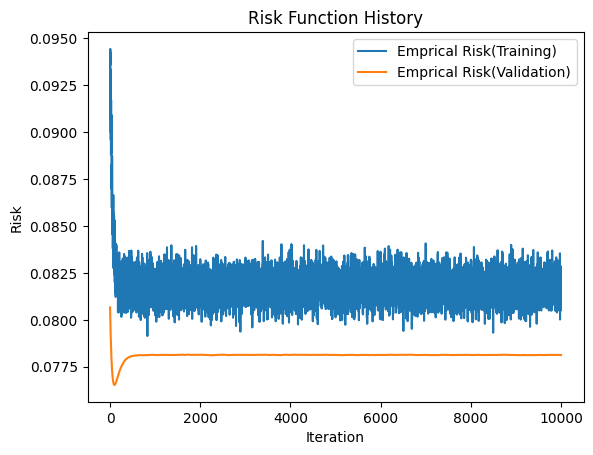

Test cost: 0.07266748659173039


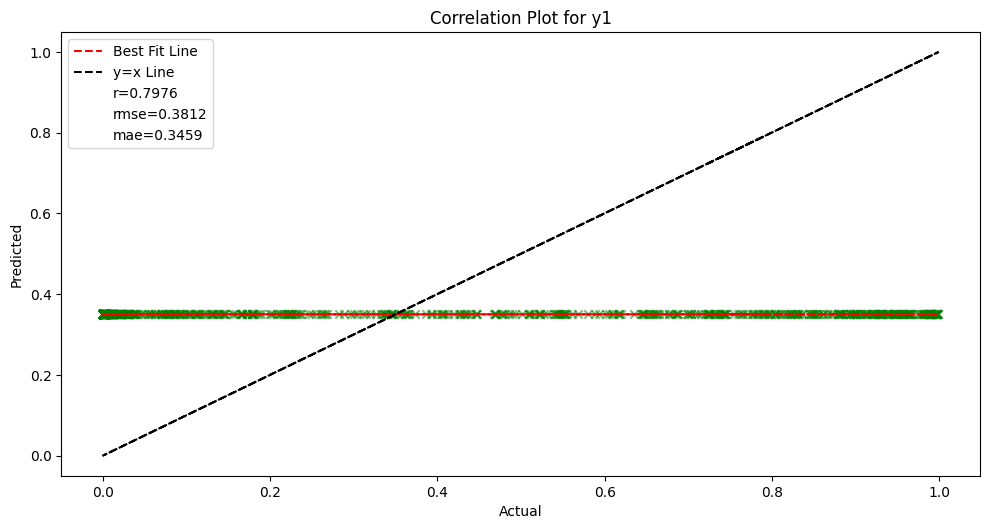

In [48]:
reg_trainer.train(model_dropout, X_train,
                  y_train, X_val, y_val, 1000)
reg_tester.plot_y(X_test, y_test, model_dropout)

reg_trainer.train(model_dropout_sigmoid, X_train,
                  y_train, X_val, y_val, 1000)
reg_tester.plot_y(X_test, y_test, model_dropout_sigmoid)

reg_trainer.train(model_dropout_tanh01, X_train,
                  y_train, X_val, y_val, 1000)
reg_tester.plot_y(X_test, y_test, model_dropout_tanh01)

## Q3 i a

### Pre-processing


In [17]:
# Load the dataset
data_path = './datasets/binary_classification_data_group_12_train.txt'

# Adjusting the data loading process to skip the header row
data = np.loadtxt(data_path, skiprows=1)
np.random.seed(42)  # For reproducibility
np.random.shuffle(data)   # Randomly shuffle the data

# Separate features and targets again
X = data[:, :10]  # Features (sensor readings)
y = data[:, 10:]  # Targets (y position)

split_idx1 = int(X.shape[0] * 0.8)
split_idx2 = split_idx1 + int((X.shape[0] - split_idx1) * 0.5)

X_train = X[:split_idx1].T
X_val = X[split_idx1:split_idx2].T
X_test = X[split_idx2:].T
y_train = y[:split_idx1].T
y_val = y[split_idx1:split_idx2].T
y_test = y[split_idx2:].T

In [18]:
class Model_Bin_Classification(Model_Regression_lin_f):
    def __init__(self, layer_dims, lambd=0.0, reg_type=2, act="sigmoid", drop_prob=0.0) -> None:
        super().__init__(layer_dims, act, lambd, reg_type, drop_prob)

    def compute_cost(self, AL, Y, epsilon=1e-15):
        m = Y.shape[1]
        if self.act=="sigmoid":
            # Clip predictions to avoid log(0)
            AL = np.clip(AL, epsilon, 1 - epsilon)
            cost = - (1/m) * np.sum(Y * np.log(AL) + (1-Y) * np.log(1-AL))
        else:
            cost = (0.5/m) * np.sum(np.square(AL - Y))
        cost = np.squeeze(cost)

        if self.lambd != 0.0:
            # Number of layers in the neural network
            L = len(self.parameters) // 2
            regularization_cost = 0

            for l in range(1, L+1):
                regularization_cost += np.sum(np.square(self.parameters['W' + str(
                    l)])) if self.reg_type == 2 else np.sum(np.abs(self.parameters['W' + str(l)]))

            regularization_cost *= (self.lambd / (2 * m))
            cost += regularization_cost

        return cost
    
    def linear_activation_forward(self, A_prev, W, b, activation):
        if activation == "relu":
            Z, linear_cache = self.linear_forward(A_prev, W, b)
            A = np.maximum(0, Z)

        elif activation == "linear":
            Z, linear_cache = self.linear_forward(A_prev, W, b)
            A = Z

        elif activation == "sigmoid":
            Z, linear_cache = self.linear_forward(A_prev, W, b)
            A = sigmoid(Z)

        # elif activation == "tanh":
        else:
            Z, linear_cache = self.linear_forward(A_prev, W, b)
            A = np.tanh(Z)

        cache = (linear_cache, Z)

        # Implementing dropout
        if self.train:
            keep_prob = 1.0 - self.drop_prob
            D = np.random.rand(A.shape[0], A.shape[1]) < keep_prob
            A = np.multiply(A, D)
            A /= keep_prob
            cache = (cache[0], cache[1], D)

        return A, cache

    def linear_activation_backward(self, dA, cache, activation):
    
        if self.train:
            linear_cache, activation_cache, D = cache
            keep_prob = 1.0 - self.drop_prob
            dA = np.multiply(dA, D)
            # Scale the gradients with respect to the neurons that haven't been dropped
            dA /= keep_prob
        else:
            linear_cache, activation_cache = cache

        if activation == "relu":
            dZ = np.array(dA, copy=True)
            dZ[activation_cache <= 0] = 0
            dA_prev, dW, db = self.linear_backward(dZ, linear_cache)

        elif activation == "linear":
            dZ = dA
            dA_prev, dW, db = self.linear_backward(dZ, linear_cache)

        elif activation == "sigmoid":
            A = sigmoid(activation_cache)  # Z = activation_cache
            dZ = dA * A * (1-A)
            dA_prev, dW, db = self.linear_backward(dZ, linear_cache)

        # elif activation == "tanh":
        else:
            A = np.tanh(activation_cache)  # Z = activation_cache
            dZ = dA * (1 - np.square(A))
            dA_prev, dW, db = self.linear_backward(dZ, linear_cache)

        return dA_prev, dW, db

    def L_model_backward(self, AL, Y):
        self.grads = {}
        m = AL.shape[1]  # number of examples
        L = len(self.caches)
        Y = Y.reshape(AL.shape)  # after this line, Y is the same shape as AL

        if self.act == "sigmoid":
            # Lth layer (linear -> sigmoid) gradients. Inputs: "dAL, current_cache". Outputs: "grads["dAL"], grads["dWl"], grads["dbl"]"
            current_cache = self.caches[L-1]
            self.grads["dA" + str(L)], self.grads["dW" + str(L)], self.grads["db" + str(
                L)] = self.linear_backward(AL - Y, current_cache[0])
        # elif self.act == "tanh_0_1":
        else:
            # Initializing the backpropagation derivative of cost with respect to AL
            dAL = AL - Y
            # Lth layer (linear -> tanh) gradients. Inputs: "dAL, current_cache". Outputs: "grads["dAL"], grads["dWl"], grads["dbl"]"
            current_cache = self.caches[L-1]
            self.grads["dA" + str(L)], self.grads["dW" + str(L)], self.grads["db" + str(
                L)] = self.linear_activation_backward(dAL, current_cache, self.act)

        # Adding L2/L1 regularization term to dW for the last layer caches[L-1][0][1] retrieves W^{[L]}
        self.grads["dW" + str(L)] += (self.lambd / m) * (self.caches[L-1][0][1]
                                                         if self.reg_type == 2 else np.sign(self.caches[L-1][0][1]))

    # Loop from l=L-2 to l=0
        for l in reversed(range(L-1)):
            # lth layer: (RELU -> LINEAR) gradients.
            current_cache = self.caches[l]
            dA_prev_temp, dW_temp, db_temp = self.linear_activation_backward(
                self.grads["dA" + str(l+2)], current_cache, "relu")

            # Adding L2/L1 regularization term to dW for each layer caches[l][0][1] retrieves W^{[l+1]}
            dW_temp += (self.lambd / m) * \
                (self.caches[l][0][1] if self.reg_type ==
                 2 else np.sign(self.caches[l][0][1]))

            self.grads["dA" + str(l+1)] = dA_prev_temp
            self.grads["dW" + str(l+1)] = dW_temp
            self.grads["db" + str(l+1)] = db_temp

In [19]:
class Bin_Clsf_Metrics():
    def __init__(self, y, y_pred, threshold=0.5, class_names=[]) -> None:
        self.prediction_probs = y_pred
        self.predictions = np.zeros(y.shape)
        # Convert probabilities to 0/1 predictions
        self.predictions[y_pred > threshold] = 1
        self.labels = y.flatten().astype(int)
        # self.class_names = class_names

    def compute_accuracy(self):
        correct_predictions = np.sum(self.predictions == self.labels)
        total_predictions = self.labels.size
        accuracy = correct_predictions / total_predictions
        return accuracy

    def compute_confusion_matrix(self):
        TP = np.sum((self.predictions == 1) & (self.labels == 1))
        TN = np.sum((self.predictions != 1) & (self.labels != 1))
        FP = np.sum((self.predictions == 1) & (self.labels != 1))
        FN = np.sum((self.predictions != 1) & (self.labels == 1))

        confusion_matrix = np.array([[TP, FP], [FN, TN]])
        return confusion_matrix

    def compute_f1_score(self, confusion_matrix):
        TP, FP = confusion_matrix[0, 0], confusion_matrix[0, 1]
        FN, TN = confusion_matrix[1, 0], confusion_matrix[1, 1]

        precision = TP / (TP + FP)
        recall = TP / (TP + FN)
        f1_score = 2 * (precision * recall) / (precision + recall)

        print(f"Precison: {precision} Recall:{recall} F1 Score: {f1_score}")

    def display_cm(self, conf_matrix):
        conf_matrix_normalized = conf_matrix.astype(
            'float') / conf_matrix.sum(axis=1)[:, np.newaxis]
        # Plotting with normalized values
        fig, ax = plt.subplots()
        im = ax.imshow(conf_matrix_normalized,
                       interpolation='nearest', cmap=plt.cm.Blues)
        ax.figure.colorbar(im, ax=ax)
        ax.set(xticks=np.arange(conf_matrix_normalized.shape[1]),
               yticks=np.arange(conf_matrix_normalized.shape[0]),
               xticklabels=range(len(conf_matrix)),
               yticklabels=range(len(conf_matrix)),
               title='Normalized Confusion Matrix',
               ylabel='True label',
               xlabel='Predicted label')

        plt.setp(ax.get_xticklabels(), rotation=45,
                 ha="right", rotation_mode="anchor")

        # Loop over data dimensions and create text annotations.
        thresh = conf_matrix_normalized.max() / 2.
        for i in range(conf_matrix_normalized.shape[0]):
            for j in range(conf_matrix_normalized.shape[1]):
                ax.text(j, i, format(conf_matrix_normalized[i, j], '.2f'),
                        ha="center", va="center",
                        color="white" if conf_matrix_normalized[i, j] > thresh else "black")
        plt.show()

    def compute_roc_curve_bin(self, act='sigmoid', class0="class-0", class1="class-1"):
        if act == 'sigmoid':
            thresholds = np.linspace(0, 1, 100)
        else:
            thresholds = np.linspace(-1, 1, 100)
        TPR = []  # True Positive Rate
        FPR = []  # False Positive Rate

        for threshold in thresholds:
            predictions = (self.prediction_probs >= threshold).astype(int)

            TP = np.sum((predictions == 1) & (self.labels == 1))
            TN = np.sum((predictions != 1) & (self.labels != 1))
            FP = np.sum((predictions == 1) & (self.labels != 1))
            FN = np.sum((predictions != 1) & (self.labels == 1))

            TPR.append(TP / (TP + FN))
            FPR.append(FP / (FP + TN))

        plt.figure()
        plt.plot(FPR, TPR, label='ROC Curve', linestyle='-', marker='.')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'ROC Curve {class0} and {class1}')
        plt.legend(loc="lower right")
        plt.grid(True)
        plt.show()

In [20]:
class Trainer_clsf(Trainer_reg):
    def __init__(self, num_iterations, learning_rate, batch_size=1) -> None:
        super().__init__(num_iterations, learning_rate, batch_size)

    def train(self, model: Model_Bin_Classification, Metrics: Bin_Clsf_Metrics, X_train, y_train, X_val, y_val, threshold=0.5, drop=False):
        train_risks = []  # keep track of cost
        val_risks = []  # keep track of validation cost
        train_accs = []  # keep track of accuracy
        val_accs = []  # keep track of validation accuracy

        # Training loop
        for i in range(self.num_iterations):
            if drop:
                model.train = True
            mini_batches = self.mini_batches_generator(X_train, y_train)
            AL_train = np.empty((y_train.shape[0], 0))
            costs = []

            for mini_batch in mini_batches:
                mini_batch_X_train, mini_batch_y_train, curr_batch_size = mini_batch
                # Forward propagation
                AL = model.L_model_forward(mini_batch_X_train)
                AL_train = np.hstack((AL_train, AL))

                # Compute cost
                cost = model.compute_cost(
                    AL, mini_batch_y_train) * curr_batch_size
                costs.append(cost)

                # if np.absolute(costs_train[-1]-costs_train[-2]) < eps:
                #     break

                # Backward propagation
                model.L_model_backward(AL, mini_batch_y_train)

                # Update parameters
                model.update_parameters(self.learning_rate)

            cost = np.sum(costs) / X_train.shape[1]
            train_risks.append(cost)

            metrics = Metrics(y_train, AL_train, threshold)
            acc = metrics.compute_accuracy()
            train_accs.append(acc)

            # Validation cost at the end of an epoch
            if X_val is not None and y_val is not None:
                if drop:
                    model.train = False
                AL_val = model.L_model_forward(X_val)

                cost_val = model.compute_cost(AL_val, y_val)
                val_risks.append(cost_val)

                metrics = Metrics(y_val, AL_val, threshold)
                acc_val = metrics.compute_accuracy()
                val_accs.append(acc_val)

            if (i % (num_iterations/20)) == 0:
                print(
                    f"Train Cost after iteration {i}: {cost} | Val Cost after iteration {i}: {cost_val}")
                print(
                    f"Train Acc. after iteration {i}: {acc} | Val Acc. after iteration {i}: {acc_val}\n")

        print(
            f"Train Cost after iteration {i+1}: {train_risks[-1]} | Val Cost after iteration{i+1}: {val_risks[-1]}")
        print(
            f"Train Acc. after iteration {i+1}: {train_accs[-1]} | Val Acc. after iteration{i+1}: {val_accs[-1]}\n")
        Trainer_clsf.plot_train_val_risks_acc(train_risks, val_risks, train_accs, val_accs)
    
    @staticmethod
    def plot_train_val_risks_acc(tl, vl, ta, va):
        plt.figure(figsize=(6, 8))  

        # Plotting the Risk history to see the convergence
        plt.subplot(2, 1, 1)
        plt.plot(tl, label='Emprical Risk(Training)')
        plt.plot(vl, label='Emprical Risk(Validation)')
        plt.xlabel('Epoch')
        plt.ylabel('Risk')
        # plt.title('Risk History')
        plt.legend()

        plt.subplot(2, 1, 2)
        plt.plot(ta, label='Training Accuracy')
        plt.plot(va, label='Val Accuracy')
        # plt.title(f'Accuracy History')
        plt.xlabel('Epoch')
        plt.ylabel('Accuracy')
        plt.legend()

        plt.tight_layout()
        plt.show()

In [21]:
class Evaluate_bin_clsf(Evaluate_reg):
    def __init__(self) -> None:
        super().__init__()

    def test(self, bin_clsf_model: Model_Bin_Classification, X, y, drop=False, threshold=0.5, class_names=[]):
        if drop:
            bin_clsf_model.train = False
        # Forward propagation
        AL = bin_clsf_model.L_model_forward(X)

        # Convert probabilities to 0/1 predictions
        bin_metrics = Bin_Clsf_Metrics(y, AL, threshold, class_names)

        print(
            f"Classification Accuracy: {bin_metrics.compute_accuracy() * 100:.4f}%")
        cm = bin_metrics.compute_confusion_matrix()
        bin_metrics.compute_f1_score(cm)
        bin_metrics.display_cm(cm)
        bin_metrics.compute_roc_curve_bin(bin_clsf_model.act)

In [22]:
# Define the MLP architecture
layer_dims = [10, 5, 1]  # 1-layer model

# Training hyperparameters
learning_rate = 0.01
num_iterations = 10000

lambd = 0.1  # Regularization parameter


drop_prob = 0.1  # Dropout Probability

clsf_trainer = Trainer_clsf(num_iterations, learning_rate, 1000)
bin_clsf_tester = Evaluate_bin_clsf()

## Sigmoid act

### Testing non-regularised performance


Train Cost after iteration 0: 0.6931431812627117 | Val Cost after iteration 0: 0.6931589620938651
Train Acc. after iteration 0: 0.5013392857142858 | Val Acc. after iteration 0: 0.49

Train Cost after iteration 500: 0.5916810980762462 | Val Cost after iteration 500: 0.5837071801682205
Train Acc. after iteration 500: 0.6724107142857143 | Val Acc. after iteration 500: 0.6864285714285714

Train Cost after iteration 1000: 0.5829216176727157 | Val Cost after iteration 1000: 0.5741596601490477
Train Acc. after iteration 1000: 0.6808035714285714 | Val Acc. after iteration 1000: 0.6878571428571428

Train Cost after iteration 1500: 0.5677253460740548 | Val Cost after iteration 1500: 0.5591386471642912
Train Acc. after iteration 1500: 0.6952678571428571 | Val Acc. after iteration 1500: 0.7071428571428572

Train Cost after iteration 2000: 0.5440085792195716 | Val Cost after iteration 2000: 0.5369712894245362
Train Acc. after iteration 2000: 0.7136607142857143 | Val Acc. after iteration 2000: 0.732

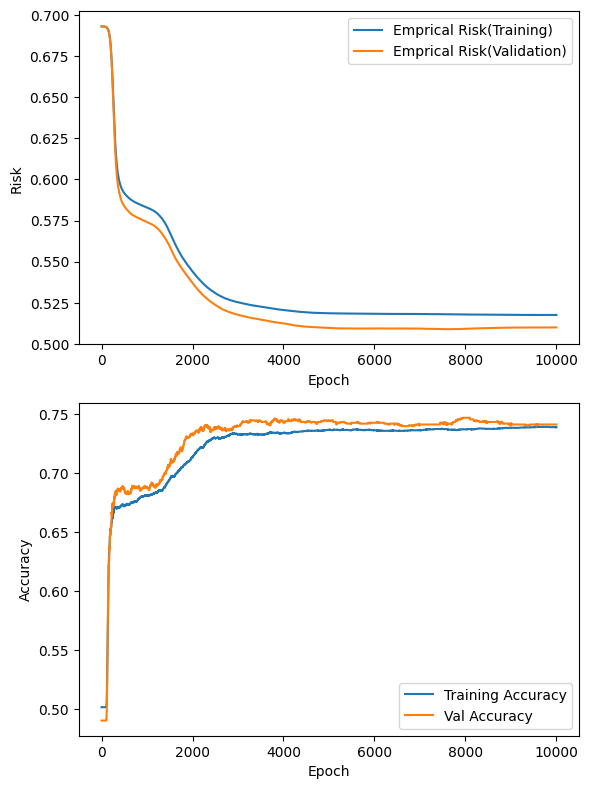

Classification Accuracy: 71.0000%
Precison: 0.71939477303989 Recall:0.7213793103448276 F1 Score: 0.7203856749311295


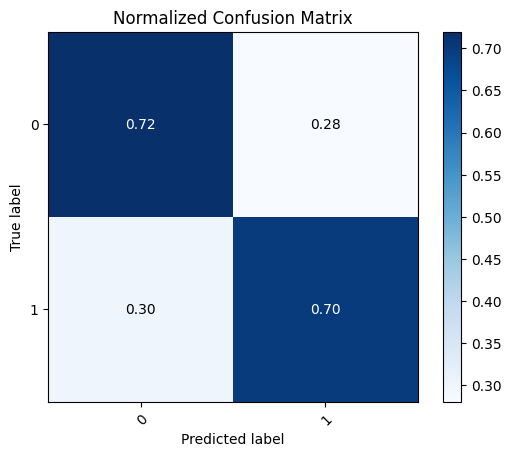

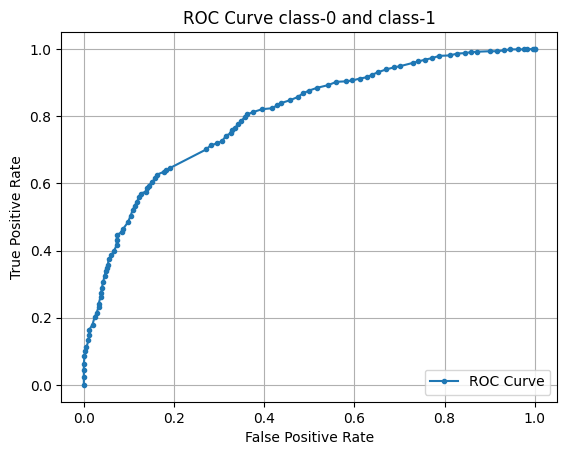

In [55]:
model_clsf_no_reg = Model_Bin_Classification(layer_dims)
clsf_trainer.train(model_clsf_no_reg, Bin_Clsf_Metrics, X_train, y_train, X_val, y_val)
bin_clsf_tester.test(model_clsf_no_reg, X_test, y_test)

### Testing L2-regularised performance


Train Cost after iteration 0: 0.6931768433581534 | Val Cost after iteration 0: 0.6930391409570984
Train Acc. after iteration 0: 0.4986607142857143 | Val Acc. after iteration 0: 0.51

Train Cost after iteration 500: 0.593517406130081 | Val Cost after iteration 500: 0.5868607792727497
Train Acc. after iteration 500: 0.6711607142857143 | Val Acc. after iteration 500: 0.6814285714285714

Train Cost after iteration 1000: 0.5787985045587185 | Val Cost after iteration 1000: 0.571365987305036
Train Acc. after iteration 1000: 0.6827678571428571 | Val Acc. after iteration 1000: 0.6864285714285714

Train Cost after iteration 1500: 0.5536263480516835 | Val Cost after iteration 1500: 0.5459009152844166
Train Acc. after iteration 1500: 0.70375 | Val Acc. after iteration 1500: 0.7214285714285714

Train Cost after iteration 2000: 0.5425777356813631 | Val Cost after iteration 2000: 0.5363455174966006
Train Acc. after iteration 2000: 0.71625 | Val Acc. after iteration 2000: 0.7285714285714285

Train Cos

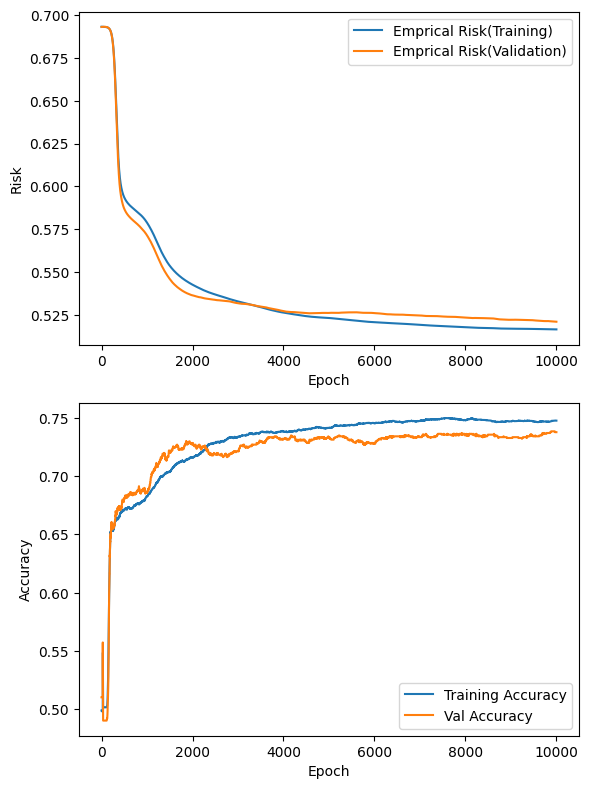

Classification Accuracy: 73.7143%
Precison: 0.7700453857791225 Recall:0.7020689655172414 F1 Score: 0.7344877344877345


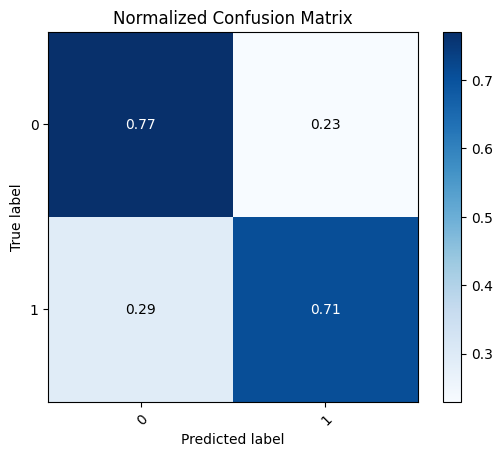

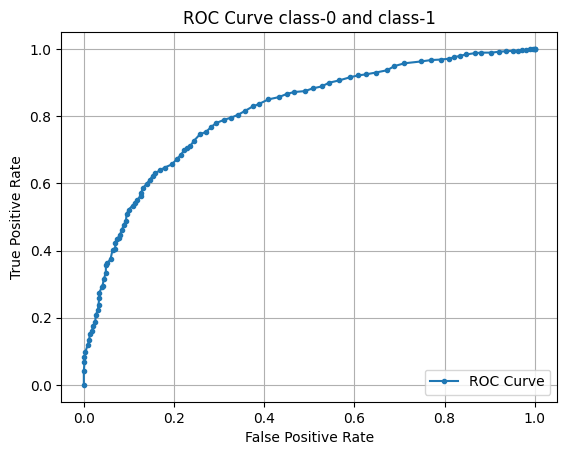

In [56]:
model_clsf_L2_reg = Model_Bin_Classification(layer_dims, lambd)
clsf_trainer.train(model_clsf_L2_reg, Bin_Clsf_Metrics,
                   X_train, y_train, X_val, y_val)
bin_clsf_tester.test(model_clsf_L2_reg, X_test, y_test)

### Testing L1-regularised performance


Train Cost after iteration 0: 0.6931719968665356 | Val Cost after iteration 0: 0.6932119165181749
Train Acc. after iteration 0: 0.5013392857142858 | Val Acc. after iteration 0: 0.49

Train Cost after iteration 500: 0.6114347518534701 | Val Cost after iteration 500: 0.6038462401965353
Train Acc. after iteration 500: 0.6701785714285714 | Val Acc. after iteration 500: 0.6785714285714286

Train Cost after iteration 1000: 0.5912070917526173 | Val Cost after iteration 1000: 0.5820551874568112
Train Acc. after iteration 1000: 0.6740178571428571 | Val Acc. after iteration 1000: 0.6821428571428572

Train Cost after iteration 1500: 0.580488612025693 | Val Cost after iteration 1500: 0.5726678904552323
Train Acc. after iteration 1500: 0.6872321428571428 | Val Acc. after iteration 1500: 0.6942857142857143

Train Cost after iteration 2000: 0.5768987158353073 | Val Cost after iteration 2000: 0.5695302077658149
Train Acc. after iteration 2000: 0.6924107142857143 | Val Acc. after iteration 2000: 0.6978

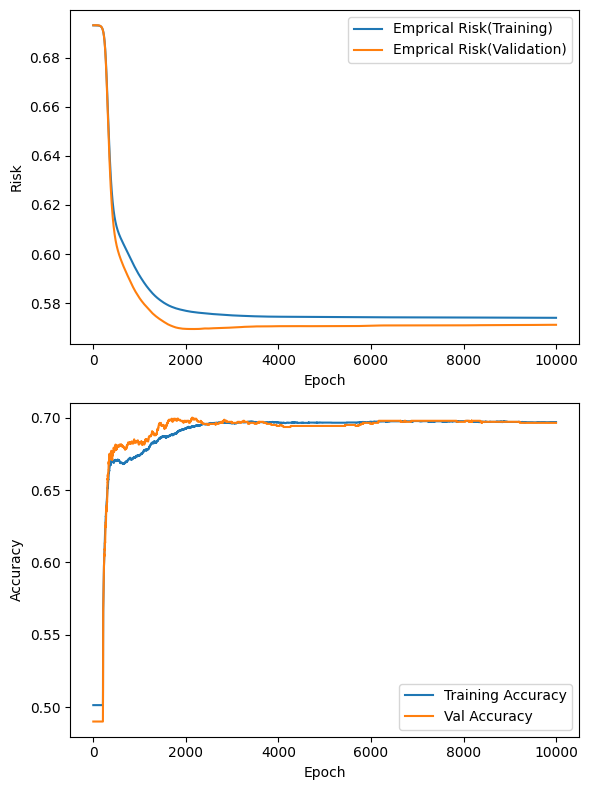

Classification Accuracy: 69.6429%
Precison: 0.7225519287833828 Recall:0.6717241379310345 F1 Score: 0.6962115796997856


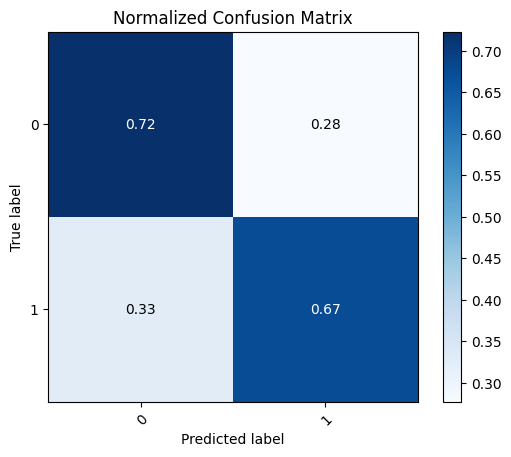

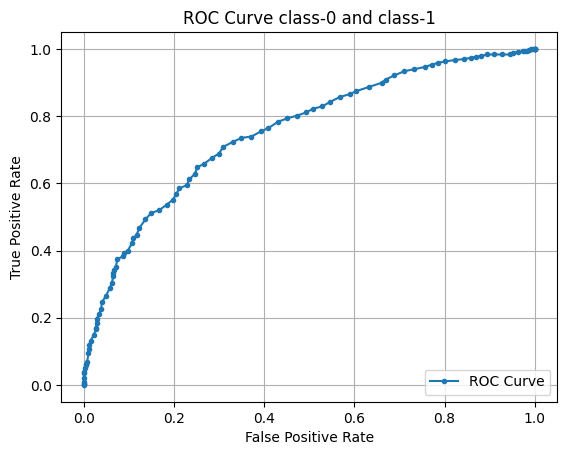

In [57]:
model_clsf_L1_reg = Model_Bin_Classification(layer_dims, lambd, 1)
clsf_trainer.train(model_clsf_L1_reg, Bin_Clsf_Metrics,
                   X_train, y_train, X_val, y_val)
bin_clsf_tester.test(model_clsf_L1_reg, X_test, y_test)

### Testing performance with dropout


Train Cost after iteration 0: 0.693138380516744 | Val Cost after iteration 0: 0.6931622008381232
Train Acc. after iteration 0: 0.5013392857142858 | Val Acc. after iteration 0: 0.49

Train Cost after iteration 500: 0.5909075782281917 | Val Cost after iteration 500: 0.5828236335634756
Train Acc. after iteration 500: 0.6717857142857143 | Val Acc. after iteration 500: 0.6842857142857143

Train Cost after iteration 1000: 0.5727237969199321 | Val Cost after iteration 1000: 0.5633975629839142
Train Acc. after iteration 1000: 0.689375 | Val Acc. after iteration 1000: 0.6992857142857143

Train Cost after iteration 1500: 0.5491004419814647 | Val Cost after iteration 1500: 0.5420470232907064
Train Acc. after iteration 1500: 0.7114285714285714 | Val Acc. after iteration 1500: 0.7207142857142858

Train Cost after iteration 2000: 0.5396184182867105 | Val Cost after iteration 2000: 0.5338740808029326
Train Acc. after iteration 2000: 0.7203571428571428 | Val Acc. after iteration 2000: 0.73285714285714

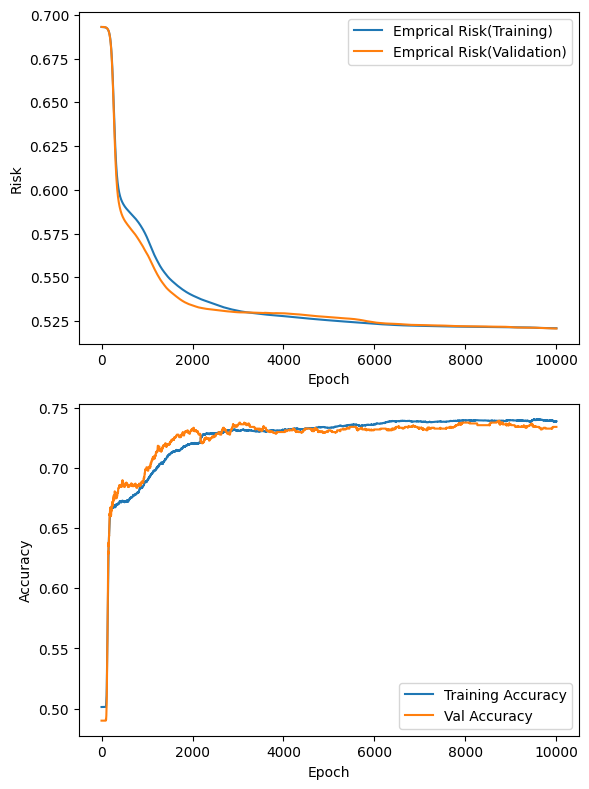

Classification Accuracy: 73.2143%
Precison: 0.7565982404692082 Recall:0.7117241379310345 F1 Score: 0.7334754797441364


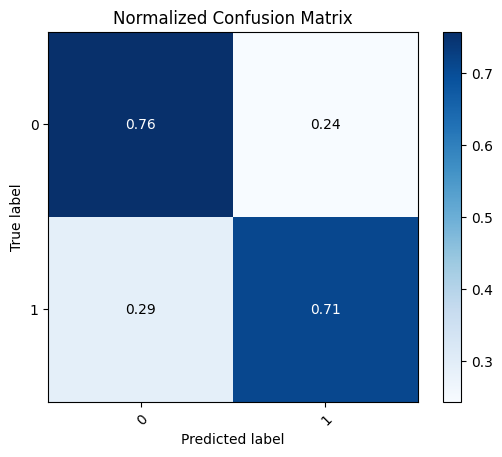

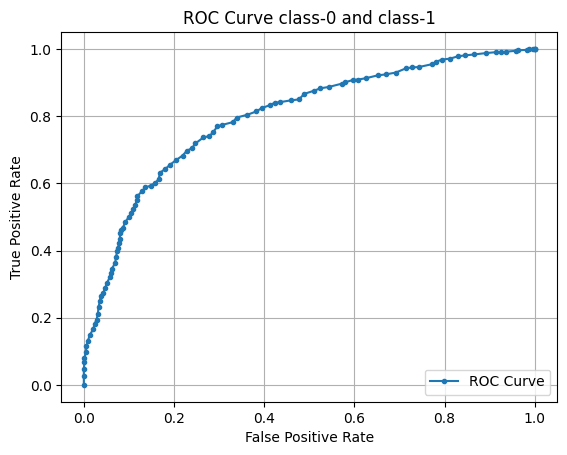

In [58]:
model_clsf_dropout = Model_Bin_Classification(
    layer_dims, drop_prob=drop_prob)
clsf_trainer.train(model_clsf_dropout, Bin_Clsf_Metrics,
                   X_train, y_train, X_val, y_val)
bin_clsf_tester.test(model_clsf_dropout, X_test, y_test)

### tanh(x) act

### Testing non-regularised performance


Train Cost after iteration 0: 0.23865299817048086 | Val Cost after iteration 0: 0.22883737516185987
Train Acc. after iteration 0: 0.5013392857142858 | Val Acc. after iteration 0: 0.49



Train Cost after iteration 500: 0.10717958476114016 | Val Cost after iteration 500: 0.10615788055013747
Train Acc. after iteration 500: 0.6673214285714286 | Val Acc. after iteration 500: 0.6685714285714286

Train Cost after iteration 1000: 0.09964526969158745 | Val Cost after iteration 1000: 0.0984648982217812
Train Acc. after iteration 1000: 0.68375 | Val Acc. after iteration 1000: 0.705

Train Cost after iteration 1500: 0.09426645023063807 | Val Cost after iteration 1500: 0.0930443835713312
Train Acc. after iteration 1500: 0.7072321428571429 | Val Acc. after iteration 1500: 0.7214285714285714

Train Cost after iteration 2000: 0.09235692311547368 | Val Cost after iteration 2000: 0.09145542598671491
Train Acc. after iteration 2000: 0.7203571428571428 | Val Acc. after iteration 2000: 0.7221428571428572

Train Cost after iteration 2500: 0.09095485929116627 | Val Cost after iteration 2500: 0.09046762475080905
Train Acc. after iteration 2500: 0.7271428571428571 | Val Acc. after iteration 2

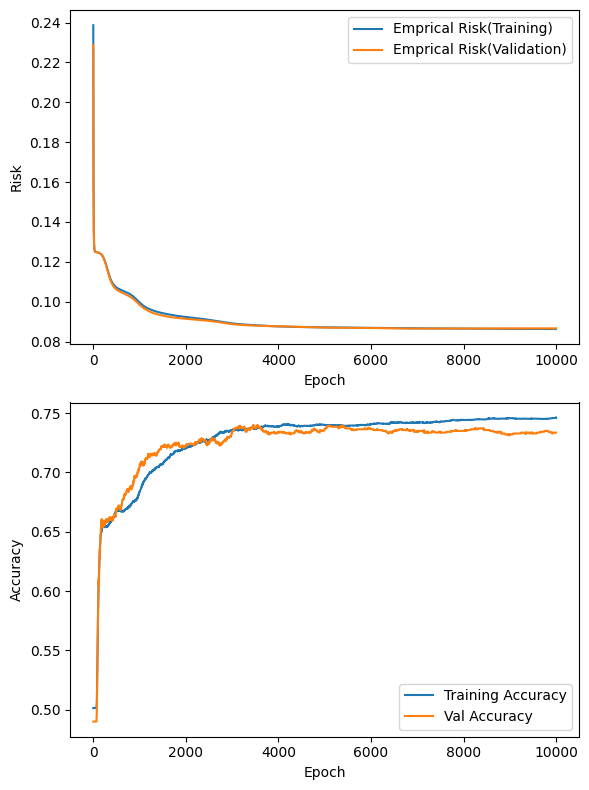

Classification Accuracy: 74.0714%
Precison: 0.7661764705882353 Recall:0.7186206896551725 F1 Score: 0.7416370106761566


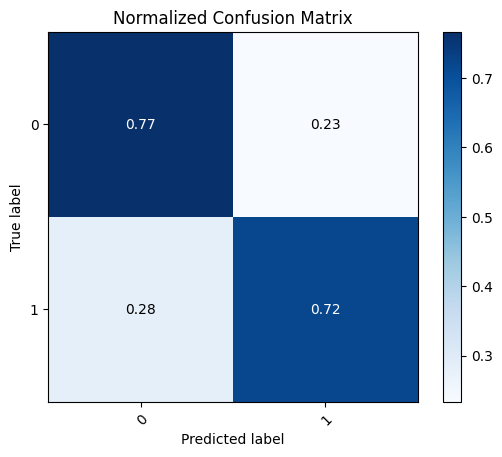

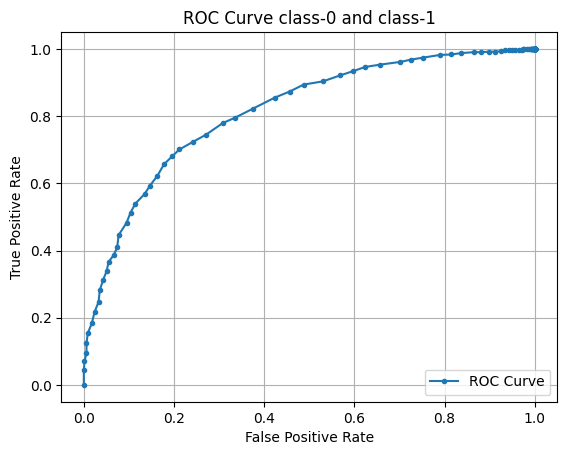

In [23]:
model_clsf_no_reg = Model_Bin_Classification(layer_dims, act="tanh")
clsf_trainer.train(model_clsf_no_reg, Bin_Clsf_Metrics,
                   X_train, y_train, X_val, y_val)
bin_clsf_tester.test(model_clsf_no_reg, X_test, y_test)

### Testing L2-regularised performance


Train Cost after iteration 0: 0.23398688994181527 | Val Cost after iteration 0: 0.2247353920949956
Train Acc. after iteration 0: 0.5013392857142858 | Val Acc. after iteration 0: 0.49

Train Cost after iteration 500: 0.11787513386310115 | Val Cost after iteration 500: 0.1174931158666572
Train Acc. after iteration 500: 0.65125 | Val Acc. after iteration 500: 0.6514285714285715

Train Cost after iteration 1000: 0.10363300982175837 | Val Cost after iteration 1000: 0.10256495023107845
Train Acc. after iteration 1000: 0.6733035714285714 | Val Acc. after iteration 1000: 0.6828571428571428

Train Cost after iteration 1500: 0.09746098588457167 | Val Cost after iteration 1500: 0.09743439773954034
Train Acc. after iteration 1500: 0.7020535714285714 | Val Acc. after iteration 1500: 0.7064285714285714

Train Cost after iteration 2000: 0.09505189298189742 | Val Cost after iteration 2000: 0.09454890163989906
Train Acc. after iteration 2000: 0.7105357142857143 | Val Acc. after iteration 2000: 0.723571

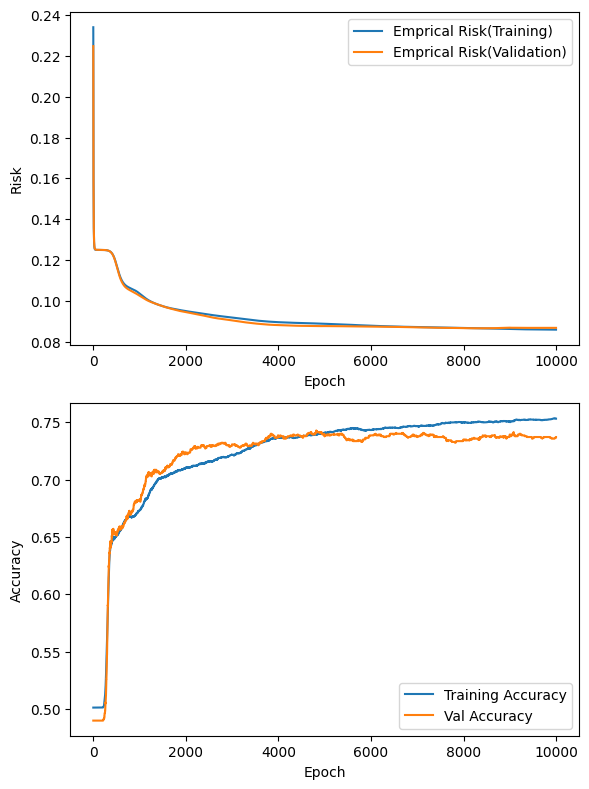

Classification Accuracy: 75.0000%
Precison: 0.764456981664316 Recall:0.7475862068965518 F1 Score: 0.7559274755927475


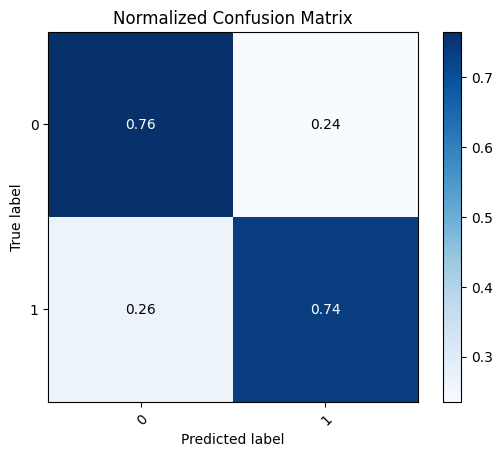

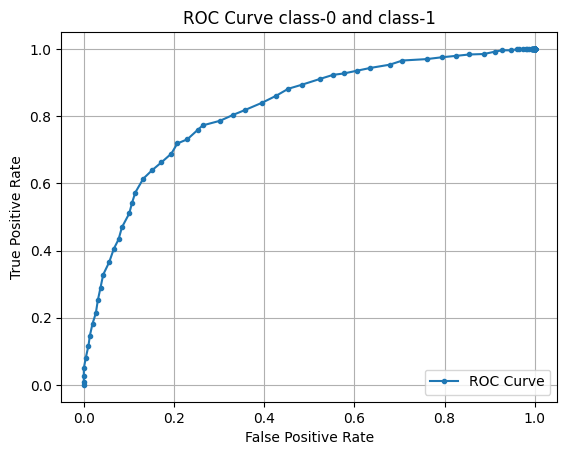

In [60]:
model_clsf_L2_reg = Model_Bin_Classification(layer_dims, lambd, act="tanh")
clsf_trainer.train(model_clsf_L2_reg, Bin_Clsf_Metrics,
                   X_train, y_train, X_val, y_val)
bin_clsf_tester.test(model_clsf_L2_reg, X_test, y_test)

### Testing L1-regularised performance


Train Cost after iteration 0: 0.52083229603315 | Val Cost after iteration 0: 0.5206863641333497
Train Acc. after iteration 0: 0.7386607142857143 | Val Acc. after iteration 0: 0.7342857142857143

Train Cost after iteration 500: 0.5206939318152326 | Val Cost after iteration 500: 0.5204351827869709
Train Acc. after iteration 500: 0.7402678571428571 | Val Acc. after iteration 500: 0.7328571428571429

Train Cost after iteration 1000: 0.5202462476432267 | Val Cost after iteration 1000: 0.5200739512453544
Train Acc. after iteration 1000: 0.7409821428571428 | Val Acc. after iteration 1000: 0.7314285714285714

Train Cost after iteration 1500: 0.5200153348002594 | Val Cost after iteration 1500: 0.519733538930644
Train Acc. after iteration 1500: 0.7414285714285714 | Val Acc. after iteration 1500: 0.7278571428571429

Train Cost after iteration 2000: 0.5198990581078295 | Val Cost after iteration 2000: 0.5202032442798129
Train Acc. after iteration 2000: 0.7421428571428571 | Val Acc. after iteration 

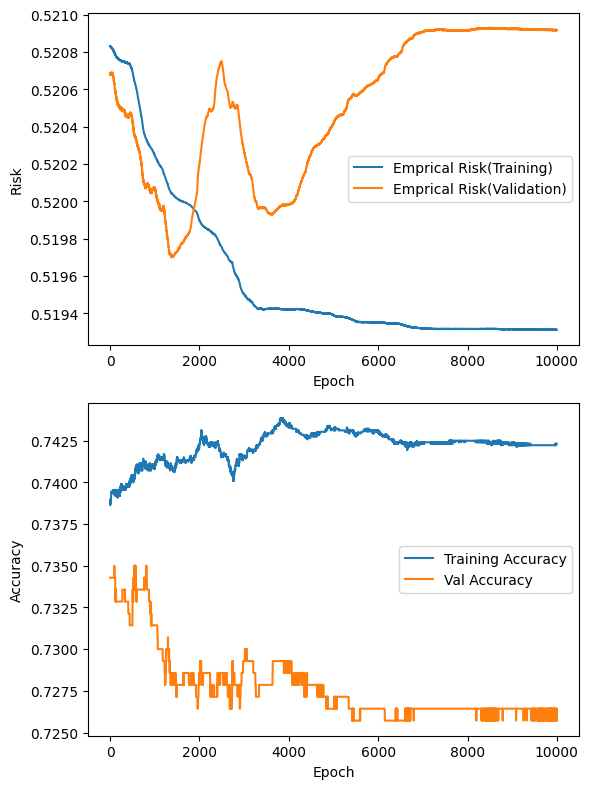

Classification Accuracy: 73.7143%
Precison: 0.7613469985358712 Recall:0.7172413793103448 F1 Score: 0.7386363636363636


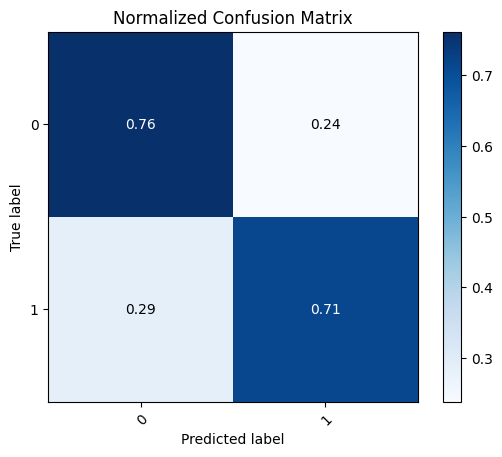

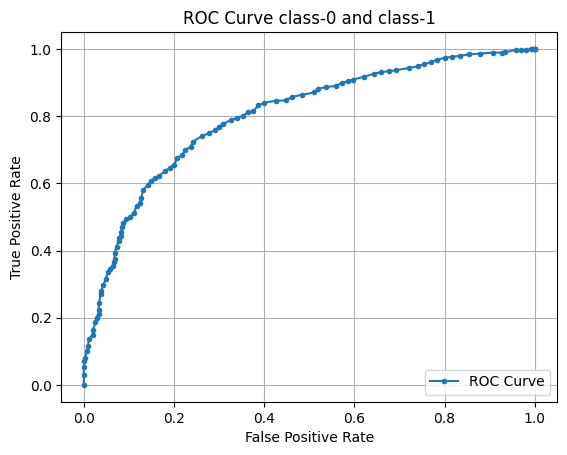

In [61]:
model_clsf_L1_reg = Model_Bin_Classification(
    layer_dims, lambd, 1, act="tanh")
clsf_trainer.train(model_clsf_dropout, Bin_Clsf_Metrics,
                   X_train, y_train, X_val, y_val)
bin_clsf_tester.test(model_clsf_dropout, X_test, y_test)

### Testing performance with dropout


Train Cost after iteration 0: 0.23419391015573898 | Val Cost after iteration 0: 0.22491326033233552
Train Acc. after iteration 0: 0.5013392857142858 | Val Acc. after iteration 0: 0.49

Train Cost after iteration 500: 0.10348658920338137 | Val Cost after iteration 500: 0.10201097238454145
Train Acc. after iteration 500: 0.6707142857142857 | Val Acc. after iteration 500: 0.6878571428571428

Train Cost after iteration 1000: 0.10070783544646143 | Val Cost after iteration 1000: 0.09910078396181826
Train Acc. after iteration 1000: 0.6772321428571428 | Val Acc. after iteration 1000: 0.685

Train Cost after iteration 1500: 0.09982788035603997 | Val Cost after iteration 1500: 0.09810026422724885
Train Acc. after iteration 1500: 0.6825 | Val Acc. after iteration 1500: 0.6921428571428572

Train Cost after iteration 2000: 0.0992986840298418 | Val Cost after iteration 2000: 0.09759563222290303
Train Acc. after iteration 2000: 0.6869642857142857 | Val Acc. after iteration 2000: 0.6978571428571428

T

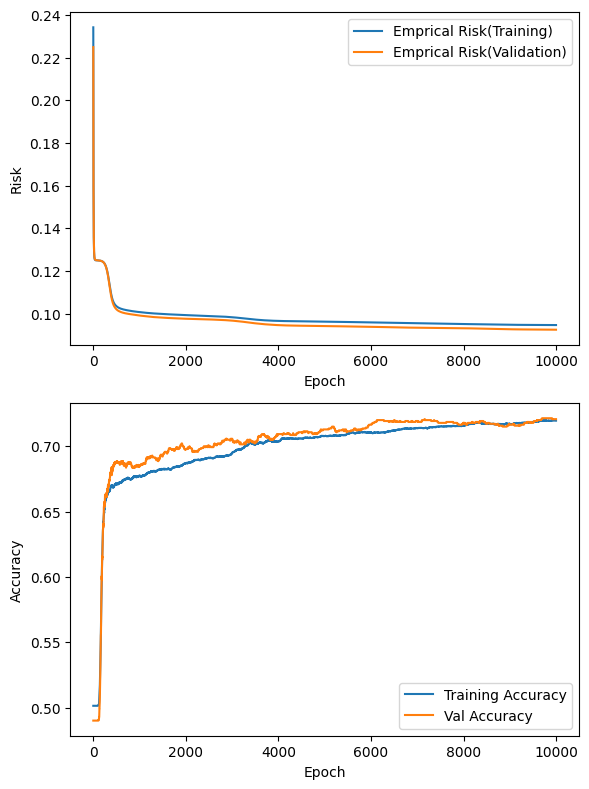

Classification Accuracy: 69.3571%
Precison: 0.7 Recall:0.7144827586206897 F1 Score: 0.7071672354948806


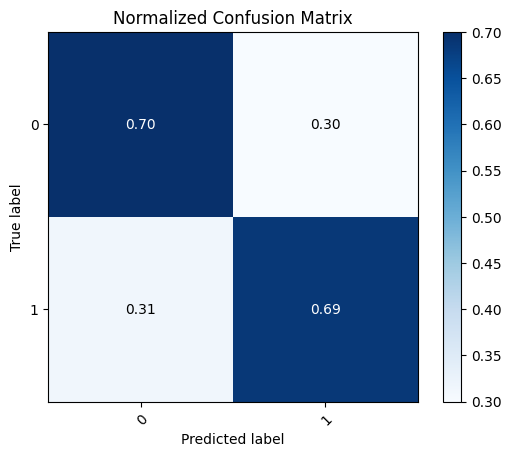

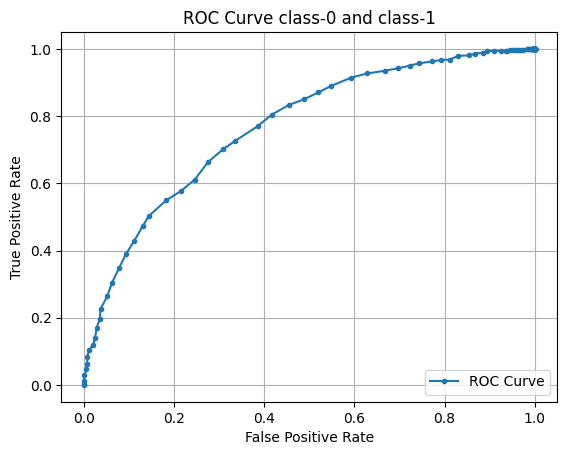

In [62]:

model_clsf_dropout = Model_Bin_Classification(
    layer_dims, drop_prob=drop_prob, act="tanh")
clsf_trainer.train(model_clsf_dropout, Bin_Clsf_Metrics,
                   X_train, y_train, X_val, y_val)
bin_clsf_tester.test(model_clsf_dropout, X_test, y_test)

## Q3 i b



In [24]:

# Load the dataset
data_path = './datasets/multi_class_classification_data_group_12_train.txt'

# Adjusting the data loading process to skip the header row
data = np.loadtxt(data_path, skiprows=1)
np.random.seed(42)  # For reproducibility
np.random.shuffle(data)   # Randomly shuffle the data

# Separate features and targets again
X = data[:, :25]  # Features (sensor readings)
y = data[:, 25:]  # Targets (y position)

y = np.eye(10)[y.astype(int).reshape(-1)]

split_idx1 = int(X.shape[0] * 0.8)
split_idx2 = split_idx1 + int((X.shape[0] - split_idx1) * 0.5)

X_train = X[:split_idx1].T
X_val = X[split_idx1:split_idx2].T
X_test = X[split_idx2:].T
y_train = y[:split_idx1].T
y_val = y[split_idx1:split_idx2].T
y_test = y[split_idx2:].T

In [25]:
def softmax(Z):
    # Shift values for numerical stability
    expZ = np.exp(Z - np.max(Z, axis=0, keepdims=True))
    # expZ = np.exp(Z)
    return expZ / np.sum(expZ, axis=0, keepdims=True)

In [26]:
from itertools import combinations

In [27]:
class Multi_Clsf_Metrics(Bin_Clsf_Metrics):
    def __init__(self, y, y_pred, class_names=[]) -> None:
        self.prediction_probs = y_pred
        # Convert probabilities to 0/1 predictions
        self.predictions = np.argmax(y_pred, axis=0)
        self.labels = np.argmax(y, axis=0)
        self.num_classes = y.shape[0]
        # self.class_names = class_names
    
    def compute_confusion_matrix(self):
        cm = np.zeros((self.num_classes, self.num_classes), int)
        for i in range(len(self.predictions)):
            cm[self.labels[i], self.predictions[i]] += 1
        return cm

    def display_cm(self, conf_matrix):
        conf_matrix_normalized = conf_matrix.astype(
            'float') / conf_matrix.sum(axis=1)[:, np.newaxis]
        # Plotting with normalized values
        fig, ax = plt.subplots()
        im = ax.imshow(conf_matrix_normalized,
                       interpolation='nearest', cmap=plt.cm.Blues)
        ax.figure.colorbar(im, ax=ax)
        # if self.class_names is []:
        #     lbs = range(self.num_classes)
        # else:
        #     lbs = self.class_names
        ax.set(xticks=np.arange(conf_matrix_normalized.shape[1]),
               yticks=np.arange(conf_matrix_normalized.shape[0]),
               xticklabels=range(self.num_classes),
               yticklabels=range(self.num_classes),
               title='Normalized Confusion Matrix',
               ylabel='True label',
               xlabel='Predicted label')

        plt.setp(ax.get_xticklabels(), rotation=45,
                 ha="right", rotation_mode="anchor")

        # Loop over data dimensions and create text annotations.
        thresh = conf_matrix_normalized.max() / 2.
        for i in range(conf_matrix_normalized.shape[0]):
            for j in range(conf_matrix_normalized.shape[1]):
                ax.text(j, i, format(conf_matrix_normalized[i, j], '.2f'),
                        ha="center", va="center",
                        color="white" if conf_matrix_normalized[i, j] > thresh else "black")
        plt.show()

    def compute_f1_score(self, cm):
        for i in range(self.num_classes):
            TP = cm[i, i]
            FP = np.sum(cm[:, i]) - TP
            FN = np.sum(cm[i, :]) - TP
            precision = TP / (TP + FP)
            recall = TP / (TP + FN)
            f1_score = 2 * precision * recall / (precision + recall)
            print(
                f"Class {i} Precision: {precision:.4f} Recall: {recall:.4f} F1 score: {f1_score:.4f}")

    def compute_roc_curve_multi_1v1(self):
        pairs = list(combinations(range(10), 2))
        class1, class2 = pairs[int(np.random.random() * len(pairs))]
        binary_labels = (self.labels == class1) | (self.labels == class2)
        binary_prediction_probs = self.prediction_probs[[
            class1, class2], :][:, binary_labels]

        binary_true_labels = (
            self.labels[binary_labels] == class1).astype(int)

        # Assuming class1 is treated as "positive"
        super().__init__(binary_true_labels, binary_prediction_probs[0, :])
        super().compute_roc_curve_bin(
            'sigmoid', f"class-{class1}", f"class-{class2}")

In [28]:
class Model_Multi_Classification(Model_Bin_Classification):
    def __init__(self, layer_dims, lambd=0.0, reg_type=2, act="softmax", drop_prob=0.0) -> None:
        super().__init__(layer_dims, lambd, reg_type, act, drop_prob)

    def compute_cost(self, AL, Y, epsilon=1e-15):
        m = Y.shape[1]
        # Clip predictions to avoid log(0)
        AL = np.clip(AL, epsilon, 1 - epsilon)
        cost = - (1/m) * np.sum(Y * np.log(AL))
        cost = np.squeeze(cost)

        if self.lambd != 0.0:
            # Number of layers in the neural network
            L = len(self.parameters) // 2
            regularization_cost = 0

            for l in range(1, L+1):
                regularization_cost += np.sum(np.square(self.parameters['W' + str(
                    l)])) if self.reg_type == 2 else np.sum(np.abs(self.parameters['W' + str(l)]))

            regularization_cost *= (self.lambd / (2 * m))
            cost += regularization_cost

        return cost

    def linear_activation_forward(self, A_prev, W, b, activation):
        if activation == "relu":
            Z, linear_cache = self.linear_forward(A_prev, W, b)
            A = np.maximum(0, Z)

        elif activation == "linear":
            Z, linear_cache = self.linear_forward(A_prev, W, b)
            A = Z

        elif activation == "sigmoid":
            Z, linear_cache = self.linear_forward(A_prev, W, b)
            A = sigmoid(Z)

        elif activation == "tanh":
            Z, linear_cache = self.linear_forward(A_prev, W, b)
            A = np.tanh(Z)

        # elif activation == "softmax":
        else:
            Z, linear_cache = self.linear_forward(A_prev, W, b)
            A = softmax(Z)

        cache = (linear_cache, Z)

        # Implementing dropout
        if self.train:
            keep_prob = 1.0 - self.drop_prob
            D = np.random.rand(A.shape[0], A.shape[1]) < keep_prob
            A = np.multiply(A, D)
            A /= keep_prob
            cache = (cache[0], cache[1], D)
            
        return A, cache

    def linear_activation_backward(self, dA, cache, activation):
        if self.train:
            linear_cache, activation_cache, D = cache
            keep_prob = 1.0 - self.drop_prob
            dA = np.multiply(dA, D)
            # Scale the gradients with respect to the neurons that haven't been dropped
            dA /= keep_prob
        
        else:
            linear_cache, activation_cache = cache

        if activation == "relu":
            dZ = np.array(dA, copy=True)
            dZ[activation_cache <= 0] = 0
            dA_prev, dW, db = self.linear_backward(dZ, linear_cache)

        elif activation == "linear":
            dZ = dA
            dA_prev, dW, db = self.linear_backward(dZ, linear_cache)

        elif activation == "sigmoid":
            A = sigmoid(activation_cache)  # Z = activation_cache
            dZ = dA * A * (1-A)
            dA_prev, dW, db = self.linear_backward(dZ, linear_cache)

        elif activation == "tanh":
            A = np.tanh(activation_cache)  # Z = activation_cache
            dZ = dA * (1 - np.square(A))
            dA_prev, dW, db = self.linear_backward(dZ, linear_cache)

        # elif activation == "softmax":
        #     A = softmax(activation_cache)  # Z = activation_cache
        #     dZ = dA * A * (1-A)
        #     dA_prev, dW, db = self.linear_backward(dZ, linear_cache)

        return dA_prev, dW, db

    def L_model_backward(self, AL, Y):
        self.grads = {}
        m = AL.shape[1]  # number of examples
        L = len(self.caches)
        Y = Y.reshape(AL.shape)  # after this line, Y is the same shape as AL

        # Initializing the backpropagation
        current_cache = self.caches[L-1]
        # Lth layer (linear -> softmax) gradients. Inputs: "dAL, current_cache". Outputs: "grads["dAL"], grads["dWl"], grads["dbl"]"
        self.grads["dA" + str(L)], self.grads["dW" + str(L)], self.grads["db" + str(
                L)] = self.linear_backward(AL - Y, current_cache[0])


    # Loop from l=L-2 to l=0
        for l in reversed(range(L-1)):
            # lth layer: (RELU -> LINEAR) gradients.
            current_cache = self.caches[l]
            dA_prev_temp, dW_temp, db_temp = self.linear_activation_backward(
                self.grads["dA" + str(l+2)], current_cache, "relu")

            # Adding L2/L1 regularization term to dW for each layer caches[l][0][1] retrieves W^{[l+1]}
            dW_temp += (self.lambd / m) * \
                (self.caches[l][0][1] if self.reg_type ==
                 2 else np.sign(self.caches[l][0][1]))

            self.grads["dA" + str(l+1)] = dA_prev_temp
            self.grads["dW" + str(l+1)] = dW_temp
            self.grads["db" + str(l+1)] = db_temp

In [29]:
class Evaluate_multi_clsf(Evaluate_bin_clsf):
    def __init__(self) -> None:
        super().__init__()

    def test(self, multi_clsf_model: Model_Multi_Classification, X, y, drop=False, class_names=[]):
        if drop:
            multi_clsf_model.train = False
        # Forward propagation
        AL = multi_clsf_model.L_model_forward(X)

        # Convert probabilities to 0/1 predictions
        multi_metrics = Multi_Clsf_Metrics(y, AL)

        print(
            f"Classification Accuracy: {multi_metrics.compute_accuracy() * 100:.4f}%")
        cm = multi_metrics.compute_confusion_matrix()
        multi_metrics.compute_f1_score(cm)
        multi_metrics.display_cm(cm)
        multi_metrics.compute_roc_curve_multi_1v1()

In [30]:
# Define the MLP architecture
layer_dims = [25, 20, 15, 10]  # 2-layer model

# Training hyperparameters
learning_rate = 0.05
num_iterations = 4000

lambd = 0.1  # Regularization parameter

drop_prob = 0.25  # Dropout Probability

clsf_trainer = Trainer_clsf(num_iterations, learning_rate, 5000)
multi_clsf_tester = Evaluate_multi_clsf()

## Softmax act

### Testing non-regularised performance


Train Cost after iteration 0: 2.3026967353896883 | Val Cost after iteration 0: 2.302590696047224
Train Acc. after iteration 0: 0.09910714285714285 | Val Acc. after iteration 0: 0.10585714285714286



Train Cost after iteration 200: 2.3025414204059342 | Val Cost after iteration 200: 2.3030049658926233
Train Acc. after iteration 200: 0.10166071428571428 | Val Acc. after iteration 200: 0.09542857142857143

Train Cost after iteration 400: 2.302475307716658 | Val Cost after iteration 400: 2.3029451620019206
Train Acc. after iteration 400: 0.10166071428571428 | Val Acc. after iteration 400: 0.09542857142857143

Train Cost after iteration 600: 2.300955749088806 | Val Cost after iteration 600: 2.30147500461695
Train Acc. after iteration 600: 0.12057142857142857 | Val Acc. after iteration 600: 0.11914285714285715

Train Cost after iteration 800: 2.1812154086169597 | Val Cost after iteration 800: 2.1806082336957253
Train Acc. after iteration 800: 0.19267857142857142 | Val Acc. after iteration 800: 0.19314285714285714

Train Cost after iteration 1000: 2.0702466618860234 | Val Cost after iteration 1000: 2.0774543598375876
Train Acc. after iteration 1000: 0.25391071428571427 | Val Acc. after it

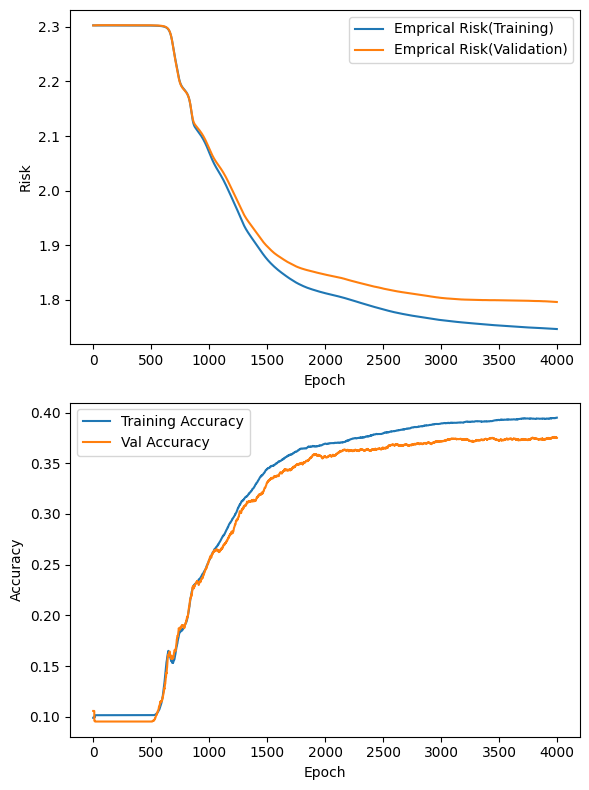

Classification Accuracy: 38.7286%
Class 0 Precision: 0.4145 Recall: 0.3481 F1 score: 0.3784
Class 1 Precision: 0.4093 Recall: 0.5207 F1 score: 0.4584
Class 2 Precision: 0.4461 Recall: 0.5269 F1 score: 0.4832
Class 3 Precision: 0.3888 Recall: 0.3551 F1 score: 0.3712
Class 4 Precision: 0.3380 Recall: 0.3089 F1 score: 0.3228
Class 5 Precision: 0.3817 Recall: 0.3624 F1 score: 0.3718
Class 6 Precision: 0.3162 Recall: 0.3211 F1 score: 0.3187
Class 7 Precision: 0.3664 Recall: 0.3653 F1 score: 0.3659
Class 8 Precision: 0.4173 Recall: 0.3804 F1 score: 0.3980
Class 9 Precision: 0.3853 Recall: 0.3870 F1 score: 0.3861


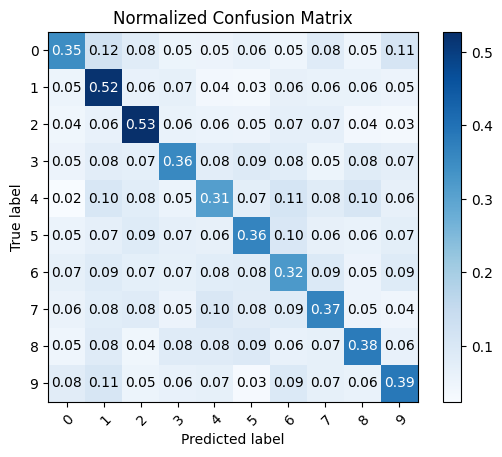

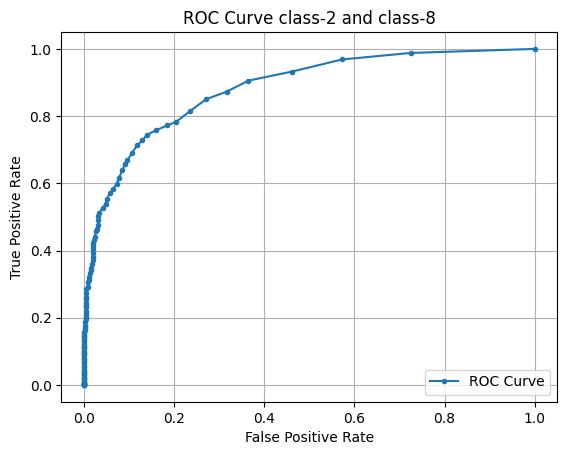

In [31]:
model_clsf_no_reg = Model_Multi_Classification(layer_dims)
clsf_trainer.train(model_clsf_no_reg, Multi_Clsf_Metrics,
                   X_train, y_train, X_val, y_val)
multi_clsf_tester.test(model_clsf_no_reg, X_test, y_test)

### Testing L2-regularised performance


Train Cost after iteration 0: 2.3024745249119194 | Val Cost after iteration 0: 2.3023519318809353
Train Acc. after iteration 0: 0.10580357142857143 | Val Acc. after iteration 0: 0.10057142857142858

Train Cost after iteration 500: 1.8765859076638902 | Val Cost after iteration 500: 1.9006892470107681
Train Acc. after iteration 500: 0.34501785714285715 | Val Acc. after iteration 500: 0.33271428571428574

Train Cost after iteration 1000: 1.8686295132617161 | Val Cost after iteration 1000: 1.889972094268839
Train Acc. after iteration 1000: 0.3484107142857143 | Val Acc. after iteration 1000: 0.3352857142857143

Train Cost after iteration 1500: 1.8631460295699256 | Val Cost after iteration 1500: 1.881968902874676
Train Acc. after iteration 1500: 0.35066071428571427 | Val Acc. after iteration 1500: 0.3375714285714286

Train Cost after iteration 2000: 1.859351510240911 | Val Cost after iteration 2000: 1.8782413872899564
Train Acc. after iteration 2000: 0.35175 | Val Acc. after iteration 2000: 

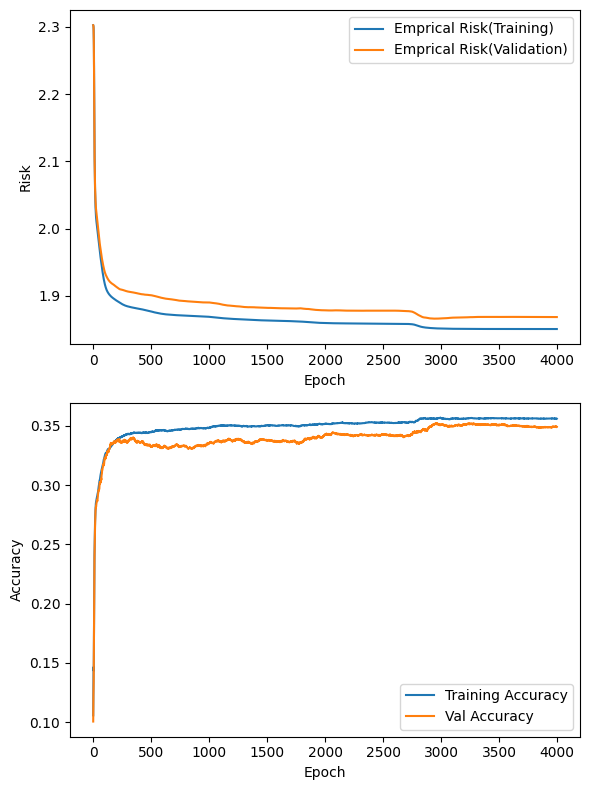

Classification Accuracy: 35.2714%
Class 0 Precision: 0.3691 Recall: 0.3007 F1 score: 0.3314
Class 1 Precision: 0.3937 Recall: 0.4834 F1 score: 0.4340
Class 2 Precision: 0.3597 Recall: 0.3817 F1 score: 0.3704
Class 3 Precision: 0.3657 Recall: 0.3267 F1 score: 0.3451
Class 4 Precision: 0.3015 Recall: 0.2849 F1 score: 0.2930
Class 5 Precision: 0.3275 Recall: 0.3174 F1 score: 0.3224
Class 6 Precision: 0.3255 Recall: 0.3127 F1 score: 0.3190
Class 7 Precision: 0.3419 Recall: 0.3424 F1 score: 0.3422
Class 8 Precision: 0.3955 Recall: 0.3873 F1 score: 0.3913
Class 9 Precision: 0.3385 Recall: 0.3870 F1 score: 0.3611


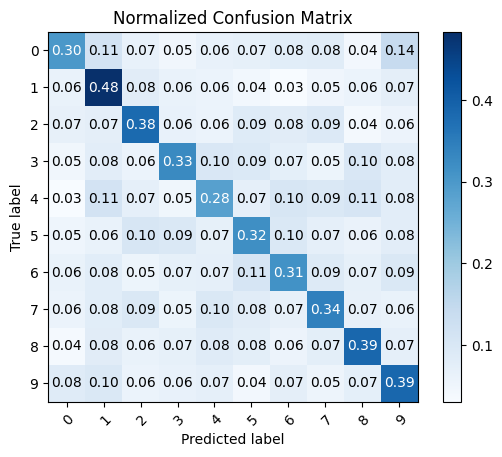

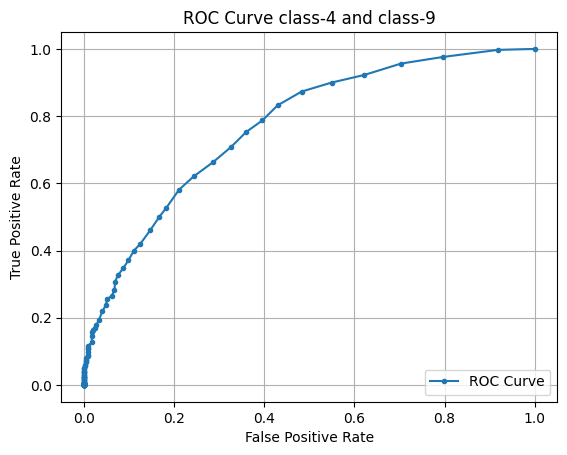

In [87]:
model_clsf_L2_reg = Model_Multi_Classification(layer_dims, lambd)
clsf_trainer.train(model_clsf_L2_reg, Multi_Clsf_Metrics,
                   X_train, y_train, X_val, y_val)
multi_clsf_tester.test(model_clsf_L2_reg, X_test, y_test)

### Testing L1-regularised performance


Train Cost after iteration 0: 2.3027916879950254 | Val Cost after iteration 0: 2.3025741153647847
Train Acc. after iteration 0: 0.099625 | Val Acc. after iteration 0: 0.09614285714285714

Train Cost after iteration 500: 1.8893129717445845 | Val Cost after iteration 500: 1.9049945023252248
Train Acc. after iteration 500: 0.3399107142857143 | Val Acc. after iteration 500: 0.33385714285714285

Train Cost after iteration 1000: 1.8877075123676876 | Val Cost after iteration 1000: 1.9009904131970938
Train Acc. after iteration 1000: 0.34075 | Val Acc. after iteration 1000: 0.3365714285714286

Train Cost after iteration 1500: 1.886456400509337 | Val Cost after iteration 1500: 1.9002350987765815
Train Acc. after iteration 1500: 0.3432142857142857 | Val Acc. after iteration 1500: 0.3412857142857143

Train Cost after iteration 2000: 1.8852084604050294 | Val Cost after iteration 2000: 1.8988081086191098
Train Acc. after iteration 2000: 0.34348214285714285 | Val Acc. after iteration 2000: 0.34357142

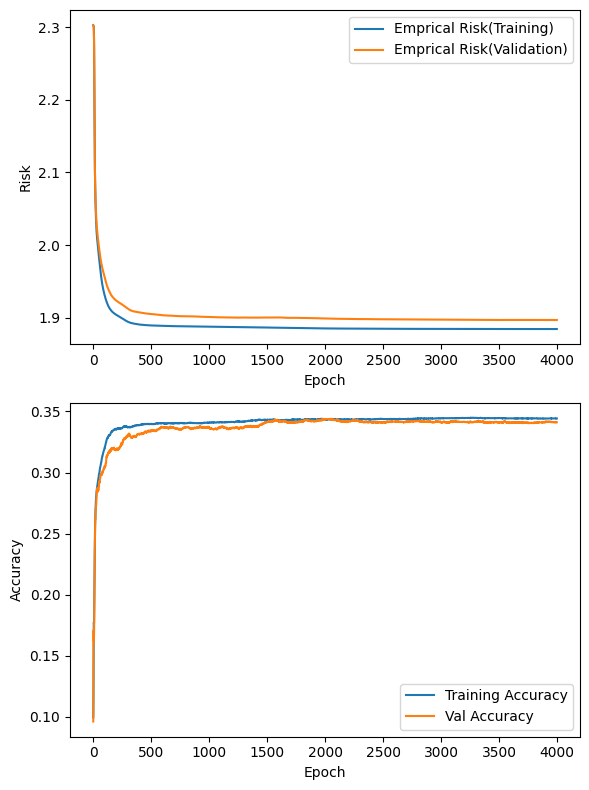

Classification Accuracy: 33.1429%
Class 0 Precision: 0.3327 Recall: 0.2444 F1 score: 0.2818
Class 1 Precision: 0.3505 Recall: 0.4793 F1 score: 0.4049
Class 2 Precision: 0.3912 Recall: 0.4281 F1 score: 0.4089
Class 3 Precision: 0.3237 Recall: 0.3168 F1 score: 0.3202
Class 4 Precision: 0.2542 Recall: 0.1721 F1 score: 0.2052
Class 5 Precision: 0.3069 Recall: 0.3202 F1 score: 0.3134
Class 6 Precision: 0.2905 Recall: 0.2930 F1 score: 0.2917
Class 7 Precision: 0.2918 Recall: 0.3252 F1 score: 0.3076
Class 8 Precision: 0.3953 Recall: 0.4205 F1 score: 0.4075
Class 9 Precision: 0.3454 Recall: 0.3102 F1 score: 0.3268


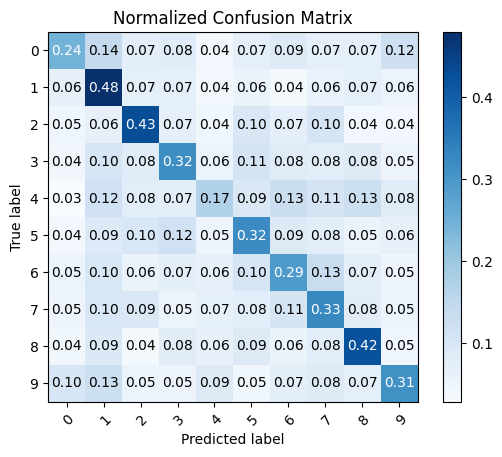

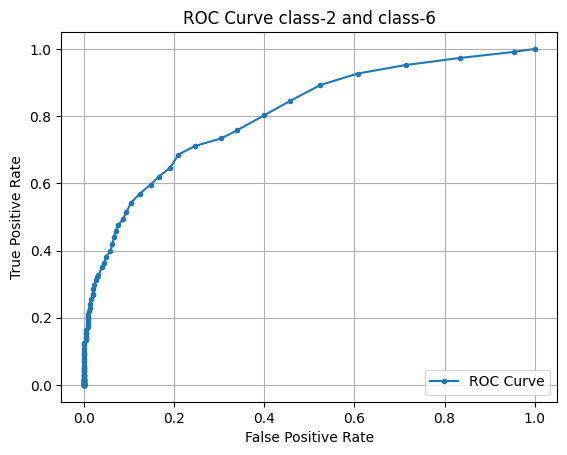

In [88]:
model_clsf_L1_reg = Model_Multi_Classification(layer_dims, lambd, 1)
clsf_trainer.train(model_clsf_L1_reg, Multi_Clsf_Metrics,
                   X_train, y_train, X_val, y_val)
multi_clsf_tester.test(model_clsf_L1_reg, X_test, y_test)

### Testing performance with dropout


Train Cost after iteration 0: 2.302480629040516 | Val Cost after iteration 0: 2.3025261010324334
Train Acc. after iteration 0: 0.10455357142857143 | Val Acc. after iteration 0: 0.11028571428571429

Train Cost after iteration 500: 1.8575367189246952 | Val Cost after iteration 500: 1.869704410489653
Train Acc. after iteration 500: 0.3513928571428571 | Val Acc. after iteration 500: 0.347

Train Cost after iteration 1000: 1.8513714764368645 | Val Cost after iteration 1000: 1.866136315902051
Train Acc. after iteration 1000: 0.3557142857142857 | Val Acc. after iteration 1000: 0.3414285714285714

Train Cost after iteration 1500: 1.8504082268055282 | Val Cost after iteration 1500: 1.8665712104029382
Train Acc. after iteration 1500: 0.35510714285714284 | Val Acc. after iteration 1500: 0.341

Train Cost after iteration 2000: 1.850030563189029 | Val Cost after iteration 2000: 1.8669112217527135
Train Acc. after iteration 2000: 0.35623214285714283 | Val Acc. after iteration 2000: 0.342285714285714

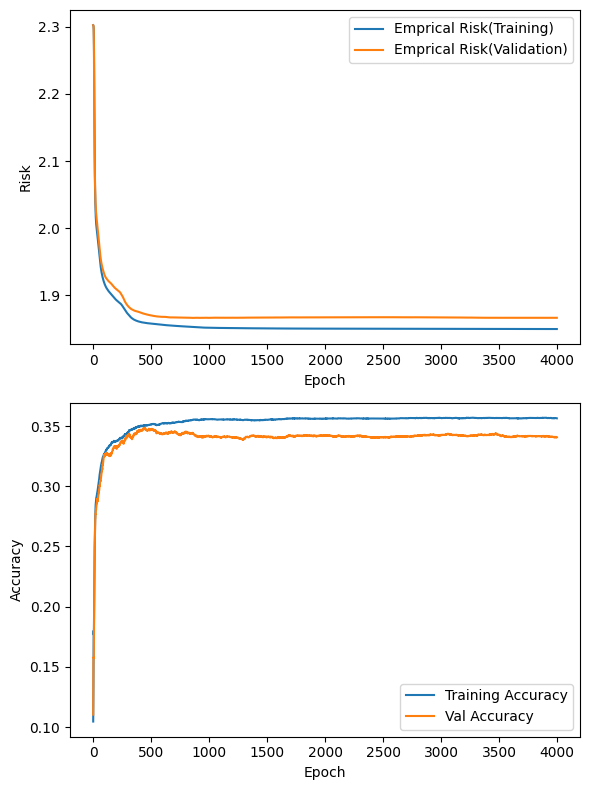

Classification Accuracy: 34.2429%
Class 0 Precision: 0.3578 Recall: 0.2815 F1 score: 0.3151
Class 1 Precision: 0.3954 Recall: 0.4986 F1 score: 0.4411
Class 2 Precision: 0.4016 Recall: 0.5135 F1 score: 0.4507
Class 3 Precision: 0.3527 Recall: 0.3281 F1 score: 0.3400
Class 4 Precision: 0.3109 Recall: 0.2539 F1 score: 0.2795
Class 5 Precision: 0.2735 Recall: 0.2570 F1 score: 0.2650
Class 6 Precision: 0.3216 Recall: 0.3099 F1 score: 0.3156
Class 7 Precision: 0.3031 Recall: 0.2679 F1 score: 0.2844
Class 8 Precision: 0.3427 Recall: 0.3527 F1 score: 0.3476
Class 9 Precision: 0.3276 Recall: 0.3648 F1 score: 0.3452


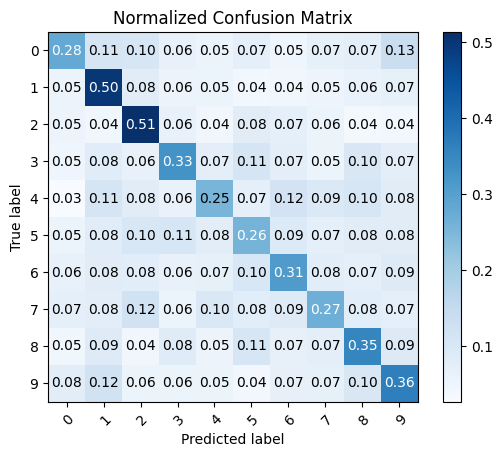

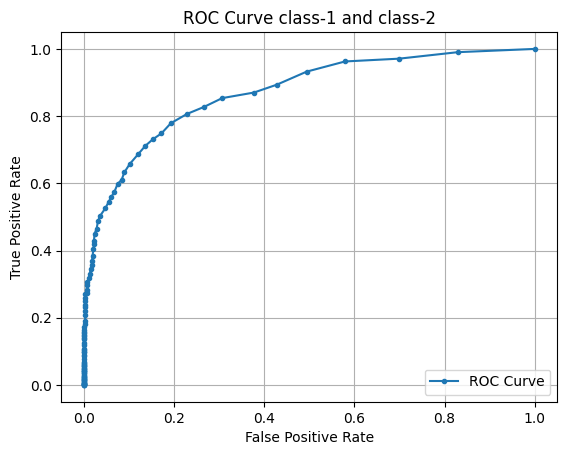

In [89]:
model_clsf_dropout = Model_Multi_Classification(
    layer_dims, drop_prob = drop_prob)
clsf_trainer.train(model_clsf_dropout, Multi_Clsf_Metrics,
                   X_train, y_train, X_val, y_val)
multi_clsf_tester.test(model_clsf_dropout, X_test, y_test)

# Q3 iii c

### Preprocessing

In [32]:
# Load data
train_imgs_npz = np.load(
    './datasets/japanese_mnist/numpy_format/kmnist-train-imgs.npz')
train_labels_npz = np.load(
    './datasets/japanese_mnist/numpy_format/kmnist-train-labels.npz')
test_imgs_npz = np.load(
    './datasets/japanese_mnist/numpy_format/kmnist-test-imgs.npz')
test_labels_npz = np.load(
    './datasets/japanese_mnist/numpy_format/kmnist-test-labels.npz')


# Extract arrays
train_val_split_idx = 5 * train_imgs_npz['arr_0'].shape[0] // 6

X_train_raw = train_imgs_npz['arr_0'][:train_val_split_idx]
X_train_flatten = np.reshape(X_train_raw, (X_train_raw.shape[0],-1)).T
y_train_raw = train_labels_npz['arr_0'][:train_val_split_idx]
y_train_one_hot = np.eye(10)[y_train_raw.astype(int).reshape(-1)].T

X_val_raw = train_imgs_npz['arr_0'][train_val_split_idx:]
X_val_flatten = np.reshape(X_val_raw, (X_val_raw.shape[0], -1)).T
y_val_raw = train_labels_npz['arr_0'][train_val_split_idx:]
y_val_one_hot = np.eye(10)[y_val_raw.astype(int).reshape(-1)].T

X_test_raw = test_imgs_npz['arr_0']
X_test_flatten = np.reshape(X_test_raw, (X_test_raw.shape[0],-1)).T
y_test_raw = test_labels_npz['arr_0']
y_test_one_hot = np.eye(10)[y_test_raw.astype(int).reshape(-1)].T


print(X_train_flatten.shape, y_train_one_hot.shape)
print(X_val_flatten.shape, y_val_one_hot.shape)
print(X_test_flatten.shape, y_test_one_hot.shape)

(784, 50000) (10, 50000)
(784, 10000) (10, 10000)
(784, 10000) (10, 10000)


In [33]:
X_train, X_val, X_test = X_train_flatten, X_val_flatten, X_test_flatten 
y_train, y_val, y_test = y_train_one_hot, y_val_one_hot, y_test_one_hot

In [34]:
def load_classmap(csv_path):
    classmap = np.genfromtxt(csv_path, delimiter=',',
                             dtype=None, encoding='utf-8', skip_header=1)
    return {int(row[0]): row[1] for row in classmap}


classmap = load_classmap('./datasets/japanese_mnist/kmnist_classmap.csv')
classmap

{0: 'U+304A',
 1: 'U+304D',
 2: 'U+3059',
 3: 'U+3064',
 4: 'U+306A',
 5: 'U+306F',
 6: 'U+307E',
 7: 'U+3084',
 8: 'U+308C',
 9: 'U+3092'}

In [35]:
class_names = [chr(int(code[2:], 16)) for code in classmap.values()]
class_names

['お', 'き', 'す', 'つ', 'な', 'は', 'ま', 'や', 'れ', 'を']

### Logistic regrssion

In [24]:
# Define the MLP architecture
layer_dims = [784, 10]  # 1-layer model

# Training hyperparameters
learning_rate = 0.1
num_iterations = 2500

lambd = 0.25  # Regularization parameter

drop_prob = 0.25  # Dropout Probability

clsf_trainer = Trainer_clsf(num_iterations, learning_rate, 5000)
multi_clsf_tester = Evaluate_multi_clsf()

### Testing non-regularised performance


Train Cost after iteration 0: 22.661637526042146 | Val Cost after iteration 0: 15.268266723718463
Train Acc. after iteration 0: 0.32812 | Val Acc. after iteration 0: 0.5577

Train Cost after iteration 500: 8.410184389741605 | Val Cost after iteration 500: 10.528472511702683
Train Acc. after iteration 500: 0.75608 | Val Acc. after iteration 500: 0.6949

Train Cost after iteration 1000: 9.287952181217856 | Val Cost after iteration 1000: 8.41601391256187
Train Acc. after iteration 1000: 0.73068 | Val Acc. after iteration 1000: 0.7559

Train Cost after iteration 1500: 7.749889748675509 | Val Cost after iteration 1500: 10.899193339284171
Train Acc. after iteration 1500: 0.77516 | Val Acc. after iteration 1500: 0.6843

Train Cost after iteration 2000: 6.865787698516202 | Val Cost after iteration 2000: 9.487303434873098
Train Acc. after iteration 2000: 0.80082 | Val Acc. after iteration 2000: 0.7247

Train Cost after iteration 2500: 10.243176854863753 | Val Cost after iteration2500: 8.8978096

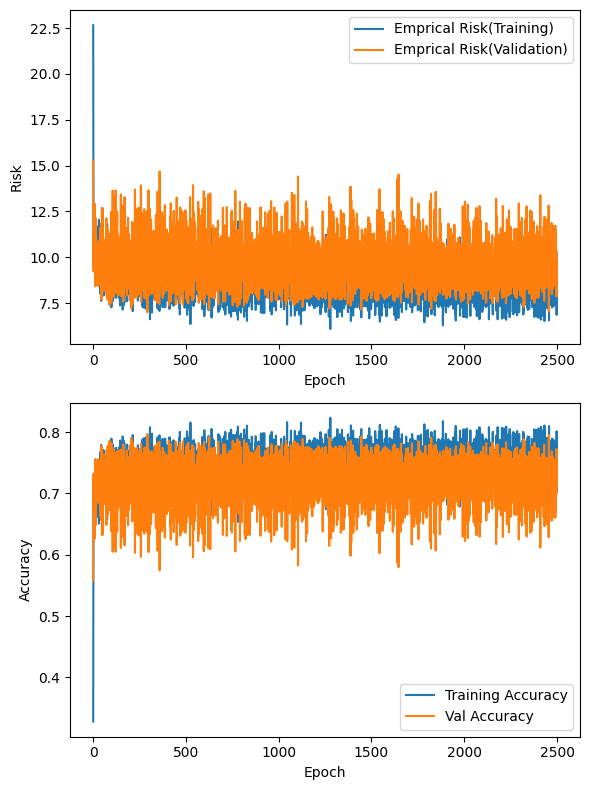

Classification Accuracy: 61.5000%
Class 0 Precision: 0.8880 Recall: 0.6900 F1 score: 0.7766
Class 1 Precision: 0.5557 Recall: 0.6930 F1 score: 0.6168
Class 2 Precision: 0.6154 Recall: 0.0160 F1 score: 0.0312
Class 3 Precision: 0.8233 Recall: 0.6850 F1 score: 0.7478
Class 4 Precision: 0.6735 Recall: 0.5590 F1 score: 0.6109
Class 5 Precision: 0.6696 Recall: 0.6850 F1 score: 0.6772
Class 6 Precision: 0.5427 Recall: 0.8270 F1 score: 0.6553
Class 7 Precision: 0.5672 Recall: 0.5360 F1 score: 0.5512
Class 8 Precision: 0.4898 Recall: 0.7660 F1 score: 0.5975
Class 9 Precision: 0.5625 Recall: 0.6930 F1 score: 0.6210


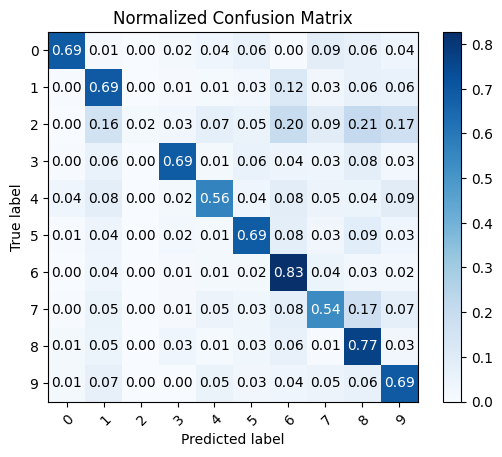

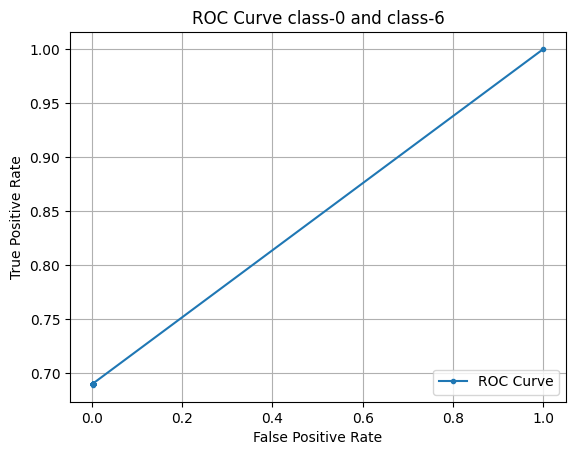

In [100]:
model_clsf_no_reg = Model_Multi_Classification(layer_dims)
clsf_trainer.train(model_clsf_no_reg, Multi_Clsf_Metrics,
                   X_train, y_train, X_val, y_val)
multi_clsf_tester.test(model_clsf_no_reg, X_test, y_test)

### Testing L2-regularised performance


Train Cost after iteration 0: 23.55073478796677 | Val Cost after iteration 0: 17.437344597232048
Train Acc. after iteration 0: 0.30872 | Val Acc. after iteration 0: 0.5012

Train Cost after iteration 500: 12.055429238122242 | Val Cost after iteration 500: 9.770861944633317
Train Acc. after iteration 500: 0.73794 | Val Acc. after iteration 500: 0.7604

Train Cost after iteration 1000: 12.964320046597544 | Val Cost after iteration 1000: 10.309998406926914
Train Acc. after iteration 1000: 0.7592 | Val Acc. after iteration 1000: 0.7686

Train Cost after iteration 1500: 12.977009568545082 | Val Cost after iteration 1500: 13.023019582120195
Train Acc. after iteration 1500: 0.7922 | Val Acc. after iteration 1500: 0.7066

Train Cost after iteration 2000: 13.877853912018818 | Val Cost after iteration 2000: 12.475571241382454
Train Acc. after iteration 2000: 0.79276 | Val Acc. after iteration 2000: 0.7356

Train Cost after iteration 2500: 17.99140819490359 | Val Cost after iteration2500: 11.9584

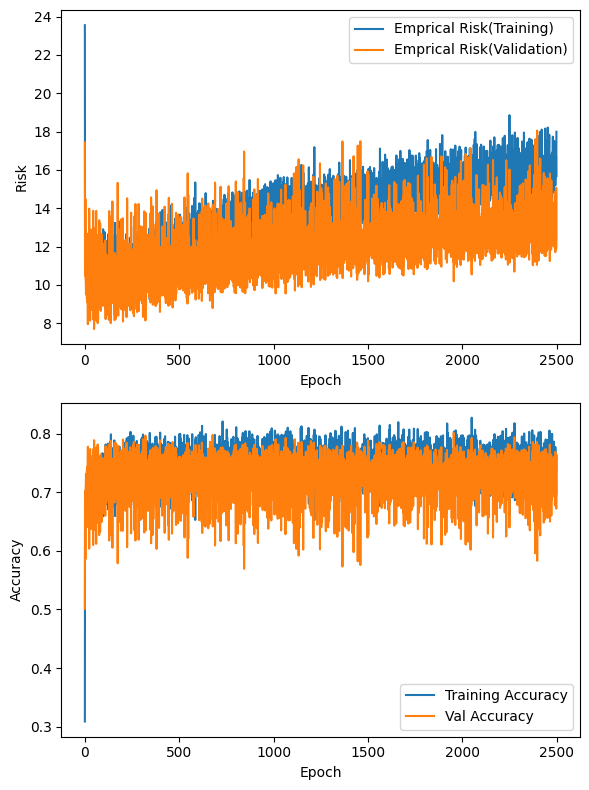

Classification Accuracy: 63.2600%
Class 0 Precision: 0.7270 Recall: 0.8360 F1 score: 0.7777
Class 1 Precision: 0.5158 Recall: 0.7200 F1 score: 0.6010
Class 2 Precision: 0.3938 Recall: 0.7320 F1 score: 0.5121
Class 3 Precision: 0.7684 Recall: 0.7400 F1 score: 0.7539
Class 4 Precision: 0.7599 Recall: 0.4810 F1 score: 0.5891
Class 5 Precision: 0.7705 Recall: 0.6210 F1 score: 0.6877
Class 6 Precision: 0.7268 Recall: 0.6120 F1 score: 0.6645
Class 7 Precision: 0.6295 Recall: 0.5810 F1 score: 0.6043
Class 8 Precision: 0.6359 Recall: 0.6200 F1 score: 0.6278
Class 9 Precision: 0.8455 Recall: 0.3830 F1 score: 0.5272


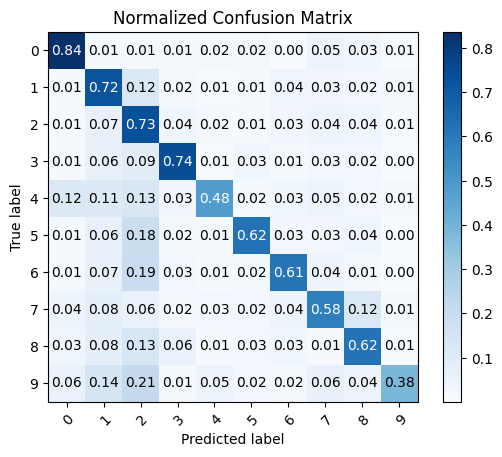

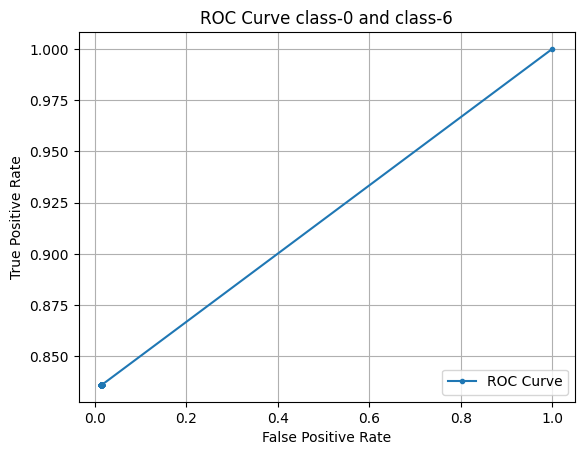

In [102]:
model_clsf_L2_reg = Model_Multi_Classification(layer_dims, lambd)
clsf_trainer.train(model_clsf_L2_reg, Multi_Clsf_Metrics,
                   X_train, y_train, X_val, y_val)
multi_clsf_tester.test(model_clsf_L2_reg, X_test, y_test)

### Testing L1-regularised performance


Train Cost after iteration 0: 23.554567534100673 | Val Cost after iteration 0: 19.74399479822454
Train Acc. after iteration 0: 0.30842 | Val Acc. after iteration 0: 0.4315

Train Cost after iteration 500: 8.915053574189233 | Val Cost after iteration 500: 10.075517906068338
Train Acc. after iteration 500: 0.75898 | Val Acc. after iteration 500: 0.7166

Train Cost after iteration 1000: 9.215637681026536 | Val Cost after iteration 1000: 8.691758478653469
Train Acc. after iteration 1000: 0.7544 | Val Acc. after iteration 1000: 0.7587

Train Cost after iteration 1500: 8.843878683692711 | Val Cost after iteration 1500: 9.01063927100976
Train Acc. after iteration 1500: 0.76772 | Val Acc. after iteration 1500: 0.7508

Train Cost after iteration 2000: 7.942002939120684 | Val Cost after iteration 2000: 9.084387628094825
Train Acc. after iteration 2000: 0.79556 | Val Acc. after iteration 2000: 0.7496

Train Cost after iteration 2500: 10.025307067405782 | Val Cost after iteration2500: 9.8224750660

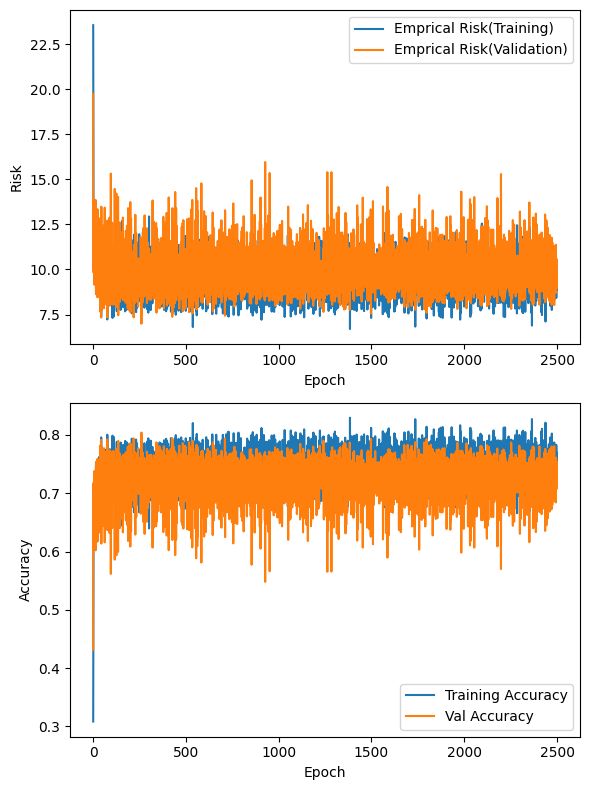

Classification Accuracy: 60.0900%
Class 0 Precision: 0.8623 Recall: 0.6890 F1 score: 0.7660
Class 1 Precision: 0.8333 Recall: 0.4200 F1 score: 0.5585
Class 2 Precision: 0.7258 Recall: 0.0450 F1 score: 0.0847
Class 3 Precision: 0.7544 Recall: 0.7250 F1 score: 0.7394
Class 4 Precision: 0.6017 Recall: 0.6420 F1 score: 0.6212
Class 5 Precision: 0.8038 Recall: 0.6270 F1 score: 0.7045
Class 6 Precision: 0.5357 Recall: 0.8110 F1 score: 0.6452
Class 7 Precision: 0.5694 Recall: 0.5090 F1 score: 0.5375
Class 8 Precision: 0.3869 Recall: 0.8380 F1 score: 0.5294
Class 9 Precision: 0.5611 Recall: 0.7030 F1 score: 0.6241


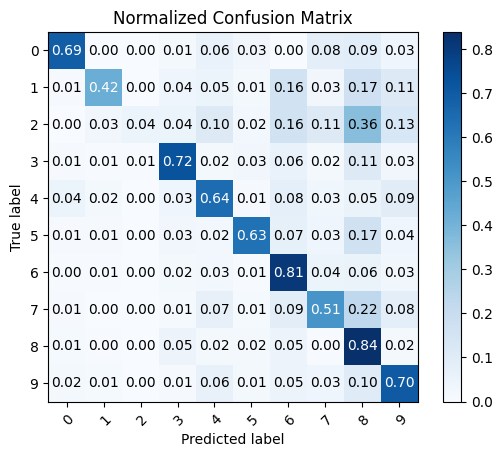

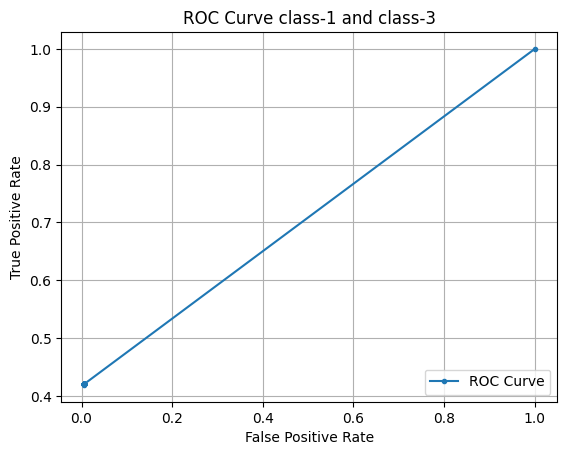

In [103]:
model_clsf_L1_reg = Model_Multi_Classification(layer_dims, lambd, 1)
clsf_trainer.train(model_clsf_L1_reg, Multi_Clsf_Metrics,
                   X_train, y_train, X_val, y_val)
multi_clsf_tester.test(model_clsf_L1_reg, X_test, y_test)

### Testing performance with dropout


Train Cost after iteration 0: 24.15470778537507 | Val Cost after iteration 0: 20.131846411977442
Train Acc. after iteration 0: 0.28848 | Val Acc. after iteration 0: 0.4171

Train Cost after iteration 500: 9.260370054135198 | Val Cost after iteration 500: 10.008884807451308
Train Acc. after iteration 500: 0.73144 | Val Acc. after iteration 500: 0.7101

Train Cost after iteration 1000: 7.878640295165519 | Val Cost after iteration 1000: 10.854682213190388
Train Acc. after iteration 1000: 0.77158 | Val Acc. after iteration 1000: 0.6853

Train Cost after iteration 1500: 8.291794252039631 | Val Cost after iteration 1500: 8.540950103157058
Train Acc. after iteration 1500: 0.75962 | Val Acc. after iteration 1500: 0.7523

Train Cost after iteration 2000: 8.71440012175632 | Val Cost after iteration 2000: 8.334064990886487
Train Acc. after iteration 2000: 0.74718 | Val Acc. after iteration 2000: 0.7584

Train Cost after iteration 2500: 7.9705082865744785 | Val Cost after iteration2500: 7.64474335

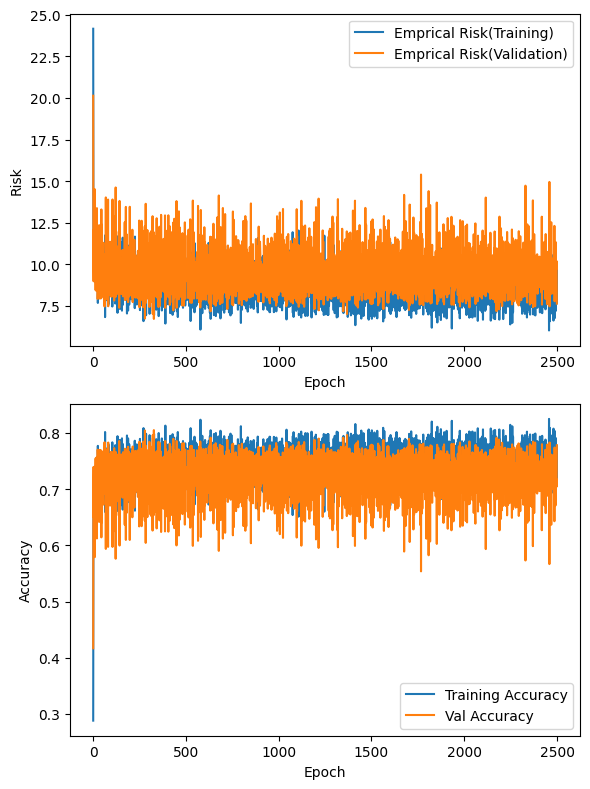

Classification Accuracy: 65.1200%
Class 0 Precision: 0.8517 Recall: 0.7410 F1 score: 0.7925
Class 1 Precision: 0.6837 Recall: 0.5900 F1 score: 0.6334
Class 2 Precision: 0.7835 Recall: 0.3510 F1 score: 0.4848
Class 3 Precision: 0.7931 Recall: 0.7130 F1 score: 0.7509
Class 4 Precision: 0.5777 Recall: 0.6880 F1 score: 0.6280
Class 5 Precision: 0.7092 Recall: 0.7000 F1 score: 0.7046
Class 6 Precision: 0.5179 Recall: 0.8260 F1 score: 0.6366
Class 7 Precision: 0.6762 Recall: 0.4970 F1 score: 0.5729
Class 8 Precision: 0.5330 Recall: 0.7590 F1 score: 0.6262
Class 9 Precision: 0.6549 Recall: 0.6470 F1 score: 0.6509


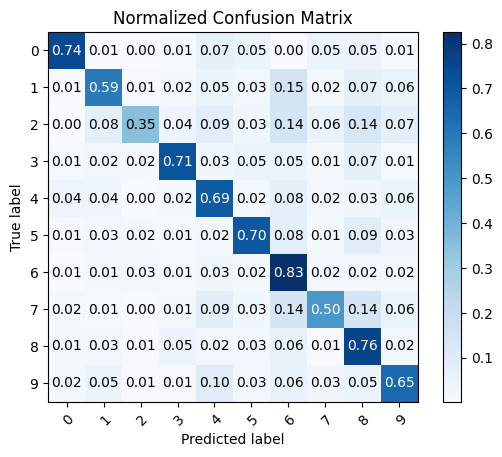

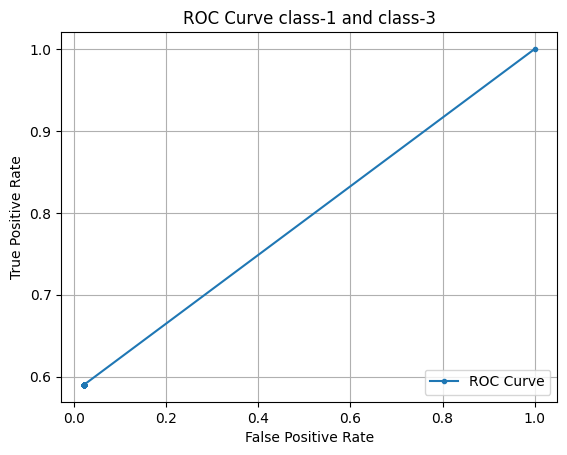

In [105]:
model_clsf_dropout = Model_Multi_Classification(
    layer_dims, drop_prob = drop_prob)
clsf_trainer.train(model_clsf_dropout, Multi_Clsf_Metrics,
                   X_train, y_train, X_val, y_val)
multi_clsf_tester.test(model_clsf_dropout, X_test, y_test)

### MLP

In [42]:
# Define the MLP architecture
layer_dims = [784, 300, 100, 10]  # 3-layer model

# Training hyperparameters
learning_rate = 0.05
num_iterations = 1000

lambd = 0.05  # Regularization parameter

drop_prob = 0.25  # Dropout Probability

clsf_trainer = Trainer_clsf(num_iterations, learning_rate, 50000)
multi_clsf_tester = Evaluate_multi_clsf()

### Testing non-regularised performance


In [43]:
model_clsf_no_reg = Model_Multi_Classification(layer_dims)
clsf_trainer.train(model_clsf_no_reg, Multi_Clsf_Metrics,
                   X_train, y_train, X_val, y_val)
multi_clsf_tester.test(model_clsf_no_reg, X_test, y_test)

Train Cost after iteration 0: 2.34764833265303 | Val Cost after iteration 0: 2.1894579217534664
Train Acc. after iteration 0: 0.10656 | Val Acc. after iteration 0: 0.2103

Train Cost after iteration 50: 2.31589670796091 | Val Cost after iteration 50: 2.340209660508825
Train Acc. after iteration 50: 0.10052 | Val Acc. after iteration 50: 0.0974



### Testing L2-regularised performance


In [ ]:
model_clsf_L2_reg = Model_Multi_Classification(layer_dims, lambd)
clsf_trainer.train(model_clsf_L2_reg, Multi_Clsf_Metrics,
                   X_train, y_train, X_val, y_val)
multi_clsf_tester.test(model_clsf_L2_reg, X_test, y_test)

### Testing L1-regularised performance


In [ ]:
model_cslf_L1_reg = Model_Multi_Classification(layer_dims, lambd, 1)
clsf_trainer.train(model_clsf_L1_reg, Multi_Clsf_Metrics,
                   X_train, y_train, X_val, y_val)
multi_clsf_tester.test(model_clsf_L1_reg, X_test, y_test)

### Testing performance with dropout


In [ ]:
model_cslf_dropout = Model_Multi_Classification(
    layer_dims, drop_prob = drop_prob)
clsf_trainer.train(model_clsf_dropout, Multi_Clsf_Metrics,
                   X_train, y_train, X_val, y_val)
multi_clsf_tester.test(model_clsf_dropout, X_test, y_test)

# SVM 

In [226]:
import numpy as np
import matplotlib.pyplot as plt
import cvxopt as cp

In [227]:
class SVM:
    def __init__(self, kernel="poly", gamma=None, deg=10 , a=1.0, C=1):
        self.kernel=kernel
        self.gamma=gamma
        self.degree=deg
        self.a=a
        self.C=C
        self.lambdas=None
        self.support_vectors_x=None
        self.support_vectors_y=None
        self.W=None
        self.b=None
        self.is_fit=False

        if kernel=="linear":
            self.kernel_func=self.linear_kernel
            
        if kernel=="poly":
            self.kernel_func=self.polynomial_kernel

        elif kernel=="rbf":
            self.kernel_func=self.rbf_kernel

        elif kernel=="sigmoid":
            self.kernel_func=self.sigmoid_kernel

    
    def linear_kernel(self, x_i, x_j):
        return np.dot(x_i, x_j)

    def polynomial_kernel(self,x_i,x_j):
        dot_products=np.dot(x_i,x_j)
        scaled_dot_products=self.gamma*dot_products
        shifted_dot_products=scaled_dot_products+ self.a
        return shifted_dot_products** self.degree

    def rbf_kernel(self,x_i,x_j):
        sq_distance=np.dot(x_i-x_j ,x_i-x_j)
        return np.exp(-self.gamma *sq_distance)

    def sigmoid_kernel(self,x_i,x_j):
        return np.tanh((x_i,x_j) +self.a)


    def fit(self,X,y):
        n_samples,n_features=X.shape
        
        if not self.gamma:
            self.gamma=1/(n_features *X.var())

        K=np.zeros((n_samples,n_samples))
        for i in range(n_samples):
            for j in range(n_samples):
                K[i ,j]=self.kernel_func(X[i],X[j])

        P=cp.matrix(np.outer(y,y) * K)
        q=cp.matrix(- np.ones(n_samples))

        if self.C:
            G = cp.matrix(np.vstack(( -np.eye(n_samples),np.eye(n_samples))))
            h=cp.matrix(np.hstack(( np.zeros(n_samples) , np.ones(n_samples) *self.C)))

        else:
            G=cp.matrix( -np.eye(n_samples))
            h=cp.matrix(np.zeros(n_samples))

        A=cp.matrix(y.reshape(1,-1).astype(np.double))
        b=cp.matrix(np.zeros(1))

        cp.solvers.options["show_progress"] = False
        cp.solvers.options["maxiters"] = 200

        try:
            sol=cp.solvers.qp(P, q, G, h, A, b)
        except ValueError as e:
            print(f"Error: {e}")
            return

        lambdas=np.ravel(sol["x"])

        if self.C:
            is_sv=(lambdas>=1e-5) & (lambdas<=self.C)
        else:
            is_sv= lambdas>=1e-5

        self.support_vectors_x= X[is_sv]
        self.support_vectors_y= y[is_sv]
        self.lambdas= lambdas[is_sv]

        
        support_vec_index=np.arange(len(lambdas))[is_sv]
        self.b=0
        for i in range(len(self.lambdas)):
            self.b += self.support_vectors_y[i]
            self.b -= np.sum( self.lambdas * self.support_vectors_y * K[support_vec_index[i] , is_sv])
        self.b /= len(self.lambdas)


        
        if self.kernel=="linear":
            self.W= np.zeros(n_samples)
            for i in range(len(self._lambdas)):
                self.W += self._lambdas[i] * self._support_vectors_x[i] * self._support_vectors_y[i]
        else:
            self.W = None
            
        self.is_fit = True



    def project(self,X):
        if not self.is_fit:
            raise ValueError("Model not fit")

        if self.W is not None:
            return np.dot(X, self.W) + self.b
        else:
            y_predict =np.zeros(len(X))
            for k in range(len(X)):
                for lda,sv_x,sv_y in zip( self.lambdas ,self.support_vectors_x, self.support_vectors_y):
                    y_predict[k] += lda * sv_y * self.kernel_func(X[k], sv_x)
            return y_predict+self.b


    def predict(self,X):
        return np.sign(self.project(X))
 

In [228]:
class ClassificationMetrics:
    
    def accuracy(y_true, y_pred):
        return np.mean(y_true == y_pred)

    
    def precision(y_true, y_pred):
        true_positive = np.sum((y_true == 1) & (y_pred == 1))
        false_positive = np.sum((y_true == -1) & (y_pred == 1))
        return true_positive / (true_positive + false_positive) if (true_positive + false_positive) != 0 else 0

    
    def recall(y_true, y_pred):
        true_positive = np.sum((y_true == 1) & (y_pred == 1))
        false_negative = np.sum((y_true == 1) & (y_pred == -1))
        return true_positive / (true_positive + false_negative) if (true_positive + false_negative) != 0 else 0

    
    def f1_score(y_true, y_pred):
        precision = ClassificationMetrics.precision(y_true, y_pred)
        recall = ClassificationMetrics.recall(y_true, y_pred)
        return 2 * (precision * recall) / (precision + recall) if (precision + recall) != 0 else 0



##   Binary classification

In [229]:
path1='./datasets/binary_classification_data_group_12_train.txt'
data_original_binary=np.loadtxt(path1,skiprows=1)
data_binary=data_original_binary.copy()

X = data_binary[:, :-1]
y = data_binary[:, -1]
y = np.where(y == 0, -1, 1)

train_ratio = 0.1
split_index = int(train_ratio * len(X))

X_train, X_test = X[ :split_index, : ], X[split_index: , : ]
y_train, y_test = y[ :split_index], y[split_index: ]

In [230]:
svm_model = SVM(kernel="rbf")
svm_model.fit(X_train, y_train)

y_pred = svm_model.predict(X_test)

In [231]:
accuracy = ClassificationMetrics.accuracy(y_test, y_pred)
precision = ClassificationMetrics.precision(y_test, y_pred)
recall = ClassificationMetrics.recall(y_test, y_pred)
f1_score = ClassificationMetrics.f1_score(y_test, y_pred)

In [232]:
print("Accuracy: {:.2f} %".format(accuracy * 100))
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1_score)

Accuracy: 75.37 %
Precision: 0.7535862288810966
Recall: 0.7521476296531976
F1 Score: 0.7528662420382166


### using sklearn checking how my model is performing(just comparison purpose)

In [233]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report, accuracy_score

svm_classifier = SVC(kernel='rbf')

# Fit the classifier to the training data
svm_classifier.fit(X_train, y_train)

# Predict the labels for the test set
y_pred = svm_classifier.predict(X_test)

# Evaluate the performance of the classifier
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Print classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

Accuracy: 0.7536507936507937
Classification Report:
              precision    recall  f1-score   support

          -1       0.75      0.75      0.75      6314
           1       0.75      0.75      0.75      6286

    accuracy                           0.75     12600
   macro avg       0.75      0.75      0.75     12600
weighted avg       0.75      0.75      0.75     12600



## Multiclass classification

In [234]:
path2 = './datasets/multi_class_classification_data_group_12_train.txt'
data_original_multi=np.loadtxt(path2,skiprows=1)
data_multi=data_original_multi.copy()

X_mul = data_multi[:, :-1]
y_mul = data_multi[:, -1]

train_ratio = 0.005
split_index = int(train_ratio * len(X_mul))

X_train, X_test = X_mul[ :split_index, : ], X_mul[split_index: , : ]
y_train, y_test = y_mul[ :split_index], y_mul[split_index: ]

In [235]:
def train_one_vs_rest_models(X_train, y_train):
    models = []
    for i in range(10):
        svm_model = SVM(kernel="poly")
        y_binary = np.where(y_train == i, 1, -1)
        svm_model.fit(X_train, y_binary)
        models.append(svm_model)
    return models

def predict_one_vs_rest(models, X_test):
    predictions = []
    for model in models:
        predictions.append(model.predict(X_test))
    return np.argmax(predictions, axis=0)

In [236]:
svm_models = train_one_vs_rest_models(X_train, y_train)

y_pred = predict_one_vs_rest(svm_models, X_test)

In [237]:
accuracy = ClassificationMetrics.accuracy(y_test, y_pred)


In [238]:
print("Accuracy:", accuracy)


Accuracy: 0.1409475951184494


### using sklearn checking how my model is performing(just comparison purpose)

In [240]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report, accuracy_score

svm_classifier = SVC(kernel='poly', degree=10)

# Fit the classifier to the training data
svm_classifier.fit(X_train, y_train)

# Predict the labels for the test set
y_pred = svm_classifier.predict(X_test)

# Evaluate the performance of the classifier
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


Accuracy: 0.12030150753768844


# CNN

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
class Conv:
    lambda_regularize_l2 = 0
    lambda_regularize_l1 = 0
    learning_rate = 0.1
    def __init__(self,in_ch,out_ch,size=3,padding=0,stride = 1):
        """
        assuming out input is of type (in_ch,h,w)
        in_ch is number inputs of size h,w. this is output from previous layer
        num_filters is number of filters to be used
        size is size dimension of square filter
        filters is 4d array of filters with random value initialized
        """
        self.in_channels = in_ch
        self.out_channels = out_ch
        self.filter_size = size
        self.filters = np.random.randn(out_ch,in_ch, size, size)
        self.padding = padding
        self.stride = stride
        
    def iterate_regions(self,inp):
        stride = self.stride
        s= self.filter_size
        c_in,h,w = inp.shape   
        
        
        for i in range(0,h-s,stride):
            for j in range(0,w-s,stride):
                im_region = inp[:,i:i+s, j:j+s]
                yield im_region, i, j
                
    def forward(self,inp):
        #inp is 3dd array with 0th axis having corresponding to input channels 
        k = self.filter_size
        p = self.padding
        s = self.stride
        _,h,w = inp.shape
        #h,w=inp.shape
        out_ch,in_ch,_,_ = self.filters.shape
        h = int((h-k+2*p)/s)+1
        w = int((w-k+2*p)/s)+1
        inp = np.pad(inp, pad_width=p)
        self.last_input = inp
        output = np.zeros((out_ch,h,w))
        
        
        for o in range(out_ch):   
            for wind,i,j in self.iterate_regions(self.last_input): 
                #fix below statment
                #print(output.shape,self.filters[o].shape,wind.shape)
                output[o,i,j]=np.sum(self.filters[o]*wind)      
        self.last_output = output
        return output
        
    def backprop(self,dl_dout):
        """
        dl_out is matrix with elements dl_out[cout] for cout channel
        dilated_dl_dout is dilated version of dl_dout array
        
        """
        filt_cout,filt_cin,filt_row,filt_col = self.filters.shape
        dilated_dl_dout = self.dilation4d(dl_dout)
        dl_df = np.zeros(self.filters.shape)
        dl_dx = np.zeros(self.last_input.shape)
        _,dil_row,dil_col = dilated_dl_dout.shape
        #calculating dl_df
        for co in range(filt_cout):
            for ci in range(filt_cin):
                for i in range(filt_row-dil_row+1):
                    for j in range(filt_col-dil_col+1):
                        dl_df[co,ci,i,j] += np.sum(self.last_input[ci,i:i+dil_row,j:j+dil_col]*dilated_dl_dout[co])
        padded_dl_dout = np.pad(dilated_dl_dout, ((0,0),(self.filter_size-1,  self.filter_size-1), ( self.filter_size-1,  self.filter_size-1)))
        #_,prow,pcol = padded_dl_dout.shape
        #calculating dl_dx
        cin,row,col = self.last_input.shape
        for k in range(cin):
            for i in range(row):
                for j in range(col):
                    for co in range(filt_cout):
                        #print(k,i,j,co)
                        dl_dx[k,i,j] += np.sum(padded_dl_dout[co,i:i+filt_row,j:j+filt_col]*self.filters[co,k,::-1,::-1])
        l1 = np.full(self.filters.shape,self.lambda_regularize_l1)
        mask_l1 = np.where(self.filters >0, l1, -l1)        
        self.filters=self.filters-self.learning_rate*(dl_df+self.filters*self.lambda_regularize_l2+mask_l1)
        #self.filters-=dl_df
        return dl_dx
        
    def dilation4d(self,arr):
        c,row,col=arr.shape
        dilated = np.zeros((c,row+(row-1)*(self.stride-1),col+(col-1)*(self.stride-1)))
        #print(dilated.shape)
        dilated[:,::self.stride,::self.stride]=arr[:,:,:]
        return dilated
        

In [ ]:
class Maxpool:
    #padding, if any is done with edge values
    def __init__(self,ksize=2,stride=2,padding=0):
        self.filter_size = ksize
        self.stride=stride
        self.pad_width=padding

    def iterate_regions(self,inp):
        stride = self.stride
        size= self.filter_size
        h,w = inp.shape   
        for i in range(0,h-size+1,stride):
            for j in range(0,w-size+1,stride):
                im_region = inp[i:i+size,j:j+size]
                yield im_region, int(i/stride), int(j/stride)
    
    def forward(self,inp):
        C,H,W = inp.shape
        inp = np.pad(inp, ((0,0),(self.pad_width, self.pad_width), (self.pad_width, self.pad_width)),'edge')
        self.last_input = inp
        out_h = int((H-self.filter_size+2*self.pad_width)/self.stride)+1
        out_w = int((W-self.filter_size+2*self.pad_width)/self.stride)+1
        out = np.zeros((C,out_h,out_w))
        
        
        
        for c in range(C):   
            for wind,i,j in self.iterate_regions(self.last_input[c]): 
                out[c,i,j]=np.max(wind)
        
        self.last_output=out
        return out
                    
    def backprop(self,dl_dout):
        stride = self.stride
        dl_din = np.zeros(self.last_input.shape)
        C,H,W = self.last_input.shape
        wind_row = wind_col = self.filter_size
        
        for c in range(C):   
            for wind,i,j in self.iterate_regions(self.last_input[c]): 
                for row in range(wind_row):
                    for col in range(wind_col):
                        if self.last_output[c,i,j]==wind[row,col]:
                            dl_din[c,i*stride+row,j*stride+col] = dl_dout[c,i,j]
    
        return dl_din
        
        

In [ ]:
class Relu:
    def __init__(self):
        return None
    def forward(self,inp):
        
        self.last_input = inp
        
        #implementing max(0,x)
        self.last_output = np.where(inp >0, inp, 0)
        return self.last_output
    
    def backprop(self,dl_dout):
        
        dl_din = np.where(self.last_input>0,dl_dout,0)
        return dl_din
        

In [ ]:
class Flatten:
  def __init__(self):
    self.orig_shape=None
  def forward(self,x):
    self.orig_shape = x.shape
    return x.reshape([-1,1])

  def backprop(self,x):
    op=x.reshape(self.orig_shape)
    #print("flatten back op",op.shape)
    return op

In [ ]:
class Dense:
  def __init__(self,inp,out):
    self.inp=inp
    self.out=out
    self.w=np.random.rand(out,inp)
    self.store=None

  def forward(self,x):
    self.store=x
    op=(self.w)@x
    return op

  def backprop(self,dx,stp=0.01):
    
    z=self.w.T@dx
    self.w=self.w-stp*dx@(self.store).T
    return z

In [ ]:
class Softmax:
  def __init__(self):
    self.store=None

  def forward(self,x):
    exps = np.exp(x-np.max(x))
    op = exps/np.sum(exps)
    self.store=op
    return op

  def backprop(self,x):
    softmax_derivative = np.diagflat(self.store) - np.dot(self.store, self.store.T)
    grad = softmax_derivative@x
    return grad

In [ ]:
class ReLU:
  def __init__(self):
    self.map=None

  def forward(self,x):
    mask = (x > 0)
    self.map = mask.astype(int)
    op=self.map*x
    return op

  def backprop(self,x):
    
    return x*self.map

In [ ]:
def cross_entropy_loss(true_class,predicted_y):
    return -np.log(predicted_y[true_class])

def gradient(true_class,predicted_y):
    dl_dout = np.zeros(predicted_y.shape)
    #adding a small value to prevent divide by zero
    #print(true_class)
    dl_dout[true_class] = -1/(predicted_y[true_class]+0.0000001)
    return dl_dout

In [ ]:
def calculate_accuracy(true_class, predicted_y):
  accuracy = np.mean(np.equal(true_class, predicted_y))
  return accuracy


In [ ]:
def randomised_trainingset(setx,sety,size,classes):
    # Create a list of indices
    _,c,h,w = setx.shape
    x = np.zeros((size,c,h,w))
    y = np.zeros(size,dtype = int)
    
    perclass = int(len(sety)/classes)
    new_perclass = int(size/classes)
    
    for i in range(classes):
        indices =  np.random.permutation(perclass)
        #print(x[0:0+new_perclass,:,:,:].shape,x.shape,indices[:new_perclass].shape)
        # Select the elements from the array using the list of indices
        x[i:i+new_perclass,:,:,:] = np.take(setx[i:i+perclass,:,:,:], indices[:new_perclass],axis=0)
        y[i:i+new_perclass] = np.take(sety[i:i+perclass], indices[:new_perclass])

    randomize = np.arange(size)
    np.random.shuffle(randomize)
    p,q = x[randomize[0]],y[randomize[0]]
    x = x[randomize]
    y = y[randomize]
    # if np.all(p==x[0]) and np.all(q == y[0]):
    #     print("Yay!")
    # else:
    #     print("nope!")
    return x,y
        
   

In [ ]:
class Cnn:
    def __init__(self, regularise:str):
        if regularise=='l2':
            self.l1 = Conv(1,16,5,0,1)
            self.l1.lambda_regularise_l2 =1
        elif regularise == 'l1':
            self.l1 = Conv(1,16,5,0,1)
            self.l1.lambda_regularise_l1 =1
            
        else:
            self.l1 = Conv(1,16,5,0,1)
        self.l2 = Maxpool(5,5,1)
        self.l3 = Relu()
        self.l7 = Flatten()
        self.l10=Dense(400,10)
        self.l11=ReLU()
        self.l12=Softmax()
    def forward(self,x):
        out = self.l1.forward(x)
        
        out = self.l2.forward(out)
        
        out = self.l3.forward(out)
          
        out = self.l7.forward(out) 
        
        out = self.l10.forward(out)
        
        out = self.l11.forward(out)
        
        out = self.l12.forward(out)
        return out
    def backprop(self,dl_dout):
        dl_din = self.l12.backprop(dl_dout)
        dl_din = self.l11.backprop(dl_din)
        
        dl_din = self.l10.backprop(dl_din)
        
        dl_din = self.l7.backprop(dl_din)
        dl_din = self.l3.backprop(dl_din)
        dl_din = self.l2.backprop(dl_din)
        dl_din = self.l1.backprop(dl_din)
    def train(self,train_x,train_y):
        epoch = 2
        val_acc = []
        for j in range(epoch):
            x,y = randomised_trainingset(train_x,train_y,5000,10)
            
            #print(x.shape,y.shape)
            predicted_y = np.zeros(y.shape)
            for i in range(len(x)):
                out = self.forward(x[i])
                predicted_y[i] = np.argmax(out)
                dl_dout = gradient(y[i],out)
                self.backprop(dl_dout)
                
            valx,valy = randomised_trainingset(train_x,train_y,1000,10)
            
            predicted_y = np.zeros(valy.shape)
            for i in range(len(valx)):
                out = self.forward(valx[i])
                predicted_y[i] = np.argmax(out)
            acc = calculate_accuracy(y[:i], predicted_y[:i])
            val_acc.append(acc)
            
        epoc = np.arange(epoch)
        val = np.array(val_acc)
        
        plt.plot(epoc,val)
        plt.show()

    def test(self,test_x,test_y):
        predicted_y = np.zeros(test_y.shape)
        for i in range(len(test_x)):
            
            out = self.forward(test_x[i])
            predicted_y[i] = np.argmax(out)
            
        acc = calculate_accuracy(test_y, predicted_y)
        print(f"accuracy is {acc*100}")

In [ ]:
#loading the training data

train_x = np.load('trainCNN/kmnist-train-imgs.npz')['arr_0']
train_y = np.load('trainCNN/kmnist-train-labels.npz')['arr_0']
# print(train_x.shape,train_y.shape)
train_x =np.array(train_x,dtype = 'float')/255.0
train_y = np.array(train_y, dtype = int)
#code debuggin
train_x = train_x
train_y = train_y
train_x = np.array(train_x)

#train_x = train_x[:,np.newaxis,:,:]
train_x = train_x[:,np.newaxis,:,:]
#sorting and using data

xylist = [[train_x[i],train_y[i]] for i in range(60000)]
xylist.sort(key = lambda l: l[1])
train_x_list = xylist[:][0]
train_x = np.array(train_x)
train_y_list = xylist[:][1]
train_y = np.array(train_y)
#train_x.shape,train_y.shape

In [ ]:
#testing data
test_x = np.load('testCNN/kmnist-test-imgs.npz')['arr_0']
test_y = np.load('testCNN/kmnist-test-labels.npz')['arr_0']
# print(test_x.shape,test_y.shape)
test_x =np.array(test_x,dtype = 'float')/255.0
test_y = np.array(test_y, dtype = int)
#code debuggin
test_x = test_x
test_y = test_y
test_x = np.array(test_x)

#test_x = test_x[:,np.newaxis,:,:]
test_x = test_x[:,np.newaxis,:,:]

In [ ]:
model1 = Cnn(regularise = 'none')
model2 = Cnn(regularise = 'l2')
model3 = Cnn(regularise = 'l1')

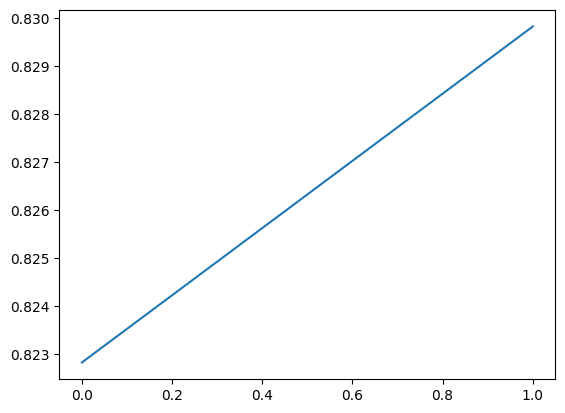

accuracy is 24.19


In [ ]:
#without regularization
model1.train(train_x,train_y)
model1.test(test_x,test_y)

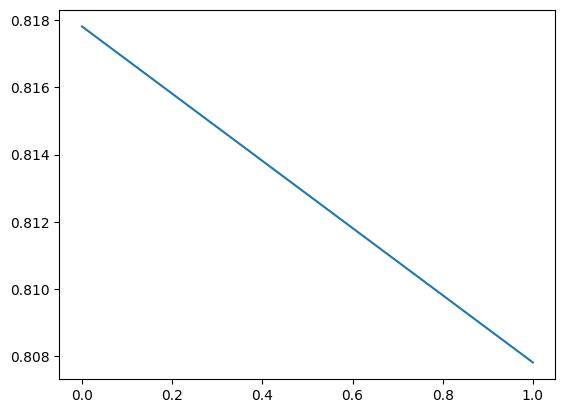

accuracy is 14.399999999999999


In [ ]:
#with l2 regularization
model2.train(train_x,train_y)
model2.test(test_x,test_y)

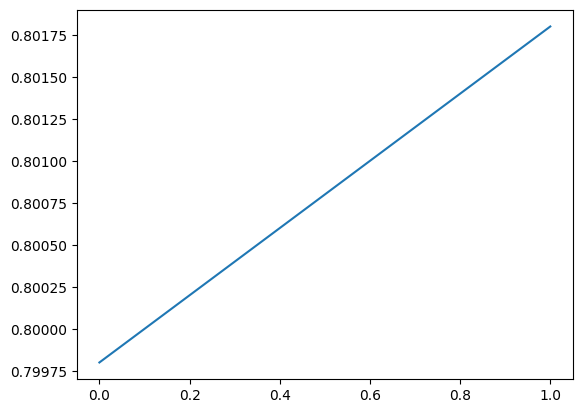

accuracy is 17.150000000000002


In [ ]:
#with l1 regularization
model3.train(train_x,train_y)
model3.test(test_x,test_y)